In [23]:
import math
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif']=['SimHei'] #用来正常显示中文标签
plt.rcParams['axes.unicode_minus']=False #用来正常显示负号
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split,cross_validate,GridSearchCV
import lightgbm as lgb
import seaborn as sns

In [24]:
xlsx_file = pd.ExcelFile('./2021-2022_O3&气象五参.xlsx')
sheet_names = xlsx_file.sheet_names
data = pd.DataFrame()

# datat= pd.read_excel('./预测数据.xlsx')
# datat

#得到2021和2022年的数据
df1 = xlsx_file.parse(sheet_names[0])
df2 = xlsx_file.parse(sheet_names[1])
data = pd.concat([df1,df2])
data = data.reset_index(drop=True)
# datat.info()
columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
        if column in data.columns:
            data[column] = data[column].interpolate(method='linear')

def daypart(hour):
    if hour in [2,3,4,5]:
        return "dawn"
    elif hour in [6,7,8,9]:
        return "morning"
    elif hour in [10,11,12,13]:
        return "noon"
    elif hour in [14,15,16,17]:
        return "afternoon"
    elif hour in [18,19,20,21]:
        return "evening"
    else: return "midnight"
data['C1705_DATETIME'] = pd.to_datetime(data['C1705_DATETIME'])
data['year'] = data.C1705_DATETIME.dt.year
data['month'] = data.C1705_DATETIME.dt.month
data['day'] = data.C1705_DATETIME.dt.day
data['hour'] = data.C1705_DATETIME.dt.hour
# data['weekday'] = data.C1705_DATETIME.dt.weekday
# data['day_of_Week'] = data.C1705_DATETIME.dt.dayofweek
to_one_hot = data['C1705_DATETIME'].dt.day_name()
# second: one hot encode to 7 columns
days = pd.get_dummies(to_one_hot)
#display data
for column in days.columns:
    data[column] = days[column]
    
raw_dayparts = data['hour'].apply(daypart)
# one hot encoding
dayparts = pd.get_dummies(raw_dayparts)
for column in dayparts.columns:
    data[column] = dayparts[column]


mask = data['O3VAL'] < 0  # 创建一个布尔掩码，表示负值
data.loc[mask, 'O3VAL'] *= -1  # 将负值取反
data1 = data[data['C0007_PNAME']=='八大关街道']
data2 = data[data['C0007_PNAME']=='北宅街道']
data3 = data[data['C0007_PNAME']=='登州路街道']
data4 = data[data['C0007_PNAME']=='上马街道']
data5 = data[data['C0007_PNAME']=='兴城路街道']


import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import STL
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# data2['O3VAL'] = scaler.fit_transform(np.array(data2['O3VAL'].values.reshape(-1, 1)))
data5['QIWENVAL'] = scaler.fit_transform(np.array(data5['QIWENVAL'].values.reshape(-1, 1)))
data5['FSVAL'] = scaler.fit_transform(np.array(data5['FSVAL'].values.reshape(-1, 1)))
data5['FXVAL'] = scaler.fit_transform(np.array(data5['FXVAL'].values.reshape(-1, 1)))
data5['SHIDUVAL'] = scaler.fit_transform(np.array(data5['SHIDUVAL'].values.reshape(-1, 1)))
data5['YALIVAL'] = scaler.fit_transform(np.array(data5['YALIVAL'].values.reshape(-1, 1)))


C:\Users\lenovo\AppData\Local\Temp\ipykernel_17460\1138067705.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data5['QIWENVAL'] = scaler.fit_transform(np.array(data5['QIWENVAL'].values.reshape(-1, 1)))
C:\Users\lenovo\AppData\Local\Temp\ipykernel_17460\1138067705.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data5['FSVAL'] = scaler.fit_transform(np.array(data5['FSVAL'].values.reshape(-1, 1)))
C:\Users\lenovo\AppData\Local\Temp\ipykernel_17460\1138067705.py:70: SettingWithCopyWarning: 
A value is

In [25]:
datat= pd.read_excel('7.30预测.xls')
datat = datat[datat['C0007_PNAME'] == '兴城路街道']
datat = datat.rename(columns={"TO_CHAR(H.C1705_DATETIME,'YYYY": '日期'})

zhihou = 28*24+1

datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL
8701,13757,兴城路街道,2024-04-01 00,8.807,1.310,153.528,67.285,1011.267,86.0
8702,13757,兴城路街道,2024-04-01 01,8.436,0.882,161.294,72.292,1011.394,81.0
8703,13757,兴城路街道,2024-04-01 02,8.258,0.723,143.887,75.331,1011.496,77.0
8704,13757,兴城路街道,2024-04-01 03,8.100,0.716,156.500,77.002,1011.209,78.0
8705,13757,兴城路街道,2024-04-01 04,8.188,0.749,187.407,78.490,1011.078,77.0
...,...,...,...,...,...,...,...,...,...
10880,13757,兴城路街道,2024-06-30 19,27.485,1.278,169.834,62.387,997.681,131.0
10881,13757,兴城路街道,2024-06-30 20,25.785,1.368,137.017,72.737,998.186,119.0
10882,13757,兴城路街道,2024-06-30 21,25.102,1.317,133.522,75.648,998.353,108.0
10883,13757,兴城路街道,2024-06-30 22,24.865,1.149,139.052,78.298,998.893,95.0


In [26]:
datat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2184 entries, 8701 to 10884
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   C0007_SUBSTATION_ID  2184 non-null   int64  
 1   C0007_PNAME          2184 non-null   object 
 2   日期                   2184 non-null   object 
 3   QIWENVAL             2183 non-null   float64
 4   FSVAL                2183 non-null   float64
 5   FXVAL                2171 non-null   float64
 6   SHIDUVAL             2183 non-null   float64
 7   YALIVAL              2183 non-null   float64
 8   O3VAL                2155 non-null   float64
dtypes: float64(6), int64(1), object(2)
memory usage: 170.6+ KB


In [27]:
columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
    if column in datat.columns:
        datat[column] = datat[column].interpolate(method='linear')

In [28]:
datat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2184 entries, 8701 to 10884
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   C0007_SUBSTATION_ID  2184 non-null   int64  
 1   C0007_PNAME          2184 non-null   object 
 2   日期                   2184 non-null   object 
 3   QIWENVAL             2184 non-null   float64
 4   FSVAL                2184 non-null   float64
 5   FXVAL                2184 non-null   float64
 6   SHIDUVAL             2184 non-null   float64
 7   YALIVAL              2184 non-null   float64
 8   O3VAL                2184 non-null   float64
dtypes: float64(6), int64(1), object(2)
memory usage: 170.6+ KB


In [29]:
import os
import pandas as pd
def get_season(month):
    if month in [2, 3, 4]:
        return 1
    elif month in [5, 6, 7, 8]:
        return 2
    elif month in [9, 10, 11]:
        return 3
    elif month in [12, 1]:
        return 4
def calculate_wind_speed(U, V):
    return np.sqrt(U**2 + V**2)   

def calculate_wind_direction(U, V):
    # 确保U和V没有缺失值
    U = np.nan_to_num(U)
    V = np.nan_to_num(V)
    direction = np.arctan2(U, V) * (180 / np.pi)  # 转换为角度
    direction = np.mod(direction + 360, 360)  # 确保风向在0到360度之间
    return direction

folder_path = "./wrfout/"
files = os.listdir(folder_path)
columns_to_convert = ['U10', 'V10', '气温开尔文', 'YALIVAL', 'SHIDUVAL']
df_list = []
date_format = "%Y-%m-%d_%H_%M_%S"
for file in files:
    # 获取完整路径
    file_path = os.path.join(folder_path, file)
    data = pd.read_csv(file_path, delimiter='\s+', header=None, engine='python',skiprows=1,
                       usecols=[0, 1, 2, 3, 5, 6, 7],
                       names=['日期', '站点', 'U10', 'V10', '气温开尔文', 'YALIVAL', 'SHIDUVAL'])
    data = data[data['站点'] == 'xingdenglu']
    data['year'] = data['日期'].str[:4].astype(int)
    data['month'] = data['日期'].str[5:7].astype(int)
    data['day'] = data['日期'].str[8:10].astype(int)
    data['hour'] = data['日期'].str[11:13].astype(int)
    for column in columns_to_convert:
        data[column] = pd.to_numeric(data[column], errors='coerce')
        data['FSVAL'] = calculate_wind_speed(data['U10'], data['V10'])
        data['FXVAL'] = calculate_wind_direction(data['U10'], data['V10'])
    data['QIWENVAL'] = data['气温开尔文'] - 273.15
    columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
    for column in columns_to_interpolate:
        if column in data.columns:
            data[column] = data[column].interpolate(method='linear')
    data['日期'] = pd.to_datetime(data['日期'], format=date_format)
    df_list.append(data)

def is_weekend_series(series):
    def is_weekday(date):
        weekday = date.weekday()
        return weekday >= 5

    return series.apply(is_weekday)

df_list 

[                     日期          站点   U10   V10   气温开尔文  YALIVAL  SHIDUVAL  \
 4   2024-05-09 00:00:00  xingdenglu -2.90  2.76  287.51  1020.26     53.82   
 9   2024-05-09 01:00:00  xingdenglu -2.50  3.07  287.05  1020.64     60.03   
 14  2024-05-09 02:00:00  xingdenglu -2.26  2.68  286.82  1020.56     62.07   
 19  2024-05-09 03:00:00  xingdenglu -2.01  2.79  286.51  1020.62     65.73   
 24  2024-05-09 04:00:00  xingdenglu -2.31  3.08  286.35  1020.94     67.12   
 ..                  ...         ...   ...   ...     ...      ...       ...   
 939 2024-05-16 19:00:00  xingdenglu -4.73  5.92  287.92  1018.76     83.11   
 944 2024-05-16 20:00:00  xingdenglu -4.58  6.37  287.96  1018.83     79.24   
 949 2024-05-16 21:00:00  xingdenglu -3.93  6.09  287.87  1019.19     80.55   
 954 2024-05-16 22:00:00  xingdenglu -3.65  6.05  287.53  1019.45     86.64   
 959 2024-05-16 23:00:00  xingdenglu -4.06  5.86  287.34  1019.35     91.51   
 
      year  month  day  hour     FSVAL       FXVAL

In [30]:
from datetime import date
from datetime import date 
from sklearn.compose import ColumnTransformer
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

def sin_transformer(period):
    return FunctionTransformer(lambda x: np.sin(2 * np.pi * x / period))

def cos_transformer(period):
    return FunctionTransformer(lambda x: np.cos(2 * np.pi * x / period))

cyclic_cossin_transformer = ColumnTransformer(
    transformers=[
        ("month_sin", sin_transformer(12), ["month"]),
        ("month_cos", cos_transformer(12), ["month"]),
        ("day_sin", sin_transformer(7), ["day"]),
        ("day_cos", cos_transformer(7), ["day"]),
        ("hour_sin", sin_transformer(24), ["hour"]),
        ("hour_cos", cos_transformer(24), ["hour"]),
    ],
    remainder=MinMaxScaler(),
)
o3_columns = ['O3VAL_' + str(i) for i in range(1,28*24+1)]
holidays_2024 = [
    "2024-01-01 00:00:00",  # 元旦
    "2024-02-10 00:00:00",  # 除夕
    "2024-02-11 00:00:00",  # 春节（初一）
    "2024-02-12 00:00:00",  # 春节（初二）
    "2024-02-13 00:00:00",  # 春节（初三）
    "2024-02-14 00:00:00",  # 春节（初四）
    "2024-02-15 00:00:00",  # 春节（初五）
    "2024-02-16 00:00:00",  # 春节（初六）
    "2024-04-04 00:00:00",  # 清明节
    "2024-05-01 00:00:00",  # 劳动节
    "2024-06-10 00:00:00",  # 端午节
    "2024-09-17 00:00:00",  # 中秋节
    "2024-10-01 00:00:00",  # 国庆节
    "2024-10-02 00:00:00",  # 国庆节
    "2024-10-03 00:00:00",  # 国庆节
    "2024-10-04 00:00:00",  # 国庆节
    "2024-10-05 00:00:00",  # 国庆节
    "2024-10-06 00:00:00",  # 国庆节
    "2024-10-07 00:00:00"   # 国庆节
]
datat['日期'] = pd.to_datetime(datat['日期'])
datat['year'] = datat.日期.dt.year
datat['month'] = datat.日期.dt.month
datat['day'] = datat.日期.dt.day
datat['hour'] = datat.日期.dt.hour

X_transformed = cyclic_cossin_transformer.fit_transform(datat[['month','day','hour']])
datat = datat.reset_index(drop=True)
X_transformed_df = pd.DataFrame(X_transformed, columns=['month_sin','month_cos','day_sin','day_cos','hour_sin','hour_cos'])
X_transformed_df = X_transformed_df.reset_index(drop=True)
datat = pd.concat([datat, X_transformed_df], axis=1)

datat['quarter']=datat['日期'].dt.quarter
datat['hour_section'] = (datat['hour'] // 6)
datat['diff'] = datat['日期'] - pd.Timestamp('2024-01-01')
datat['diff_hours'] = datat['diff'].values.astype("timedelta64[h]").astype('int')


datat['is_weekend'] = is_weekend_series(datat.日期)
datat['day_of_year'] = datat.日期.dt.dayofyear
datat['day_of_week'] = datat.日期.dt.dayofweek
datat['week_of_year'] = datat.日期.dt.isocalendar().week
datat['is_year_start']    = datat['日期'].dt.is_year_start
datat['is_year_end']    = datat['日期'].dt.is_year_end
datat['is_quarter_start'] = datat['日期'].dt.is_quarter_start 
datat['is_quarter_end'] = datat['日期'].dt.is_quarter_end
datat['is_month_start']   = datat['日期'].dt.is_month_start 
datat['is_month_end']     = datat['日期'].dt.is_month_end
datat['day_to_year_start'] = (datat['日期'] - pd.to_datetime(datat['日期'].dt.year, format='%Y')) / pd.Timedelta(days=1)
datat['is_holiday'] = datat['日期'].apply(lambda x: 1 if x in holidays_2024 else 0)
day_of_week = datat['日期'].dt.dayofweek
datat['day_to_weekend'] = (6 - day_of_week) % 7 
# datat1['O3_roll_mean_24'] = datat1['O3VAL'].rolling(window=24).mean()
# datat1['O3_roll_max_24'] = datat1['O3VAL'].rolling(window=24).max()
# datat1['O3_roll_min_24'] = datat1['O3VAL'].rolling(window=24).min()


columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
    if column in datat.columns:
        datat[column] = datat[column].interpolate(method='linear')


to_one_hot1 = datat['日期'].dt.day_name()
days1 = pd.get_dummies(to_one_hot1)
for column in days1.columns:
    datat[column] = days[column]
    
raw_dayparts = datat['hour'].apply(daypart)
dayparts = pd.get_dummies(raw_dayparts)
for column in dayparts.columns:
    datat[column] = dayparts[column]
datat['Trend'] = 0
datat['Seasonal'] = 0
# datat['O3VAL'] = np.sqrt(datat['O3VAL'])
# datat['O3_roll_mean_24'] = datat['O3VAL'].rolling(window=24).mean()
# datat['O3_roll_max_24'] = datat['O3VAL'].rolling(window=24).max()
# datat['O3_roll_min_24'] = datat['O3VAL'].rolling(window=24).min()
num = 0


In [31]:
datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL,year,...,Tuesday,Wednesday,afternoon,dawn,evening,midnight,morning,noon,Trend,Seasonal
0,13757,兴城路街道,2024-04-01 00:00:00,8.807,1.310,153.528,67.285,1011.267,86.0,2024,...,False,False,False,False,False,True,False,False,0,0
1,13757,兴城路街道,2024-04-01 01:00:00,8.436,0.882,161.294,72.292,1011.394,81.0,2024,...,False,False,False,False,False,True,False,False,0,0
2,13757,兴城路街道,2024-04-01 02:00:00,8.258,0.723,143.887,75.331,1011.496,77.0,2024,...,False,False,False,True,False,False,False,False,0,0
3,13757,兴城路街道,2024-04-01 03:00:00,8.100,0.716,156.500,77.002,1011.209,78.0,2024,...,False,False,False,True,False,False,False,False,0,0
4,13757,兴城路街道,2024-04-01 04:00:00,8.188,0.749,187.407,78.490,1011.078,77.0,2024,...,False,False,False,True,False,False,False,False,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,13757,兴城路街道,2024-06-30 19:00:00,27.485,1.278,169.834,62.387,997.681,131.0,2024,...,False,False,False,False,True,False,False,False,0,0
2180,13757,兴城路街道,2024-06-30 20:00:00,25.785,1.368,137.017,72.737,998.186,119.0,2024,...,False,False,False,False,True,False,False,False,0,0
2181,13757,兴城路街道,2024-06-30 21:00:00,25.102,1.317,133.522,75.648,998.353,108.0,2024,...,False,False,False,False,True,False,False,False,0,0
2182,13757,兴城路街道,2024-06-30 22:00:00,24.865,1.149,139.052,78.298,998.893,95.0,2024,...,False,False,False,False,False,True,False,False,0,0


In [32]:
datat = datat.dropna(subset=['C0007_SUBSTATION_ID'])

In [33]:
datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL,year,...,Tuesday,Wednesday,afternoon,dawn,evening,midnight,morning,noon,Trend,Seasonal
0,13757,兴城路街道,2024-04-01 00:00:00,8.807,1.310,153.528,67.285,1011.267,86.0,2024,...,False,False,False,False,False,True,False,False,0,0
1,13757,兴城路街道,2024-04-01 01:00:00,8.436,0.882,161.294,72.292,1011.394,81.0,2024,...,False,False,False,False,False,True,False,False,0,0
2,13757,兴城路街道,2024-04-01 02:00:00,8.258,0.723,143.887,75.331,1011.496,77.0,2024,...,False,False,False,True,False,False,False,False,0,0
3,13757,兴城路街道,2024-04-01 03:00:00,8.100,0.716,156.500,77.002,1011.209,78.0,2024,...,False,False,False,True,False,False,False,False,0,0
4,13757,兴城路街道,2024-04-01 04:00:00,8.188,0.749,187.407,78.490,1011.078,77.0,2024,...,False,False,False,True,False,False,False,False,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,13757,兴城路街道,2024-06-30 19:00:00,27.485,1.278,169.834,62.387,997.681,131.0,2024,...,False,False,False,False,True,False,False,False,0,0
2180,13757,兴城路街道,2024-06-30 20:00:00,25.785,1.368,137.017,72.737,998.186,119.0,2024,...,False,False,False,False,True,False,False,False,0,0
2181,13757,兴城路街道,2024-06-30 21:00:00,25.102,1.317,133.522,75.648,998.353,108.0,2024,...,False,False,False,False,True,False,False,False,0,0
2182,13757,兴城路街道,2024-06-30 22:00:00,24.865,1.149,139.052,78.298,998.893,95.0,2024,...,False,False,False,False,False,True,False,False,0,0


In [34]:
def add_columns(df):
    for i in range(1, 28*24+1):  # Loop through 1 to 24
        new_col_name = f"O3VAL_{i}"  # New column name based on index
        df[new_col_name] = df['O3VAL'].shift(i)
    # 结束之后
    # df.dropna(axis=0,
    #       how='any',
    #       subset=None,
    #       inplace=True)
    # for i in range(2, 7*24+1):
    #     old_col_name = f"O3VAL_{i-1}"
    #     cur_col_name = f"O3VAL_{i}"
    #     df[cur_col_name] = df[old_col_name] + df[cur_col_name]

    # sum = 0
    # label_sum = 1
    # for i in range(7*24 + 1, 28*24 + 1):
    #     # 构建列名
    #     col_name = f"WEEK_O3VAL_{label_sum}"
    #     del_col_name = f"O3VAL_{i}"
    #     fur_col_name = f"O3VAL_{i + 1}"
    #     if i == 7 * 24 + 7*24+1 or i == 7 * 24 + 14*24+1 or i == 7 * 24 + 21*24:
    #         del_col_name = f"WEEK_O3VAL_{label_sum -1}"
    #     # 累加本周的值
    #     if fur_col_name in df.columns:
    #         df[fur_col_name] = df[del_col_name] + df[fur_col_name]
    #     else:
    #         df[col_name] = df[del_col_name]
    #     del_col_name = f"O3VAL_{i}"
    #     # 计算累加和
    #     sum += 1
        
    #     # 如果累加到一周 (7 * 24 个时间步)
    #     if sum == 7 * 24:
    #         # 构建新特征列
    #         df[col_name] = df[del_col_name]
    #         # 重置累加器
    #         sum = 0
    #         label_sum += 1
    #     df.drop(del_col_name, axis=1, inplace=True)



# Call the function to add columns
add_columns(datat)
datat.dropna(axis=0,
          how='any',
          subset=None,
          inplace=True)
# datat['max_O3'] = datat[o3_columns].max(axis=1)
# datat['min_O3'] = datat[o3_columns].min(axis=1)
# datat['avg_O3'] = datat[o3_columns].mean(axis=1)
# datat['median_O3'] = datat[o3_columns].median(axis=1)
# datat['stddev_O3'] = datat[o3_columns].std(axis=1)

C:\Users\lenovo\AppData\Local\Temp\ipykernel_17460\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[new_col_name] = df['O3VAL'].shift(i)
C:\Users\lenovo\AppData\Local\Temp\ipykernel_17460\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[new_col_name] = df['O3VAL'].shift(i)
C:\Users\lenovo\AppData\Local\Temp\ipykernel_17460\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joini

In [35]:
datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL,year,...,O3VAL_663,O3VAL_664,O3VAL_665,O3VAL_666,O3VAL_667,O3VAL_668,O3VAL_669,O3VAL_670,O3VAL_671,O3VAL_672
672,13757,兴城路街道,2024-04-29 00:00:00,14.697,0.533,130.386,70.853,1011.188,23.0,2024,...,91.0,72.0,82.0,78.0,75.0,77.0,78.0,77.0,81.0,86.0
673,13757,兴城路街道,2024-04-29 01:00:00,14.513,0.442,239.782,66.621,1010.910,51.0,2024,...,97.0,91.0,72.0,82.0,78.0,75.0,77.0,78.0,77.0,81.0
674,13757,兴城路街道,2024-04-29 02:00:00,13.390,0.395,244.154,71.722,1010.270,54.0,2024,...,109.0,97.0,91.0,72.0,82.0,78.0,75.0,77.0,78.0,77.0
675,13757,兴城路街道,2024-04-29 03:00:00,13.569,0.542,228.064,71.018,1009.704,39.0,2024,...,119.0,109.0,97.0,91.0,72.0,82.0,78.0,75.0,77.0,78.0
676,13757,兴城路街道,2024-04-29 04:00:00,12.793,0.473,212.018,79.778,1009.718,10.0,2024,...,129.0,119.0,109.0,97.0,91.0,72.0,82.0,78.0,75.0,77.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,13757,兴城路街道,2024-06-30 19:00:00,27.485,1.278,169.834,62.387,997.681,131.0,2024,...,142.0,121.0,77.0,83.0,83.0,133.0,153.0,159.0,159.0,181.0
2180,13757,兴城路街道,2024-06-30 20:00:00,25.785,1.368,137.017,72.737,998.186,119.0,2024,...,131.0,142.0,121.0,77.0,83.0,83.0,133.0,153.0,159.0,159.0
2181,13757,兴城路街道,2024-06-30 21:00:00,25.102,1.317,133.522,75.648,998.353,108.0,2024,...,113.0,131.0,142.0,121.0,77.0,83.0,83.0,133.0,153.0,159.0
2182,13757,兴城路街道,2024-06-30 22:00:00,24.865,1.149,139.052,78.298,998.893,95.0,2024,...,101.0,113.0,131.0,142.0,121.0,77.0,83.0,83.0,133.0,153.0


In [36]:
# Merge the DataFrames on the date
# pd.set_option('display.max_rows', None)  # 取消行数限制
# pd.set_option('display.max_columns', None)  # 取消列数限制
sta_data = pd.read_csv('sta.csv')
day_time_columns = ['dawn','morning','noon','afternoon','evening','midnight']
which_day = ['month_sin','month_cos','day_sin','day_cos','hour_sin','hour_cos','diff_hours', 'hour_section','quarter','is_weekend', 'day_of_year', 'day_of_week',  
               'is_year_start', 'is_year_end', 'is_quarter_start', 'is_quarter_end',
               'is_month_start', 'is_month_end', 'day_to_year_start', 'is_holiday', 'day_to_weekend']
windows_columns = ['max_O3','min_O3','avg_O3','median_O3','stddev_O3']
# windows_o3 = ['O3_roll_mean_24','O3_roll_max_24','O3_roll_min_24']
merged_df_list = [] 
X_list = []
y_list = []
for i in range(len(df_list)):
    merged_df = pd.merge_asof(df_list[i], datat[['日期', 'O3VAL','Trend','Seasonal']+o3_columns+which_day], left_on='日期', right_on='日期', direction='nearest')
    # merged_df['O3VAL'] = scaler.fit_transform(np.array(merged_df['O3VAL'].values.reshape(-1, 1)))

    # merged_df['QIWENVAL'] = scaler.fit_transform(np.array(merged_df['QIWENVAL'].values.reshape(-1, 1)))
    # merged_df['FSVAL'] = scaler.fit_transform(np.array(merged_df['FSVAL'].values.reshape(-1, 1)))
    # merged_df['FXVAL'] = scaler.fit_transform(np.array(merged_df['FXVAL'].values.reshape(-1, 1)))
    # merged_df['SHIDUVAL'] = scaler.fit_transform(np.array(merged_df['SHIDUVAL'].values.reshape(-1, 1)))
    # merged_df['YALIVAL'] = scaler.fit_transform(np.array(merged_df['YALIVAL'].values.reshape(-1, 1)))

    # merged_df['O3VAL'] = np.sqrt(merged_df['O3VAL'])
    merged_df_list.append(merged_df)
    X = merged_df[['year', 'month', 'day', 'hour'] +o3_columns+which_day+['QIWENVAL'	,'FSVAL'	,'SHIDUVAL'	,'YALIVAL']]
    y = merged_df['O3VAL']
    X = pd.merge(X , sta_data, on=['month', 'day', 'hour'], how='left')
    # X['max_O3'] = np.sqrt(X['max_O3'])
    # X['min_O3'] = np.sqrt(X['min_O3'])
    # X['avg_O3'] = np.sqrt(X['avg_O3'])
    # X['median_O3'] = np.sqrt(X['median_O3'])
    # X['stddev_O3'] = np.sqrt(X['stddev_O3'])
    X_list.append(X)
    y_list.append(y)
    print(X)


     year  month  day  hour  O3VAL_1  O3VAL_2  O3VAL_3  O3VAL_4  O3VAL_5  \
0    2024      5    9     0    150.0    142.0    142.0    131.0    149.0   
1    2024      5    9     1    146.0    150.0    142.0    142.0    131.0   
2    2024      5    9     2    140.0    146.0    150.0    142.0    142.0   
3    2024      5    9     3    128.0    140.0    146.0    150.0    142.0   
4    2024      5    9     4    112.0    128.0    140.0    146.0    150.0   
..    ...    ...  ...   ...      ...      ...      ...      ...      ...   
187  2024      5   16    19    165.0    169.0    180.0    175.0    169.0   
188  2024      5   16    20    151.0    165.0    169.0    180.0    175.0   
189  2024      5   16    21    146.0    151.0    165.0    169.0    180.0   
190  2024      5   16    22    135.0    146.0    151.0    165.0    169.0   
191  2024      5   16    23    131.0    135.0    146.0    151.0    165.0   

     O3VAL_6  ...  day_to_weekend  QIWENVAL     FSVAL  SHIDUVAL  YALIVAL  \
0      153.

In [37]:
model = lgb.Booster(model_file='lgb_first_attempt2.txt')

In [38]:
y_pred_list = []
import random
for i in range(len(X_list)):
    y_pred = np.array([])
    X_test = X_list[i].values
    for i, x in enumerate(X_test):
        y_pred = np.append(y_pred, model.predict(x.reshape(1, -1)))
        for j in range(1,min(28*24+1, len(X_test) - i)):  # Loop through 1 to 48
            # if 0.8 < random.random():
                X_test[i+j,3+j]= y_pred[i]
    y_pred_list.append(y_pred)
    # data2['max_O3'] = data1[o3_columns].max(axis=1)
    # data2['min_O3'] = data1[o3_columns].min(axis=1)
    # data1['avg_O3'] = data1[o3_columns].mean(axis=1)
    # data1['median_O3'] = data1[o3_columns].median(axis=1)
    # data1['stddev_O3'] = data1[o3_columns].std(axis=1)
    # y_pred = np.append(y_pred, model.predict(x.reshape(1, -1)))
    # old_sum = 0
    # if i != 0:
    #     if i < 7 * 24 + 5:
    #         old_sum = X_test[i, i-1]
    #     else:
    #         old_sum = X_test[7 * 24 + 5, 7 * 24 + 4]
    # for j in range(1, 7*24+1):
    #     if i + j < 8 * 24:
    #         if j == 1:
    #             X_test[i+j, 4+j] = y_pred[i]
    #         else:
    #             X_test[i+j, 4+j] = X_test[i+j, 4+j] - old_sum + y_pred[i]
    # for j in range(3):
    #     if i + j < 8 * 24:
    #         X_test[i+j, 173 +j] = X_test[i+j, 173 +j] - old_sum +  y_pred[i]

    
    

    # for j in range(1,min(171, len(X_test) - i)): # Loop through 1 to 48
    #     X_test[i+j, 4+j] = y_pred[i] 


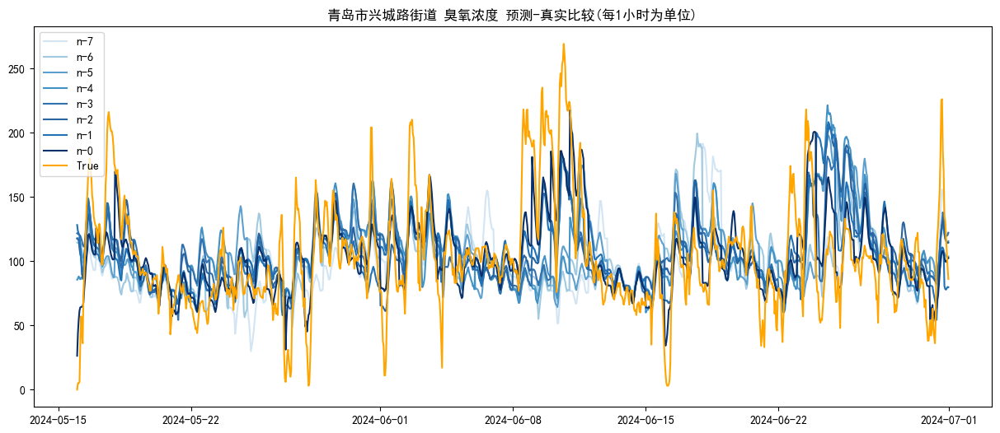

n-7 MASE: 45.76122180428113
n-7 R2: -0.15264824466160798
n-6 MASE: 45.55958370294691
n-6 R2: -0.14251277440792776
n-5 MASE: 46.707738859267714
n-5 R2: -0.20082371800376175
n-4 MASE: 44.69940375251663
n-4 R2: -0.09977800713784823
n-3 MASE: 39.261428723933165
n-3 R2: 0.15153531741586856
n-2 MASE: 37.15116293961023
n-2 R2: 0.24029253057072708
n-1 MASE: 36.35327267108883
n-1 R2: 0.27257437096217374
n-0 MASE: 28.73486824727505
n-0 R2: 0.5455145430878618


In [39]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
import matplotlib.dates as mdates
from datetime import datetime, timedelta
date_range_list = []
start_date111 = datetime(2024, 5, 16, 0, 0, 0) 
end_date111 = datetime(2024, 6, 30, 23, 0, 0)
true_value_list = []
date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
merged_data = pd.merge(pd.DataFrame(date_range111, columns=['日期']), datat, on='日期', how='inner')

true_value_list = merged_data['O3VAL'].tolist()

start_date = datetime(2024, 5, 16, 0, 0, 0) 
end_date = datetime(2024, 5, 16, 23, 0, 0)
while end_date < datetime(2024, 7, 1, 0, 0, 0):
    date_range = pd.date_range(start=start_date, end=end_date, freq='H')
    date_range_list.append(date_range)
    end_date += timedelta(hours=1)
    start_date = end_date
    end_date += timedelta(days=1)
    end_date -= timedelta(hours=1)

num = 0
colors = [
 '#d3e5f3','#a1cae1', 
    '#5d9fcd', '#4292c6',  '#3171ad',
    '#2864a0', '#2171b5',   '#08306b','orange'
]
true_legend_added = 0 
pred_value_list_7 = np.array([])
pred_value_list_6 = np.array([])
pred_value_list_5 = np.array([])
pred_value_list_4 = np.array([])
pred_value_list_3 = np.array([])
pred_value_list_2 = np.array([])
pred_value_list_1 = np.array([])
pred_value_list_0 = np.array([])

for date_ranges in date_range_list:
    num = 7
    for i in range(len(df_list)):
        is_in_list = df_list[i]['日期'].isin(date_ranges)
        rmse_list = []
        r2_list = []
        if is_in_list.any():
            matching_indices = df_list[i].index[is_in_list].tolist()
            matching_values = df_list[i].loc[is_in_list, '日期'].tolist()
            if num == 7:
                pred_value_list_7 = np.concatenate((pred_value_list_7, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 6:
                pred_value_list_6 = np.concatenate((pred_value_list_6, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 5:
                pred_value_list_5 = np.concatenate((pred_value_list_5, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 4:
                pred_value_list_4 = np.concatenate((pred_value_list_4, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 3:
                pred_value_list_3 = np.concatenate((pred_value_list_3, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 2:
                pred_value_list_2 = np.concatenate((pred_value_list_2, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 1:
                pred_value_list_1 = np.concatenate((pred_value_list_1, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 0:
                pred_value_list_0 = np.concatenate((pred_value_list_0, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            num-=1



plt.figure(figsize=(15, 6))
plt.title("青岛市兴城路街道 臭氧浓度 预测-真实比较(每1小时为单位)")
plt.plot(date_range111,pred_value_list_7,color=colors[0], label='n-7')
plt.plot(date_range111,pred_value_list_6,color=colors[1], label='n-6')
plt.plot(date_range111,pred_value_list_5,color=colors[2], label='n-5')
plt.plot(date_range111,pred_value_list_4,color=colors[3], label='n-4')
plt.plot(date_range111,pred_value_list_3,color=colors[4], label='n-3')
plt.plot(date_range111,pred_value_list_2,color=colors[5], label='n-2')
plt.plot(date_range111,pred_value_list_1,color=colors[6], label='n-1')
plt.plot(date_range111,pred_value_list_0,color=colors[7], label='n-0')
plt.plot(date_range111,true_value_list,color=colors[-1], label='True')
plt.legend()
plt.show()   


print('n-7 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_7)))
print('n-7 R2:',r2_score(true_value_list, pred_value_list_7))
print('n-6 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_6)))
print('n-6 R2:',r2_score(true_value_list, pred_value_list_6))
print('n-5 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_5)))
print('n-5 R2:',r2_score(true_value_list, pred_value_list_5))
print('n-4 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_4)))
print('n-4 R2:',r2_score(true_value_list, pred_value_list_4))
print('n-3 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_3)))
print('n-3 R2:',r2_score(true_value_list, pred_value_list_3))
print('n-2 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_2)))
print('n-2 R2:',r2_score(true_value_list, pred_value_list_2))
print('n-1 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_1)))
print('n-1 R2:',r2_score(true_value_list, pred_value_list_1))
print('n-0 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_0)))
print('n-0 R2:',r2_score(true_value_list, pred_value_list_0))

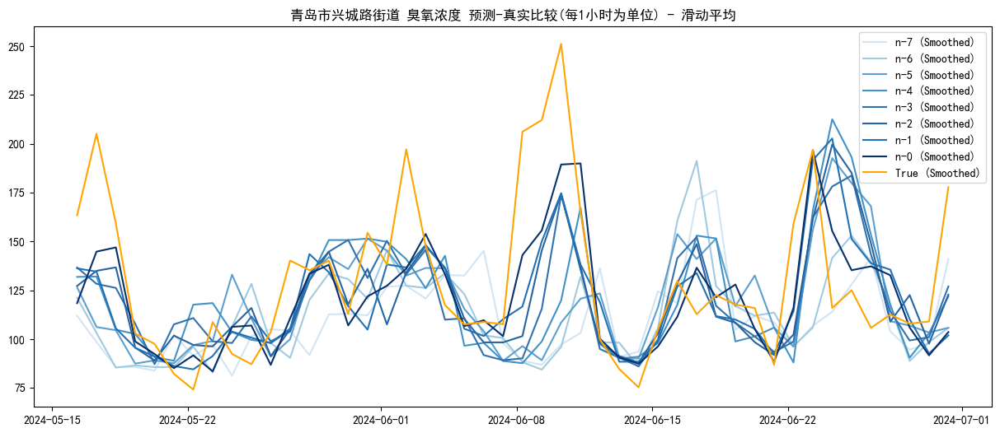

n-7 RMSE: 50.24211687220892
n-7 R2: -0.5670419700139628
n-6 RMSE: 50.0773676028587
n-6 R2: -0.5567818235970907
n-5 RMSE: 47.01594403195847
n-5 R2: -0.37225585007236317
n-4 RMSE: 45.01850309974515
n-4 R2: -0.25813391617080184
n-3 RMSE: 38.163921442554994
n-3 R2: 0.09582862035804851
n-2 RMSE: 36.333801777792075
n-2 R2: 0.1804669837780789
n-1 RMSE: 34.60327407972349
n-1 R2: 0.2566742892989571
n-0 RMSE: 28.575761266191815
n-0 R2: 0.49307887811099227


In [40]:
def sliding_window_average(data, window_size):
    # 保存滑动平均值的列表
    averaged_data = []
    # 用滑动窗口计算平均值
    len1 = len(data)
    for i in range(len1 - window_size + 1):
        avg = np.mean(data[i:i + window_size])
        averaged_data.append(avg)
    return averaged_data


def max_values(data, interval):
    averaged_data = []
    for i in range(0, len(data), 24):
        avg = max(data[i:i+interval])
        averaged_data.append(avg)
    return averaged_data
# 使用滑动窗口大小为8来计算滑动平均值
window_size = 8

# 对每个预测值列表应用滑动窗口函数
smoothed_pred_value_list_7 = sliding_window_average(pred_value_list_7, window_size)
smoothed_pred_value_list_6 = sliding_window_average(pred_value_list_6, window_size)
smoothed_pred_value_list_5 = sliding_window_average(pred_value_list_5, window_size)
smoothed_pred_value_list_4 = sliding_window_average(pred_value_list_4, window_size)
smoothed_pred_value_list_3 = sliding_window_average(pred_value_list_3, window_size)
smoothed_pred_value_list_2 = sliding_window_average(pred_value_list_2, window_size)
smoothed_pred_value_list_1 = sliding_window_average(pred_value_list_1, window_size)
smoothed_pred_value_list_0 = sliding_window_average(pred_value_list_0, window_size)

# 对真实值列表应用滑动窗口函数
smoothed_true_value_list = sliding_window_average(true_value_list, window_size)

# 再次应用 max_values 函数
interval = 24
smoothed_pred_value_list_7 = max_values(smoothed_pred_value_list_7, interval)
smoothed_pred_value_list_6 = max_values(smoothed_pred_value_list_6, interval)
smoothed_pred_value_list_5 = max_values(smoothed_pred_value_list_5, interval)
smoothed_pred_value_list_4 = max_values(smoothed_pred_value_list_4, interval)
smoothed_pred_value_list_3 = max_values(smoothed_pred_value_list_3, interval)
smoothed_pred_value_list_2 = max_values(smoothed_pred_value_list_2, interval)
smoothed_pred_value_list_1 = max_values(smoothed_pred_value_list_1, interval)
smoothed_pred_value_list_0 = max_values(smoothed_pred_value_list_0, interval)

# 由于 max_values 可能会减少列表长度，我们也需要对 smoothed_true_value_list 应用相同的操作
smoothed_true_value_list = max_values(smoothed_true_value_list, interval)

# 获取用于绘图的时间范围，减去窗口大小 + 1，以匹配滑动平均后的长度
# 并且需要进一步减去由 max_values 函数导致的长度减少
smoothed_date_range111 = date_range111[window_size - 1::interval]

plt.figure(figsize=(15, 6))
plt.title("青岛市兴城路街道 臭氧浓度 预测-真实比较(每1小时为单位) - 滑动平均")
plt.plot(smoothed_date_range111, smoothed_pred_value_list_7, color=colors[0], label='n-7 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_6, color=colors[1], label='n-6 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_5, color=colors[2], label='n-5 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_4, color=colors[3], label='n-4 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_3, color=colors[4], label='n-3 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_2, color=colors[5], label='n-2 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_1, color=colors[6], label='n-1 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_0, color=colors[7], label='n-0 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_true_value_list, color=colors[-1], label='True (Smoothed)')
plt.legend()
plt.show()

# 计算滑动平均后的性能指标
print('n-7 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_7)))
print('n-7 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_7))
print('n-6 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_6)))
print('n-6 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_6))
print('n-5 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_5)))
print('n-5 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_5))
print('n-4 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_4)))
print('n-4 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_4))
print('n-3 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_3)))
print('n-3 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_3))
print('n-2 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_2)))
print('n-2 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_2))
print('n-1 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_1)))
print('n-1 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_1))
print('n-0 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_0)))
print('n-0 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_0))

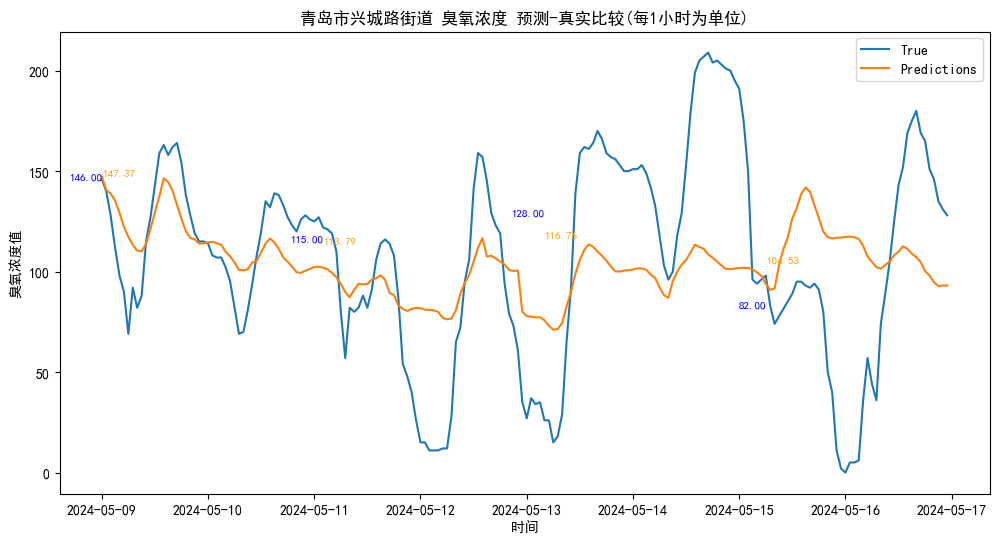

rmse: 46.8420057527475
r2 score: 0.14736911638763217
all
rmse: 46.8420057527475
r2 score: 0.14736911638763217
all-1
rmse: 41.78726187679661
r2 score: 0.2888614111814134
all-2
rmse: 33.6989519570547
r2 score: 0.43547951279786734


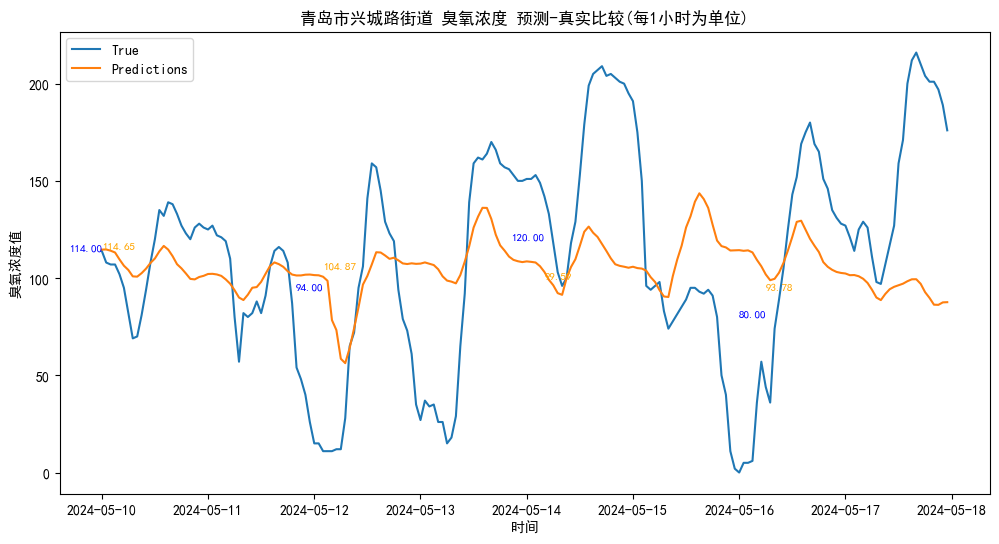

rmse: 52.91185983387267
r2 score: 0.0451755084973956
all
rmse: 52.91185983387267
r2 score: 0.0451755084973956
all-1
rmse: 47.18818845383199
r2 score: 0.14883437170479608
all-2
rmse: 46.19276628793913
r2 score: 0.22243176151093025


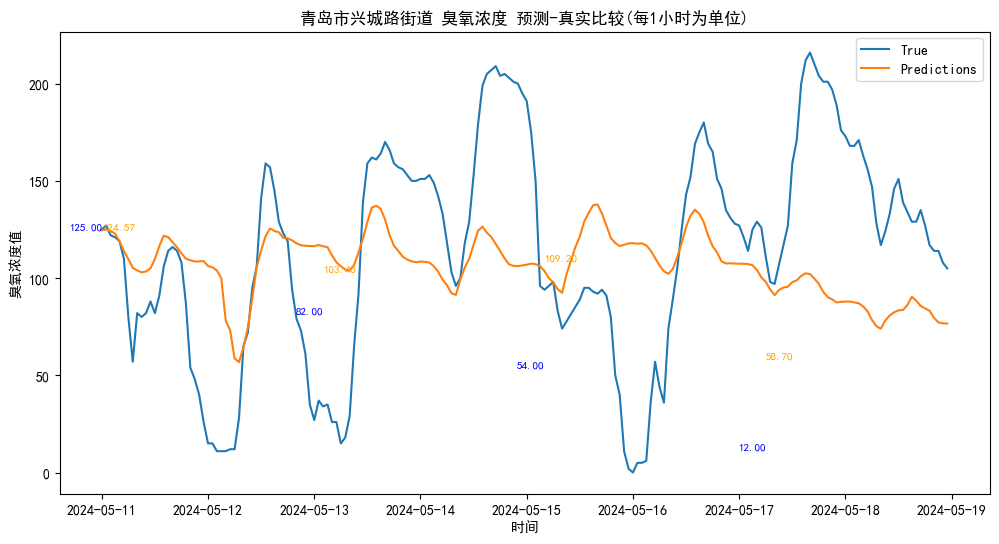

rmse: 56.80826011760945
r2 score: -0.07254789220042412
all
rmse: 56.80826011760945
r2 score: -0.07254789220042412
all-1
rmse: 53.686868639893284
r2 score: 0.08744015350826406
all-2
rmse: 52.40178281534988
r2 score: 0.09770711954168887


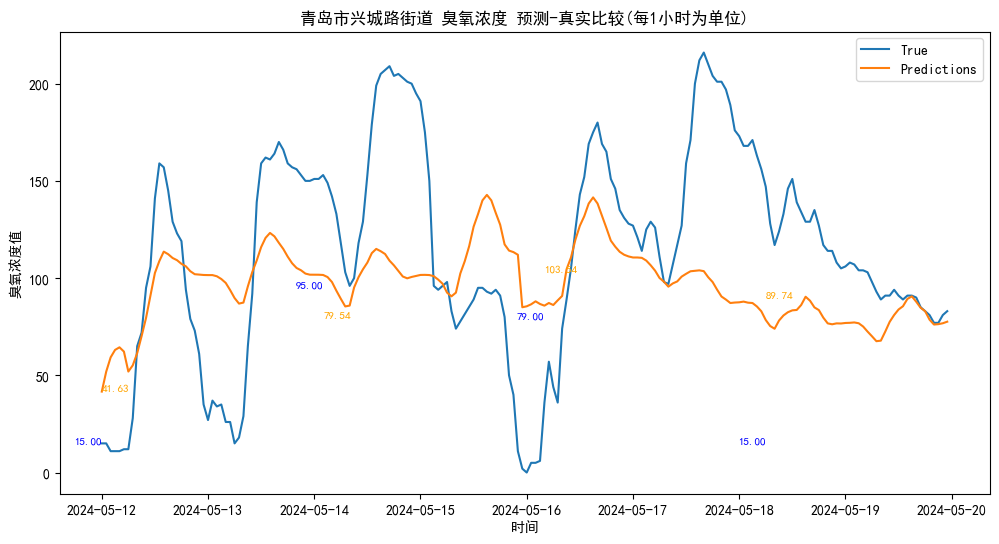

rmse: 52.5679219939263
r2 score: 0.05107566648151929
all
rmse: 52.5679219939263
r2 score: 0.05107566648151929
all-1
rmse: 55.43030471617911
r2 score: 0.15294392930467005
all-2
rmse: 51.75574954971721
r2 score: 0.25424682467608517


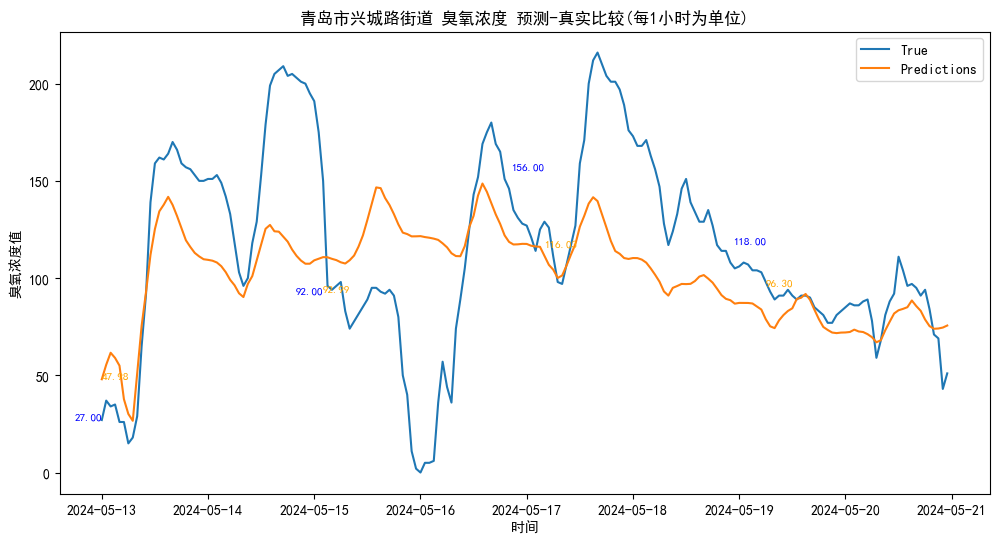

rmse: 44.692903516345254
r2 score: 0.20964557792039318
all
rmse: 44.692903516345254
r2 score: 0.20964557792039318
all-1
rmse: 51.001839865989766
r2 score: 0.12224736437453676
all-2
rmse: 52.661165710355434
r2 score: 0.19238092783348404


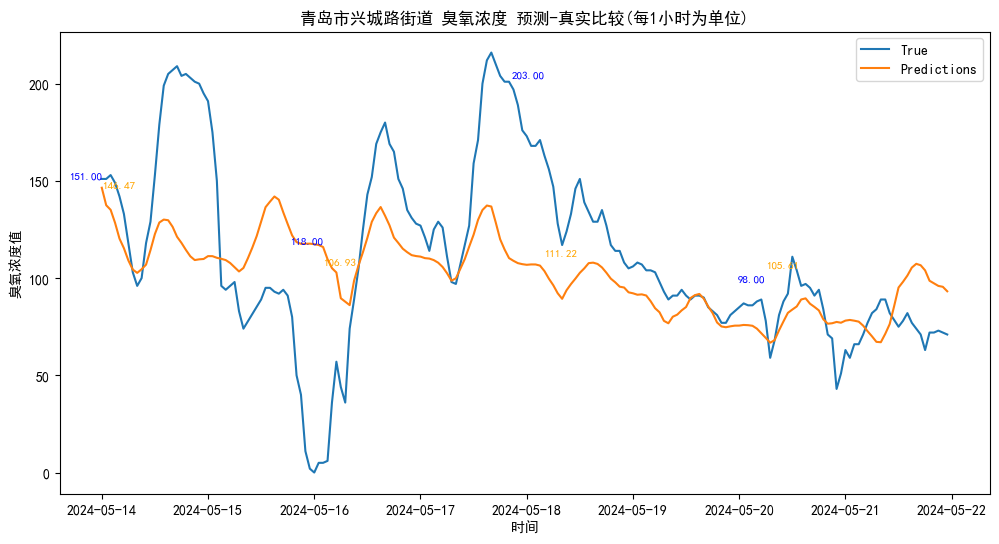

rmse: 42.53797559780592
r2 score: 0.1876961093712517
all
rmse: 42.53797559780592
r2 score: 0.1876961093712517
all-1
rmse: 47.98049852107004
r2 score: 0.050649619196198814
all-2
rmse: 52.35702836318494
r2 score: -0.029492479590477405


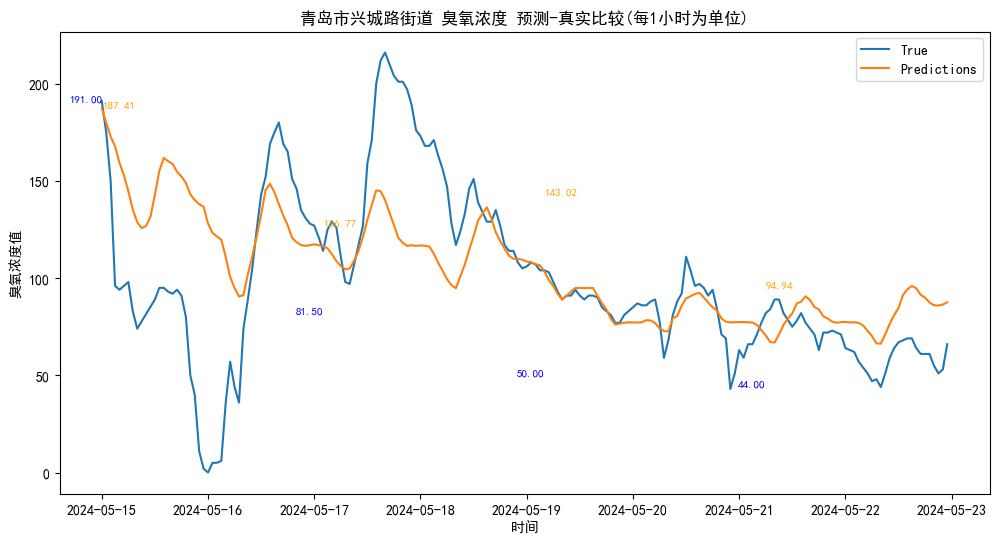

rmse: 39.13012898323964
r2 score: 0.19908358327126507
all
rmse: 39.13012898323964
r2 score: 0.19908358327126507
all-1
rmse: 43.83950211601158
r2 score: 0.06049409550636964
all-2
rmse: 47.7053119680308
r2 score: -0.018045498033391283


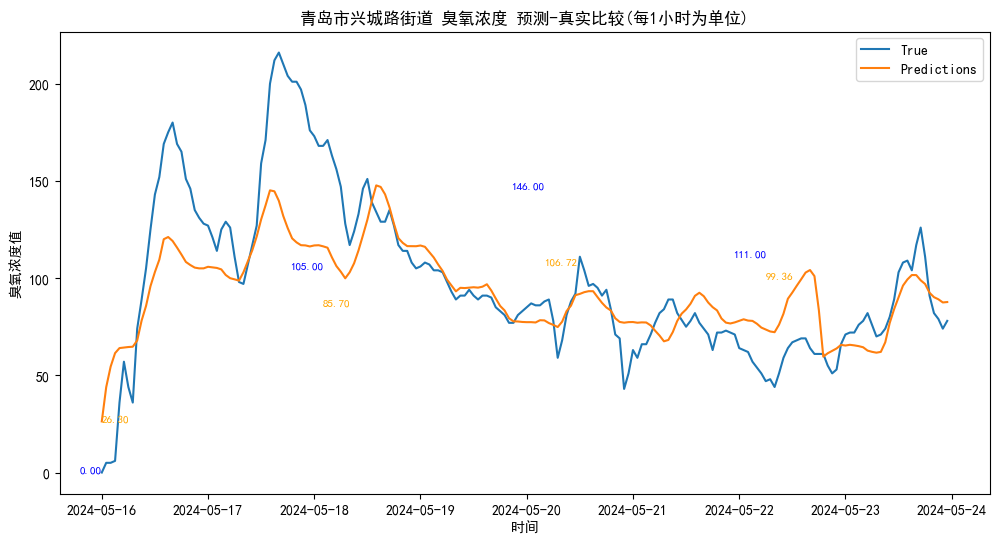

rmse: 27.043095382966047
r2 score: 0.5803565704043425
all
rmse: 27.043095382966047
r2 score: 0.5803565704043425
all-1
rmse: 29.2910296753697
r2 score: 0.5501259818156754
all-2
rmse: 31.597653488935
r2 score: 0.505321673206246


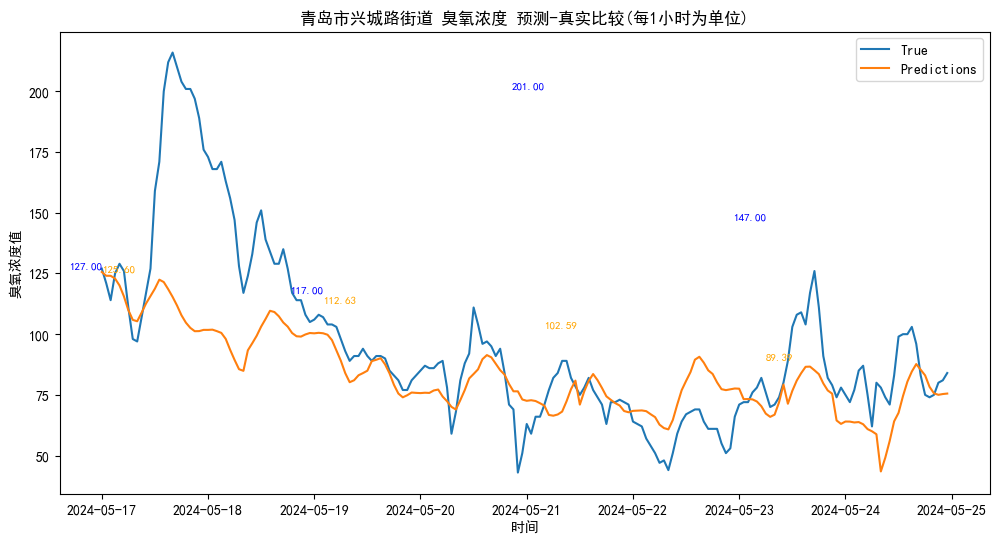

rmse: 29.117663601406438
r2 score: 0.3569208322701529
all
rmse: 29.117663601406438
r2 score: 0.3569208322701529
all-1
rmse: 32.15182756000818
r2 score: 0.3661476381201946
all-2
rmse: 34.36969748903372
r2 score: 0.22976034658556987


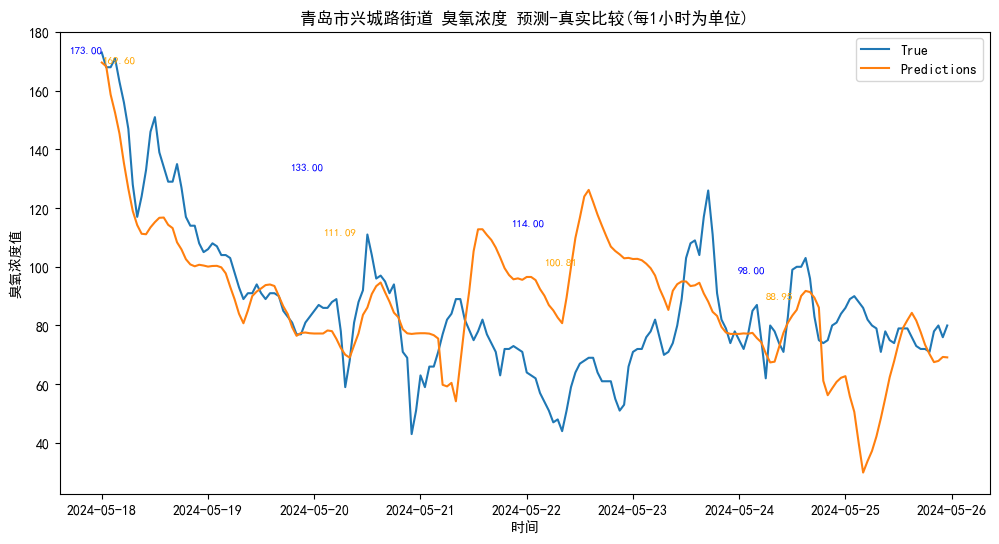

rmse: 23.242606246495882
r2 score: 0.1180104366399427
all
rmse: 23.242606246495882
r2 score: 0.1180104366399427
all-1
rmse: 24.205465997430625
r2 score: 0.24428092893841258
all-2
rmse: 25.051294613999463
r2 score: 0.28229586425026065


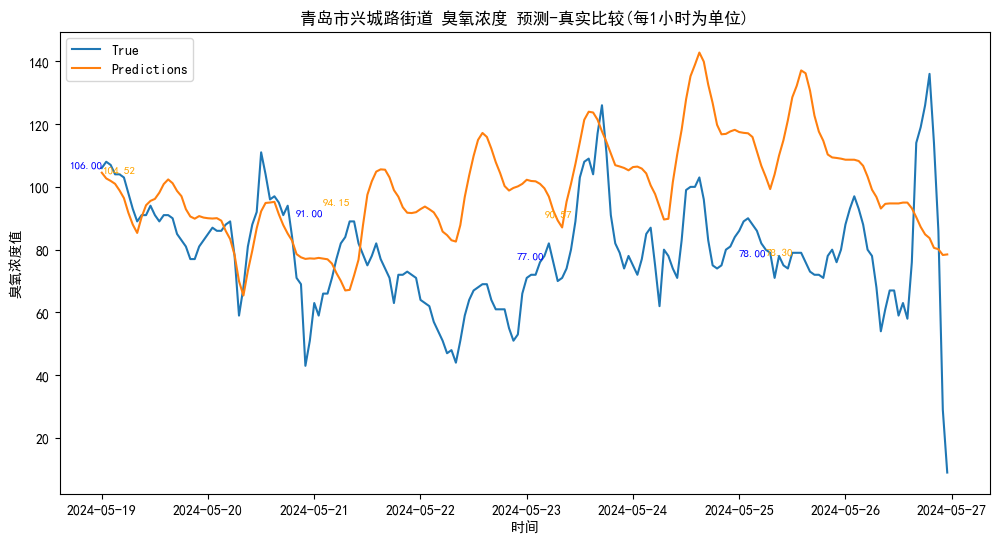

rmse: 28.56186967692128
r2 score: -1.7219956670908103
all
rmse: 28.56186967692128
r2 score: -1.7219956670908103
all-1
rmse: 25.46941526067467
r2 score: -1.557949643270673
all-2
rmse: 23.205444929270808
r2 score: -0.9156255116255891


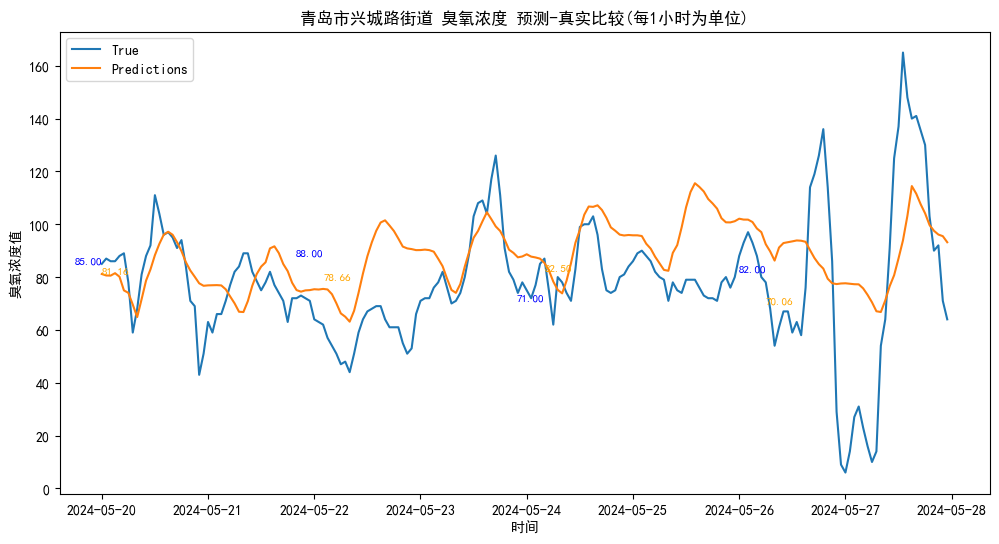

rmse: 23.974491882529943
r2 score: 0.04104741946538759
all
rmse: 23.974491882529943
r2 score: 0.04104741946538759
all-1
rmse: 17.622880045753018
r2 score: -0.4502608458131283
all-2
rmse: 16.09323133292754
r2 score: -0.03464640260981522


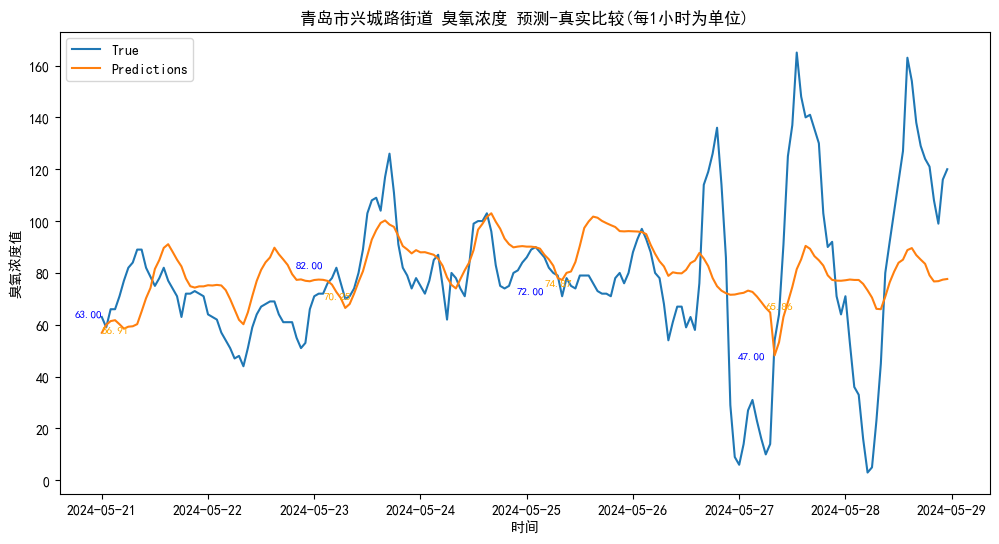

rmse: 27.046050332936456
r2 score: 0.1450653804531895
all
rmse: 27.046050332936456
r2 score: 0.1450653804531895
all-1
rmse: 17.31662785926115
r2 score: 0.031102609651522672
all-2
rmse: 14.118637793010313
r2 score: 0.003174877488579475


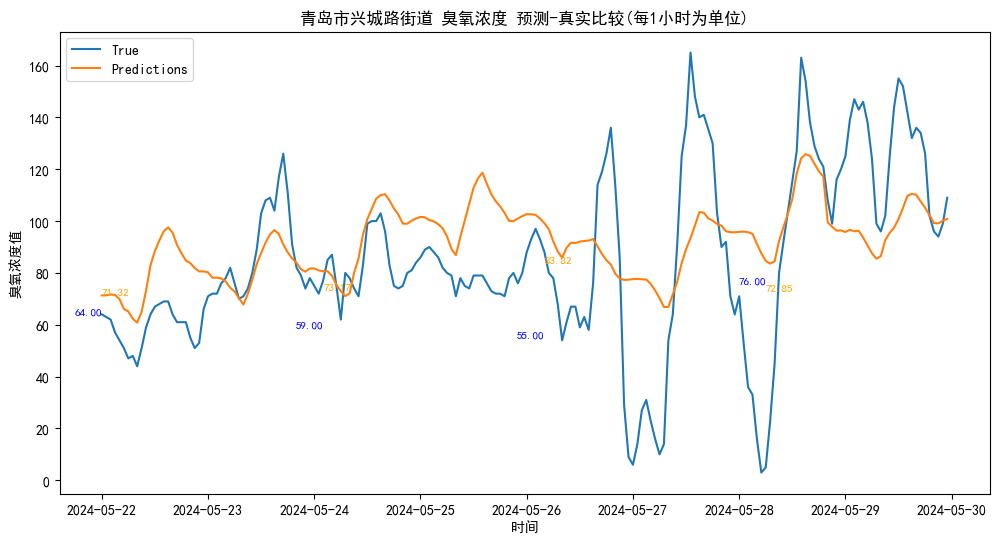

rmse: 29.444332217735056
r2 score: 0.23270070637260298
all
rmse: 29.444332217735056
r2 score: 0.23270070637260298
all-1
rmse: 26.697047861202503
r2 score: 0.03902489872588166
all-2
rmse: 21.920917778627068
r2 score: -0.3421097260332253


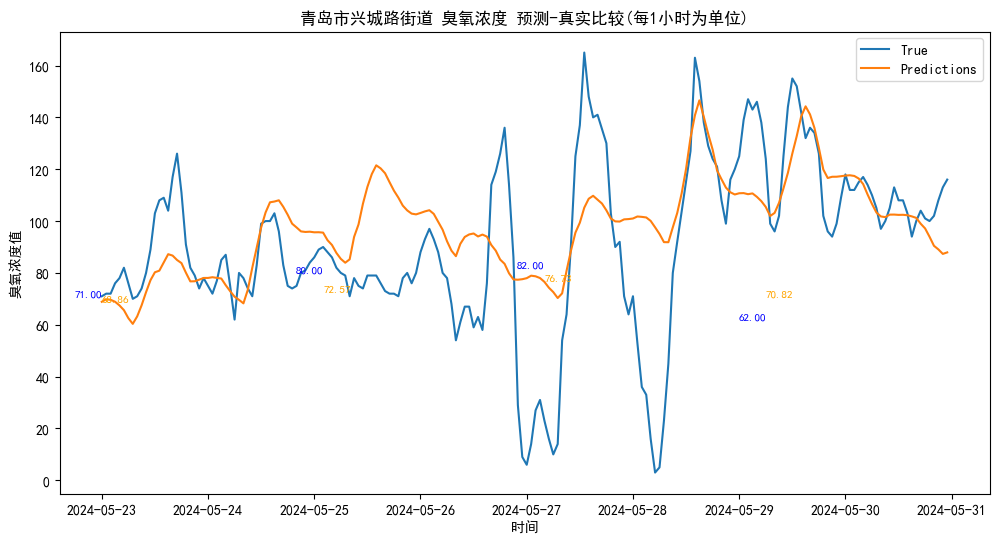

rmse: 28.02685583669051
r2 score: 0.2669256476310323
all
rmse: 28.02685583669051
r2 score: 0.2669256476310323
all-1
rmse: 31.0113617744
r2 score: 0.07529367198104664
all-2
rmse: 27.93886773519156
r2 score: 0.01633178647461908


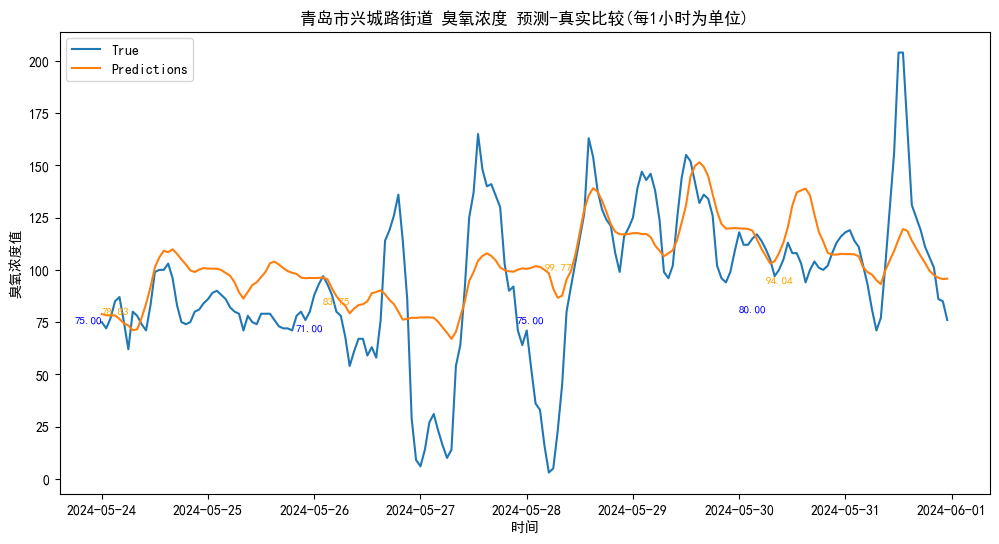

rmse: 28.596193828297366
r2 score: 0.3500418697628743
all
rmse: 28.596193828297366
r2 score: 0.3500418697628743
all-1
rmse: 29.632011883390284
r2 score: 0.33624194256090645
all-2
rmse: 31.31497091905848
r2 score: 0.17370133922937858


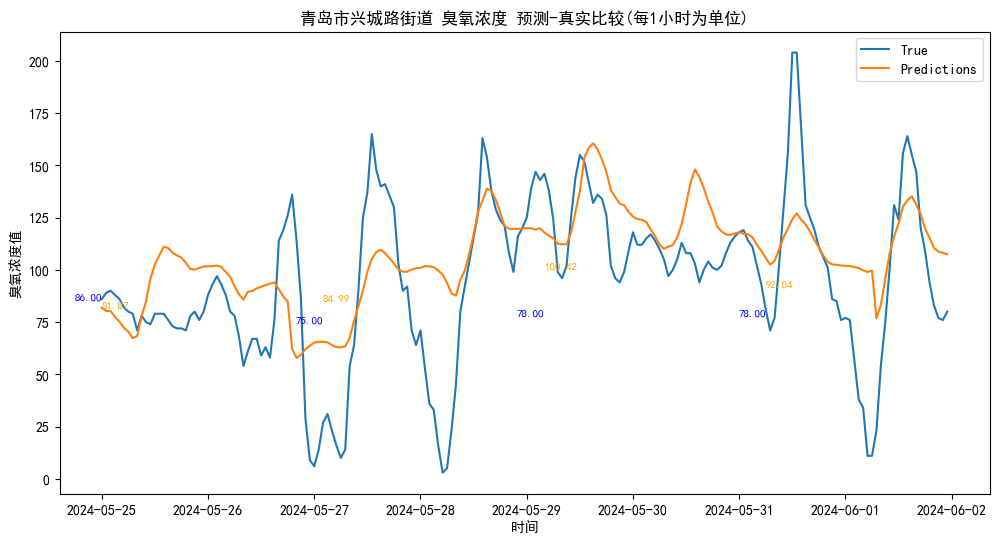

rmse: 31.75307852476832
r2 score: 0.31910335784328403
all
rmse: 31.75307852476832
r2 score: 0.31910335784328403
all-1
rmse: 30.696415979613544
r2 score: 0.2997087091247923
all-2
rmse: 32.22366371227749
r2 score: 0.33241500442258876


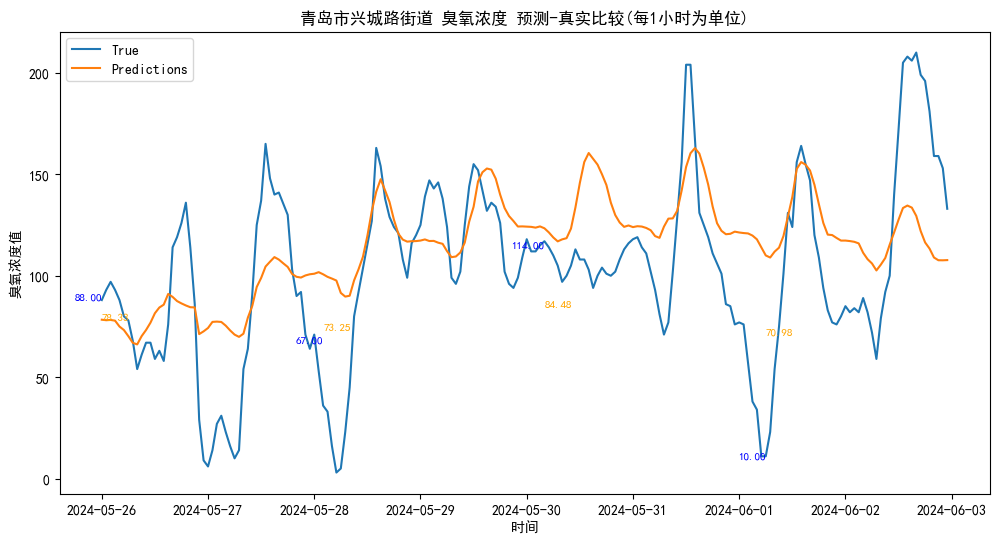

rmse: 38.01755279924669
r2 score: 0.25190851146435034
all
rmse: 38.01755279924669
r2 score: 0.25190851146435034
all-1
rmse: 32.74597179747531
r2 score: 0.3158725357132083
all-2
rmse: 33.227988654550195
r2 score: 0.2931599300749794


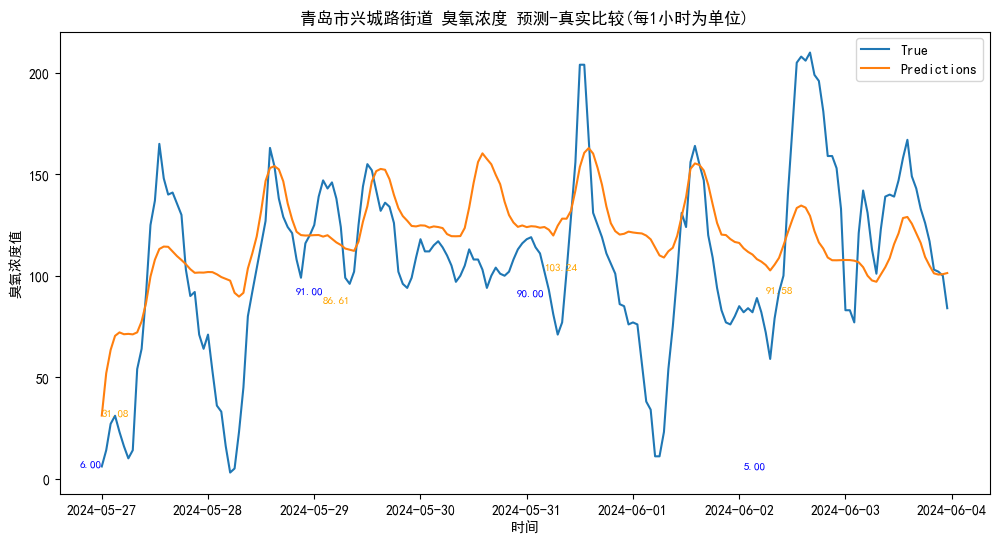

rmse: 37.07502732836549
r2 score: 0.2639138831771951
all
rmse: 37.07502732836549
r2 score: 0.2639138831771951
all-1
rmse: 36.577723332786235
r2 score: 0.22337115957454057
all-2
rmse: 32.764065590518726
r2 score: 0.3399321572355063


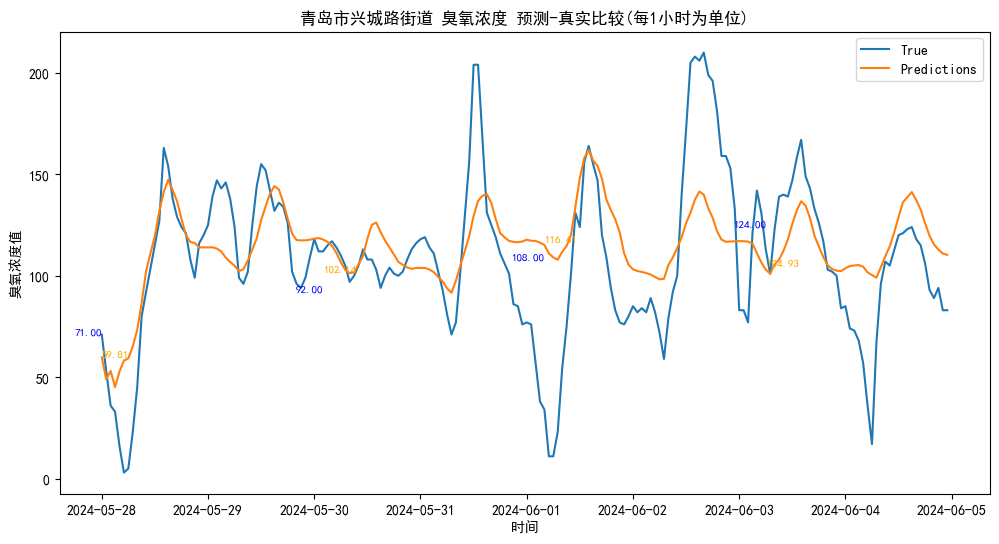

rmse: 30.919433637646957
r2 score: 0.38780182818045494
all
rmse: 30.919433637646957
r2 score: 0.38780182818045494
all-1
rmse: 32.12260575314904
r2 score: 0.4167552362411686
all-2
rmse: 29.417971504750376
r2 score: 0.39368862178931685


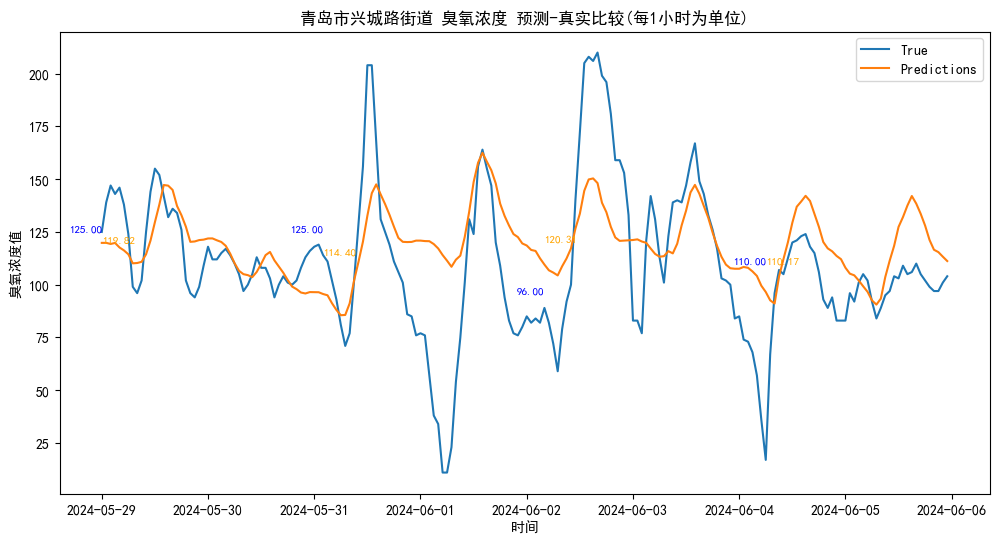

rmse: 30.290526057715322
r2 score: 0.2566315588198824
all
rmse: 30.290526057715322
r2 score: 0.2566315588198824
all-1
rmse: 31.589299883119438
r2 score: 0.28802115808070083
all-2
rmse: 33.54871797286781
r2 score: 0.27256247864667316


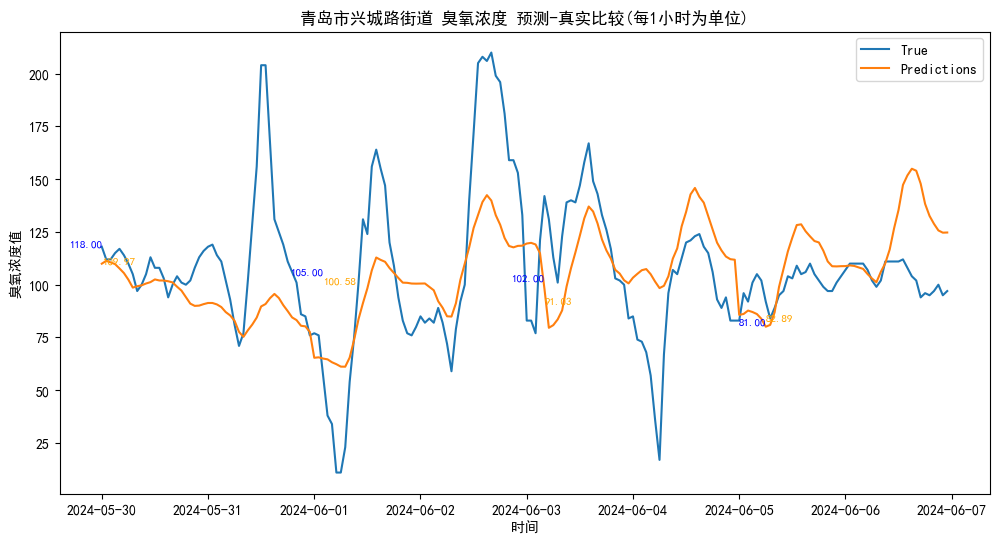

rmse: 30.40457748529736
r2 score: 0.2020815289299056
all
rmse: 30.40457748529736
r2 score: 0.2020815289299056
all-1
rmse: 32.716750737379414
r2 score: 0.2925488891001172
all-2
rmse: 32.812888279535464
r2 score: 0.31815510436637806


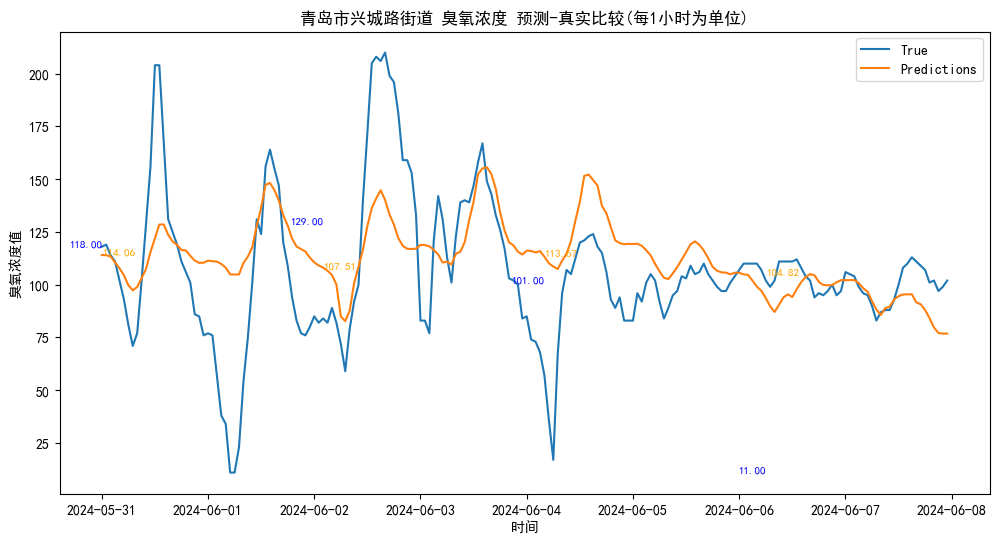

rmse: 29.971861609965273
r2 score: 0.23093285102123262
all
rmse: 29.971861609965273
r2 score: 0.23093285102123262
all-1
rmse: 33.94161843951666
r2 score: 0.24653926998919973
all-2
rmse: 36.61297118393744
r2 score: 0.2576496512330654


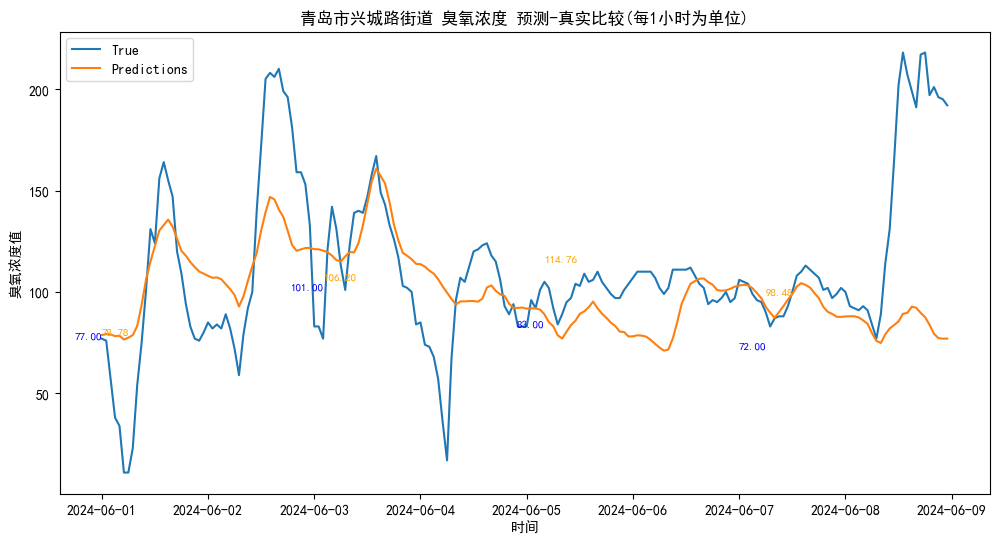

rmse: 38.98563466373032
r2 score: 0.05093171744750058
all
rmse: 38.98563466373032
r2 score: 0.05093171744750058
all-1
rmse: 28.00265104451142
r2 score: 0.4040991296452958
all-2
rmse: 29.1098543947355
r2 score: 0.4605000166069838


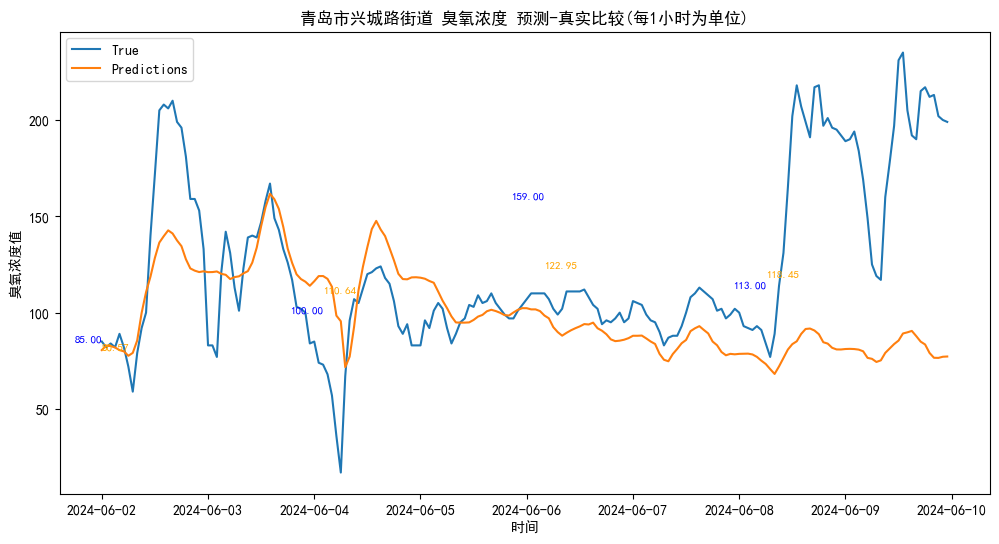

rmse: 53.674689404769595
r2 score: -0.4668034993755814
all
rmse: 53.674689404769595
r2 score: -0.4668034993755814
all-1
rmse: 24.554322317647205
r2 score: 0.35480713053936197
all-2
rmse: 25.87202217951257
r2 score: 0.386155101815043


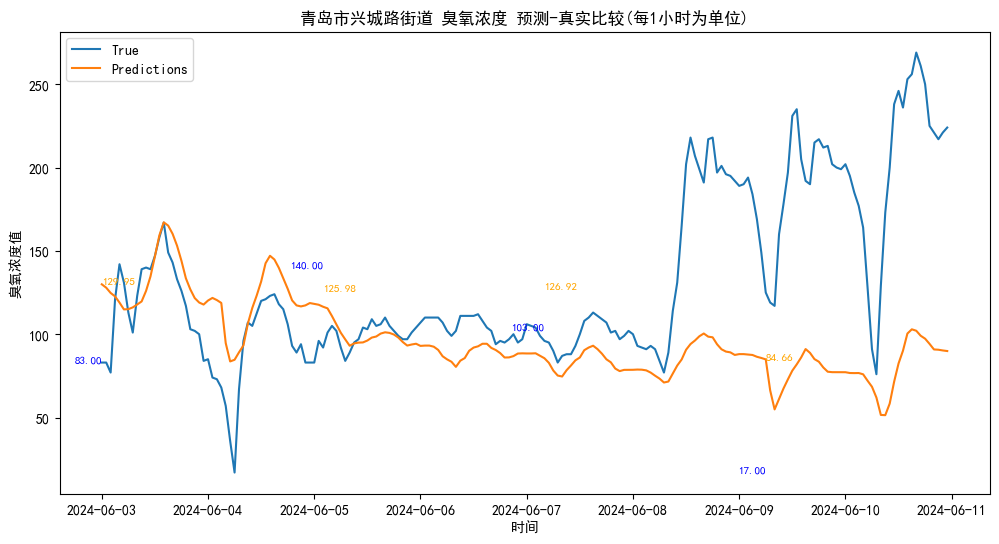

rmse: 68.1571964599569
r2 score: -0.7632596648145256
all
rmse: 68.1571964599569
r2 score: -0.7632596648145256
all-1
rmse: 38.02919281718647
r2 score: -0.24784948560899767
all-2
rmse: 21.044424087231263
r2 score: -0.07422113321204127


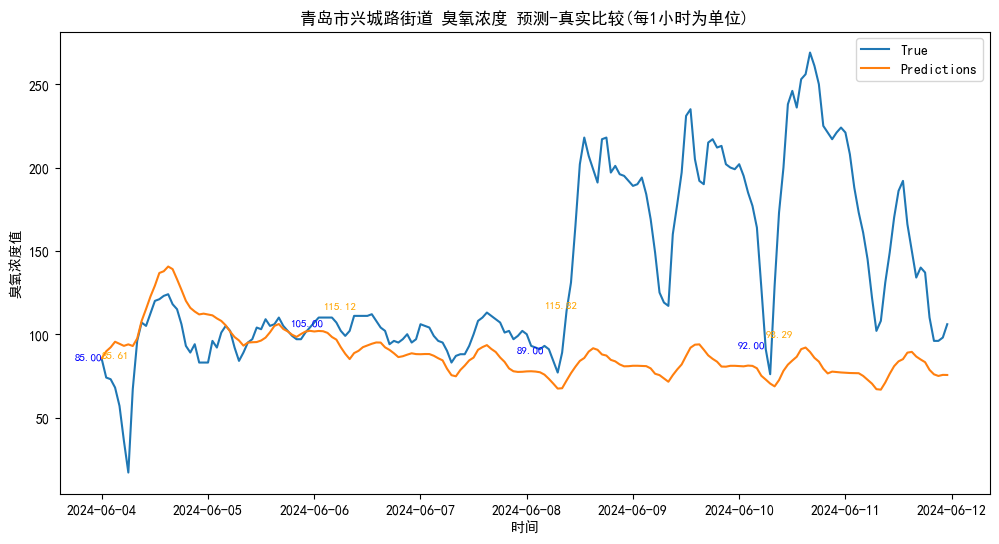

rmse: 73.44858935719165
r2 score: -0.9820608065892371
all
rmse: 73.44858935719165
r2 score: -0.9820608065892371
all-1
rmse: 58.38692240302583
r2 score: -0.6719422744610326
all-2
rmse: 41.8566351868035
r2 score: -0.4131594199777371


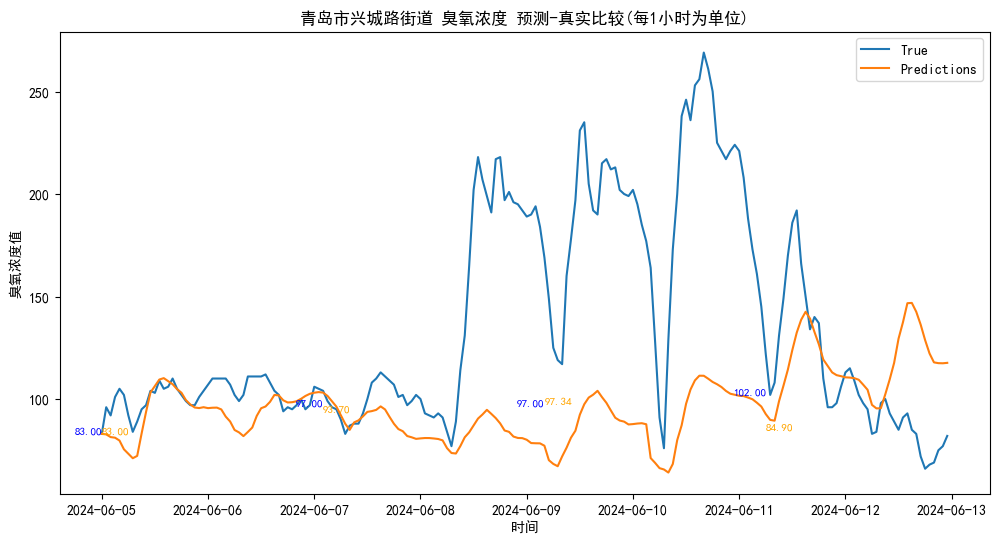

rmse: 67.00191758690032
r2 score: -0.6807598900945222
all
rmse: 67.00191758690032
r2 score: -0.6807598900945222
all-1
rmse: 72.94247345052977
r2 score: -0.8325540817191124
all-2
rmse: 60.674139782647295
r2 score: -0.790826532476657


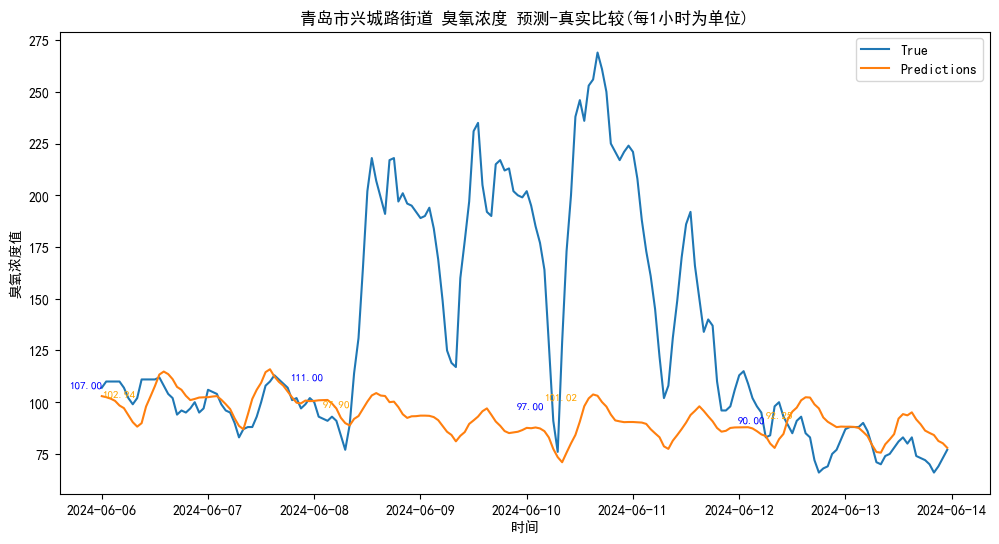

rmse: 66.86078553474066
r2 score: -0.5385915353615962
all
rmse: 66.86078553474066
r2 score: -0.5385915353615962
all-1
rmse: 76.77862727173759
r2 score: -1.1270548443123256
all-2
rmse: 78.65444526135758
r2 score: -1.0211866866943708


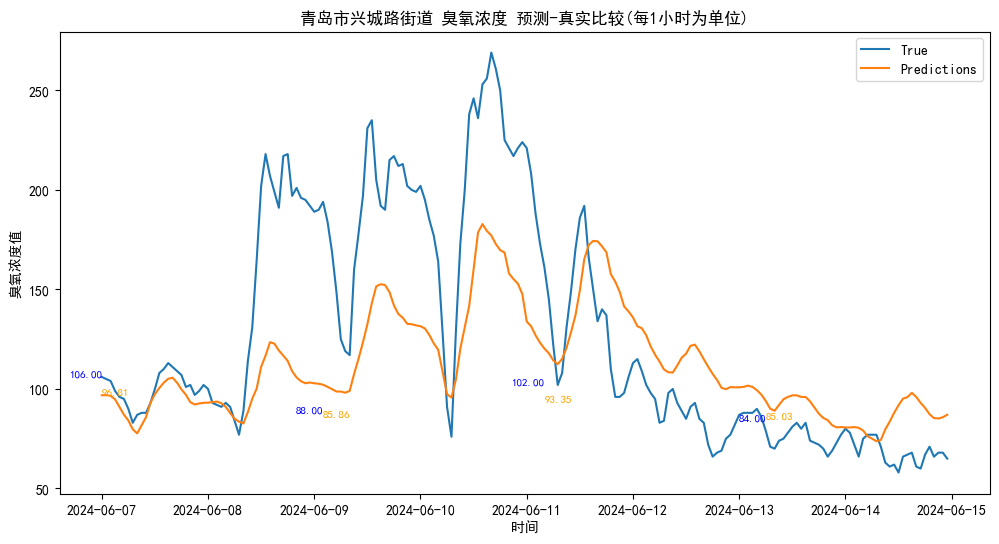

rmse: 45.25753695891613
r2 score: 0.37810301290084436
all
rmse: 45.25753695891613
r2 score: 0.37810301290084436
all-1
rmse: 51.207205354449485
r2 score: 0.1429681392265959
all-2
rmse: 54.745145399190534
r2 score: -0.05102321557478562


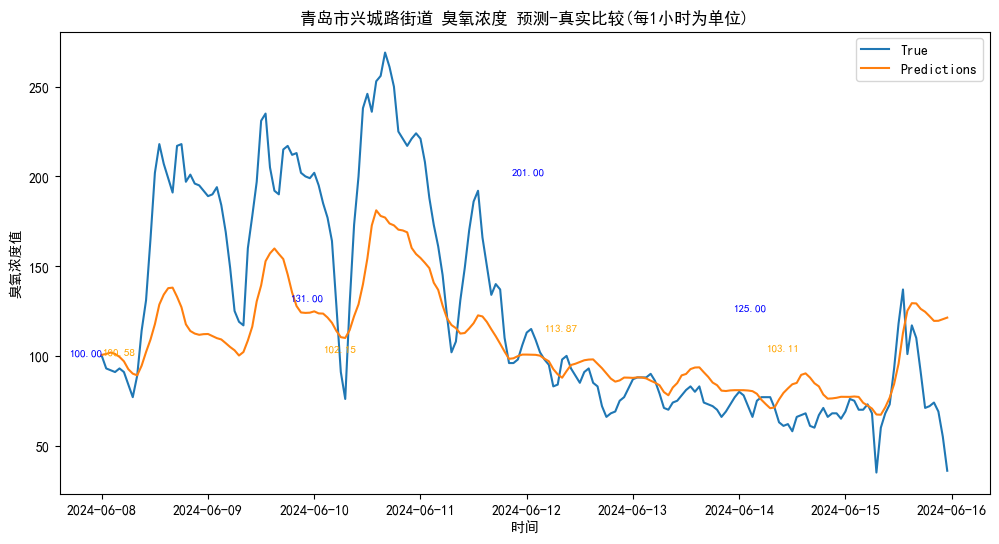

rmse: 42.807341612192104
r2 score: 0.4845097352723059
all
rmse: 42.807341612192104
r2 score: 0.4845097352723059
all-1
rmse: 47.15093383256144
r2 score: 0.3559824087746536
all-2
rmse: 51.47020018031784
r2 score: 0.15917321509861782


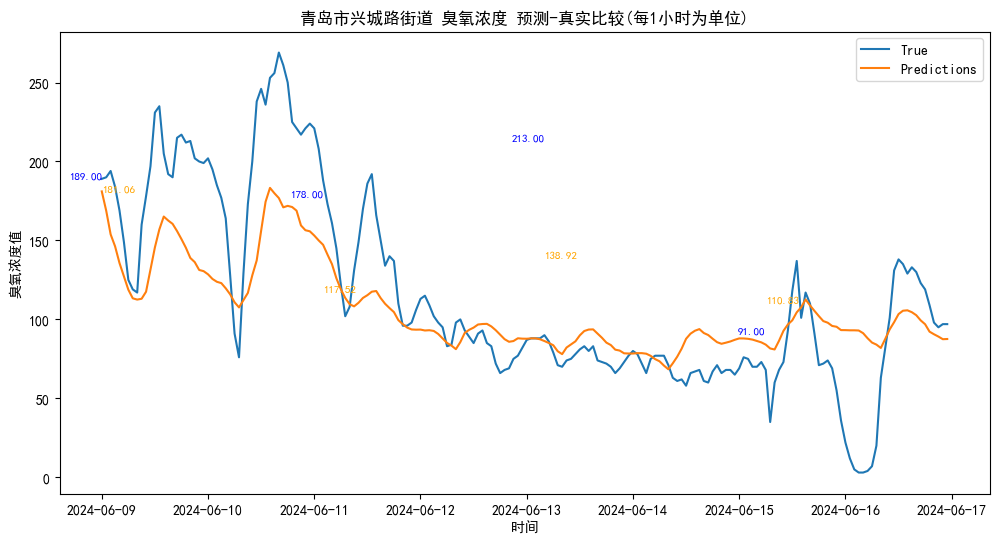

rmse: 38.75656232889852
r2 score: 0.5856362187913511
all
rmse: 38.75656232889852
r2 score: 0.5856362187913511
all-1
rmse: 38.548122912196575
r2 score: 0.595135387588601
all-2
rmse: 41.457514862606075
r2 score: 0.5149084997472758


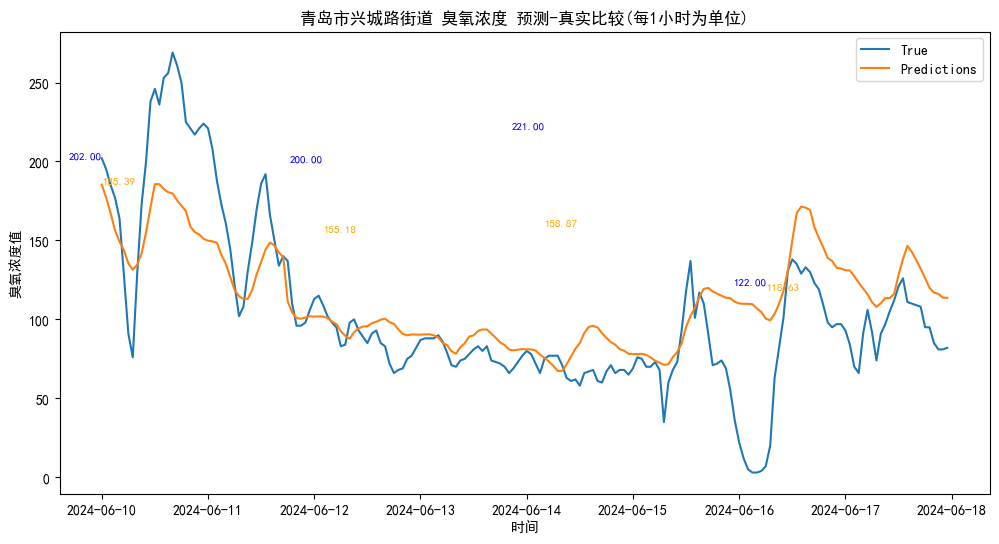

rmse: 35.90759484866499
r2 score: 0.5421534970220889
all
rmse: 35.90759484866499
r2 score: 0.5421534970220889
all-1
rmse: 30.086547913156355
r2 score: 0.7090129653256401
all-2
rmse: 30.127356006686984
r2 score: 0.7312934295229728


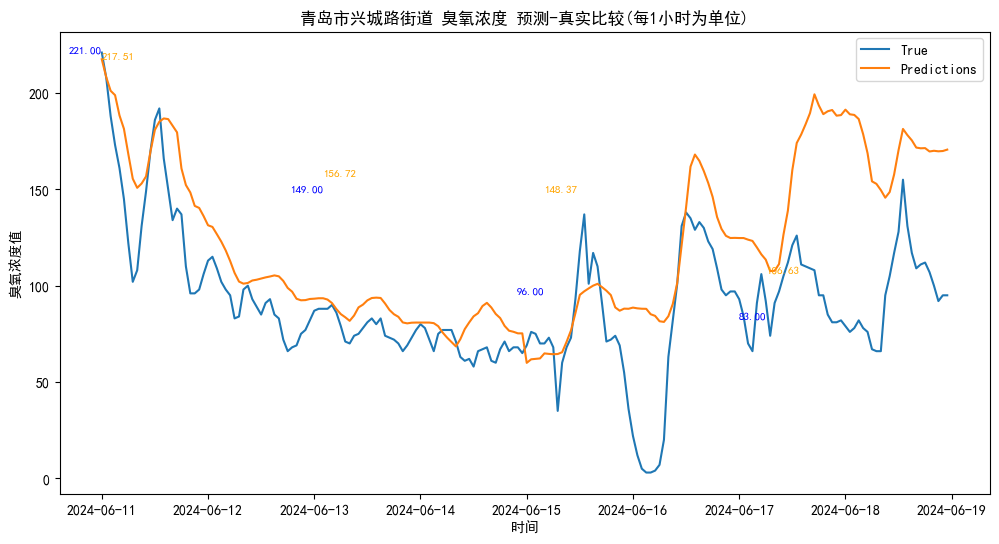

rmse: 43.141670726403206
r2 score: -0.5596821313125415
all
rmse: 43.141670726403206
r2 score: -0.5596821313125415
all-1
rmse: 27.644969538939485
r2 score: 0.47490091538752566
all-2
rmse: 20.933109532915307
r2 score: 0.6313257299725307


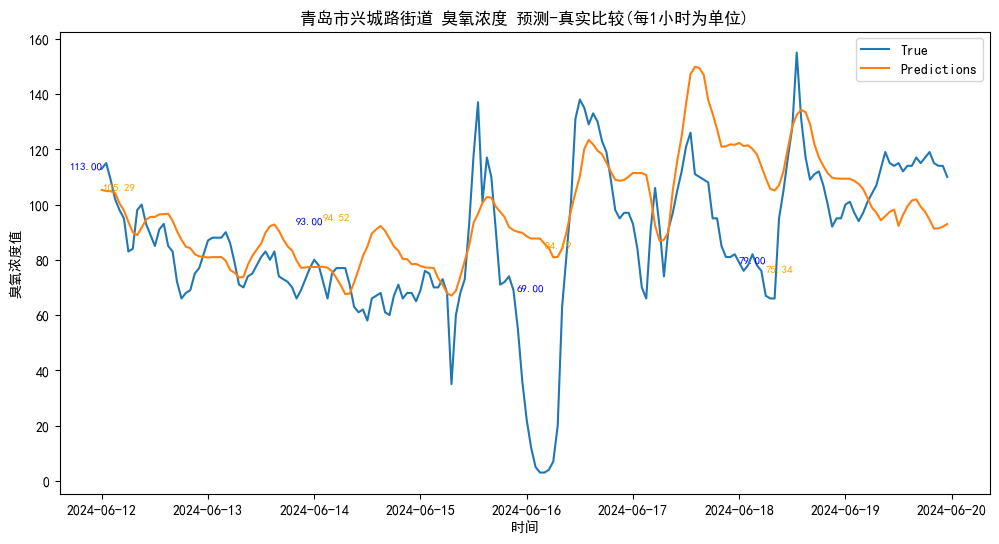

rmse: 24.465097110524972
r2 score: 0.13573503455325842
all
rmse: 24.465097110524972
r2 score: 0.13573503455325842
all-1
rmse: 25.095471165942428
r2 score: 0.0863516996073671
all-2
rmse: 24.21207773238922
r2 score: 0.19811797550750654


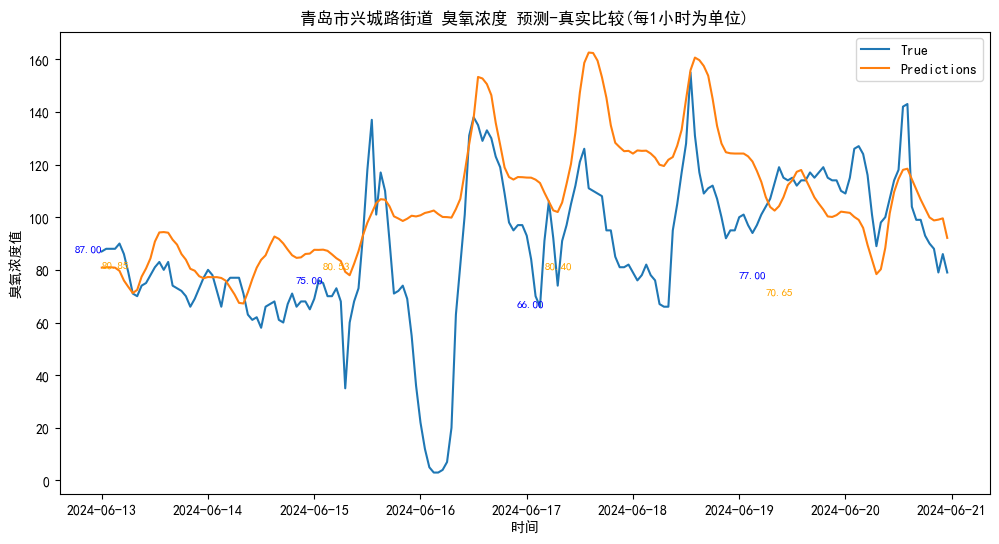

rmse: 30.342420526445803
r2 score: -0.22747770017713242
all
rmse: 30.342420526445803
r2 score: -0.22747770017713242
all-1
rmse: 33.89072859651516
r2 score: -0.48082024626183917
all-2
rmse: 32.86772144927755
r2 score: -0.38973483247426643


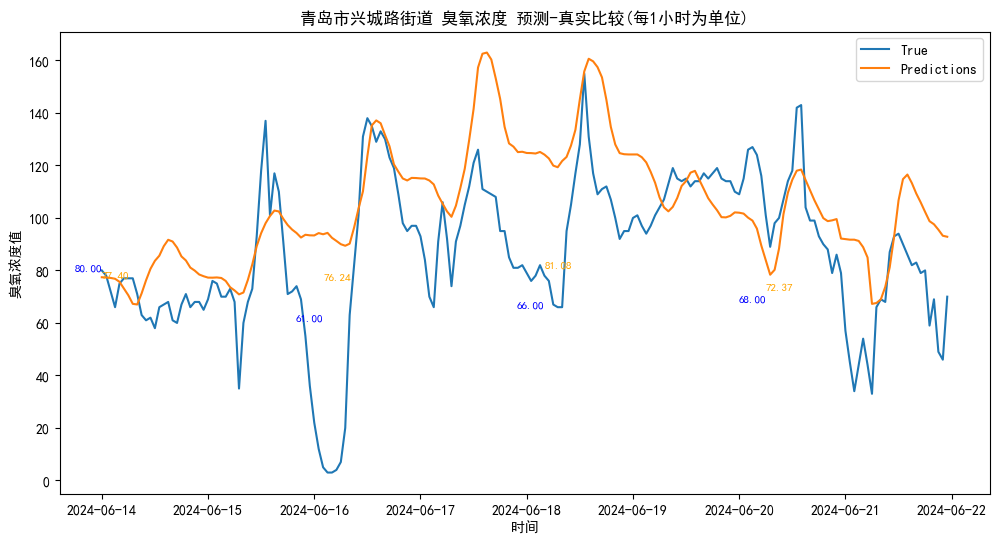

rmse: 30.5125576260048
r2 score: -0.11266674602051552
all
rmse: 30.5125576260048
r2 score: -0.11266674602051552
all-1
rmse: 31.959328027265606
r2 score: -0.17268918174410786
all-2
rmse: 34.444658131314554
r2 score: -0.2947442347465965


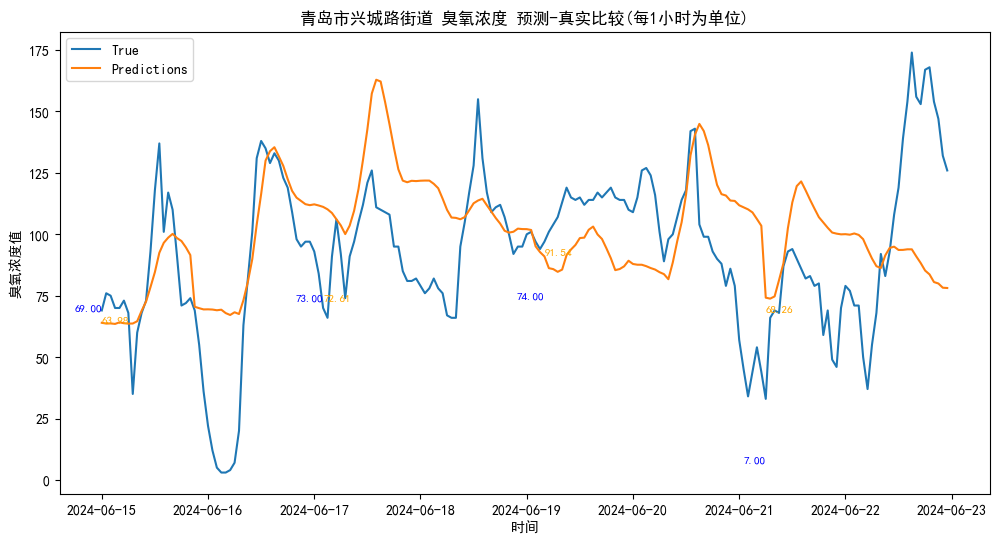

rmse: 33.28549897216468
r2 score: -0.05686010047138823
all
rmse: 33.28549897216468
r2 score: -0.05686010047138823
all-1
rmse: 27.728579765160696
r2 score: 0.11655155657651928
all-2
rmse: 27.68217185676324
r2 score: 0.19195931007510103


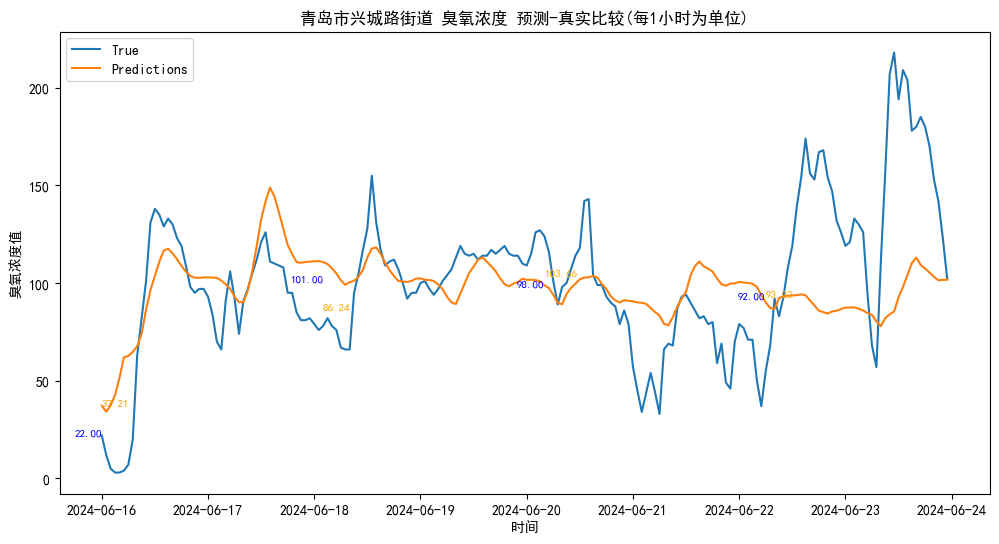

rmse: 35.70782749175969
r2 score: 0.15293026105432383
all
rmse: 35.70782749175969
r2 score: 0.15293026105432383
all-1
rmse: 23.3574906921781
r2 score: 0.4073034199260761
all-2
rmse: 20.75407928486527
r2 score: 0.5057768558326163


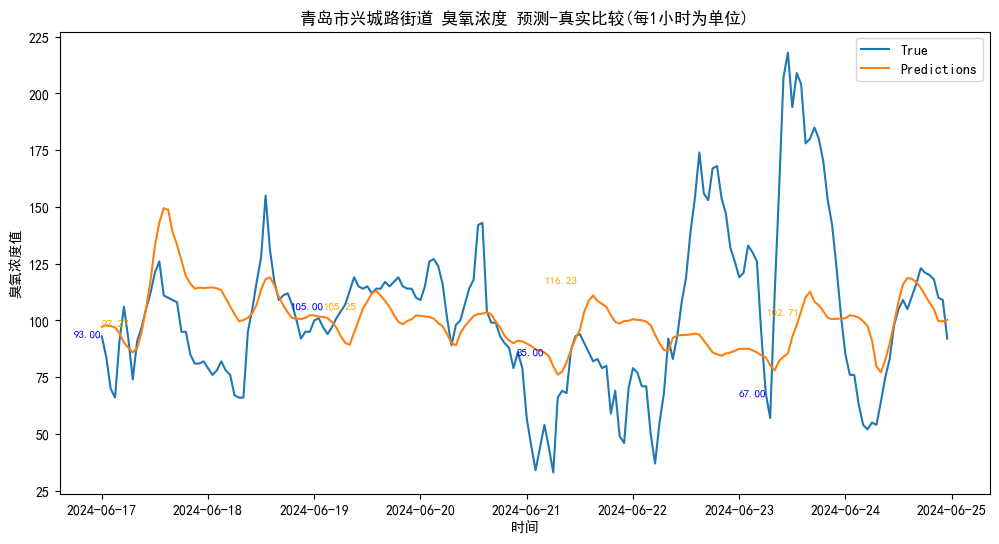

rmse: 35.28754294382892
r2 score: -0.04669116578512189
all
rmse: 35.28754294382892
r2 score: -0.04669116578512189
all-1
rmse: 28.677485414868286
r2 score: -0.06950391290575553
all-2
rmse: 22.645460238137787
r2 score: 0.032536483221415335


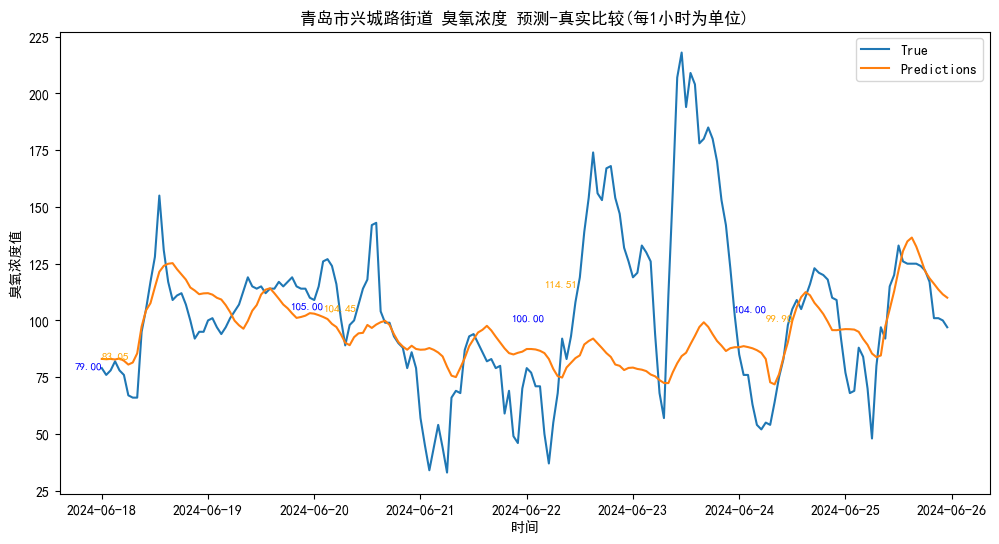

rmse: 35.07204725062616
r2 score: -0.00953036604466928
all
rmse: 35.07204725062616
r2 score: -0.00953036604466928
all-1
rmse: 39.520368259004506
r2 score: -0.11376870192803423
all-2
rmse: 27.3582859419874
r2 score: 0.14320474236501113


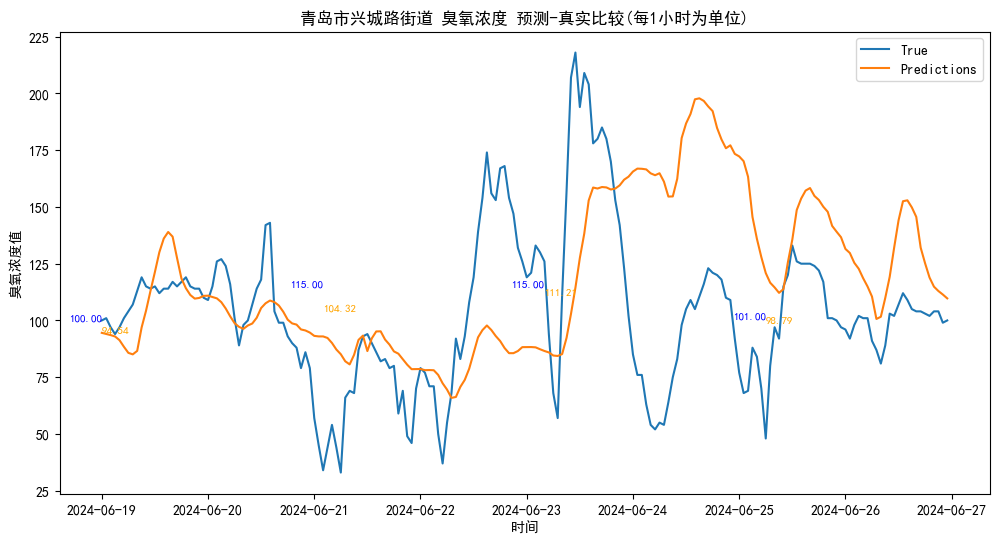

rmse: 44.935163138411916
r2 score: -0.7423671442882838
all
rmse: 44.935163138411916
r2 score: -0.7423671442882838
all-1
rmse: 46.50302504265957
r2 score: -0.4997464272159178
all-2
rmse: 33.1507665314148
r2 score: 0.29668830120238854


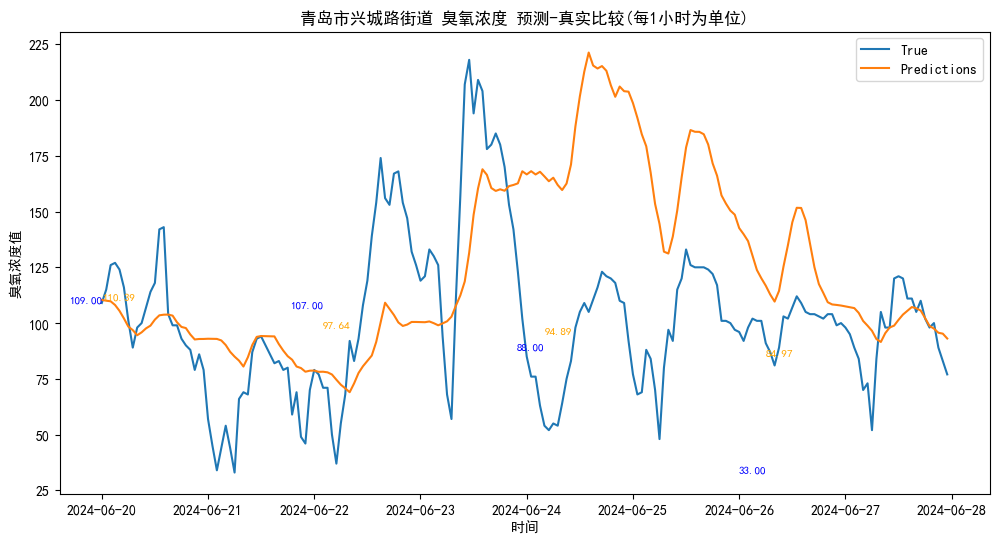

rmse: 49.96772522248183
r2 score: -1.101372021784722
all
rmse: 49.96772522248183
r2 score: -1.101372021784722
all-1
rmse: 56.04892733553903
r2 score: -1.0687448792179635
all-2
rmse: 52.606281714476474
r2 score: -0.614539087024571


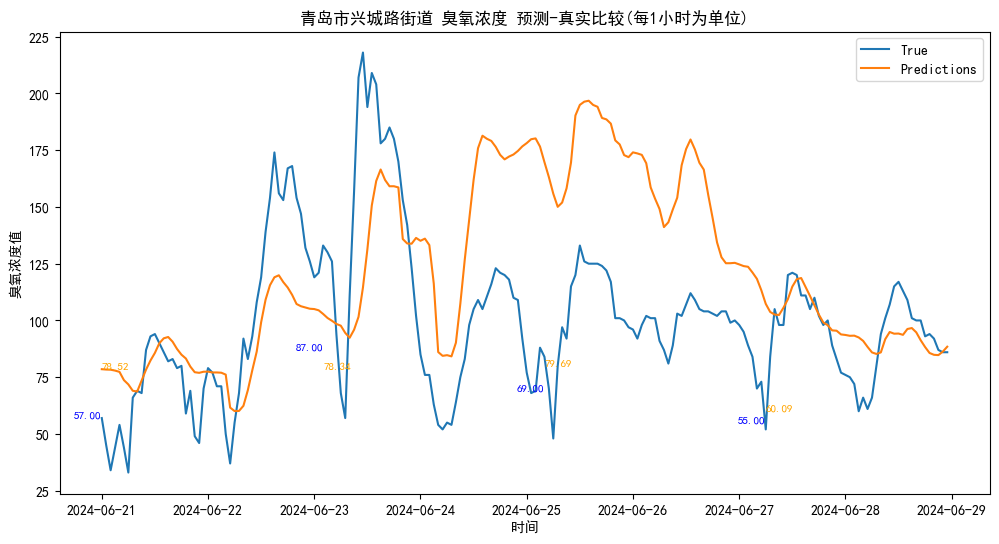

rmse: 45.427257869312726
r2 score: -0.7210952377130115
all
rmse: 45.427257869312726
r2 score: -0.7210952377130115
all-1
rmse: 51.22292285177393
r2 score: -0.7770980043029925
all-2
rmse: 49.87994771456887
r2 score: -0.4139063684824178


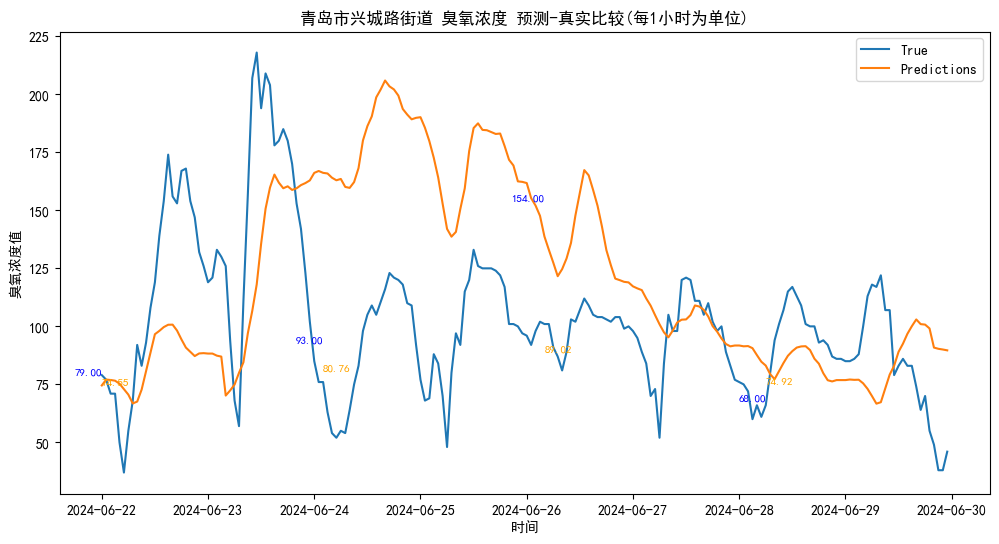

rmse: 51.32010398508775
r2 score: -1.3551203262704319
all
rmse: 51.32010398508775
r2 score: -1.3551203262704319
all-1
rmse: 57.17512137480599
r2 score: -1.6728424052187298
all-2
rmse: 62.047198483645865
r2 score: -1.7965930719150576


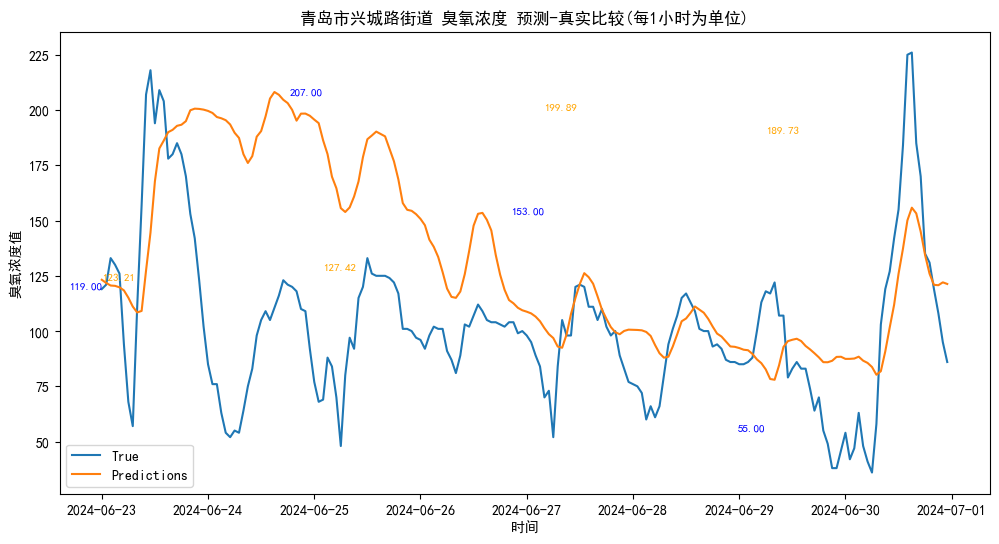

rmse: 53.44389493535178
r2 score: -1.1856607994384762
all
rmse: 53.44389493535178
r2 score: -1.1856607994384762
all-1
rmse: 58.86242880067407
r2 score: -2.3989264479359247
all-2
rmse: 64.01020391033724
r2 score: -2.668436947388839


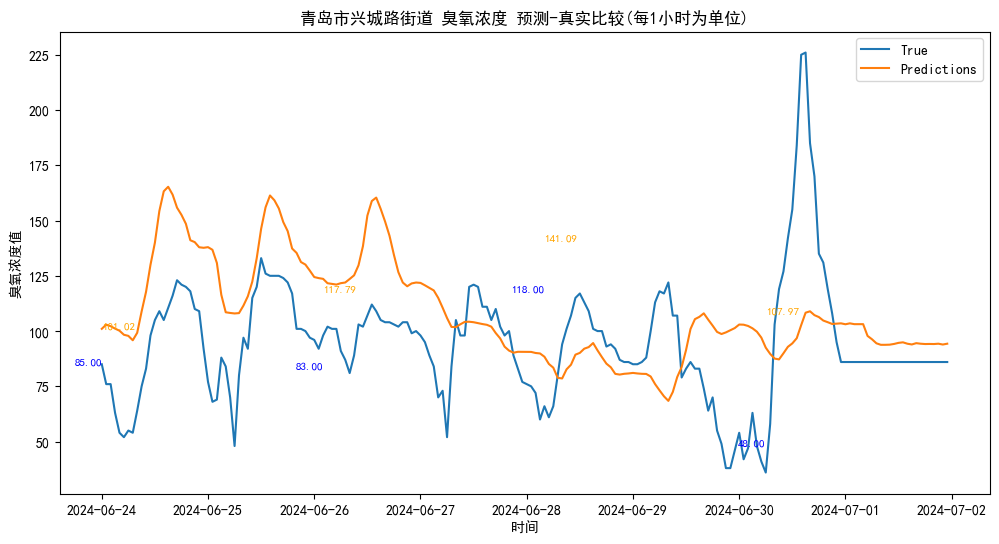

rmse: 34.050749325848194
r2 score: -0.5016707039215866
all
rmse: 34.050749325848194
r2 score: -0.5016707039215866
all-1
rmse: 31.414901064793163
r2 score: -1.3269662021948405
all-2
rmse: 30.37858153801579
r2 score: -1.5446634800517267


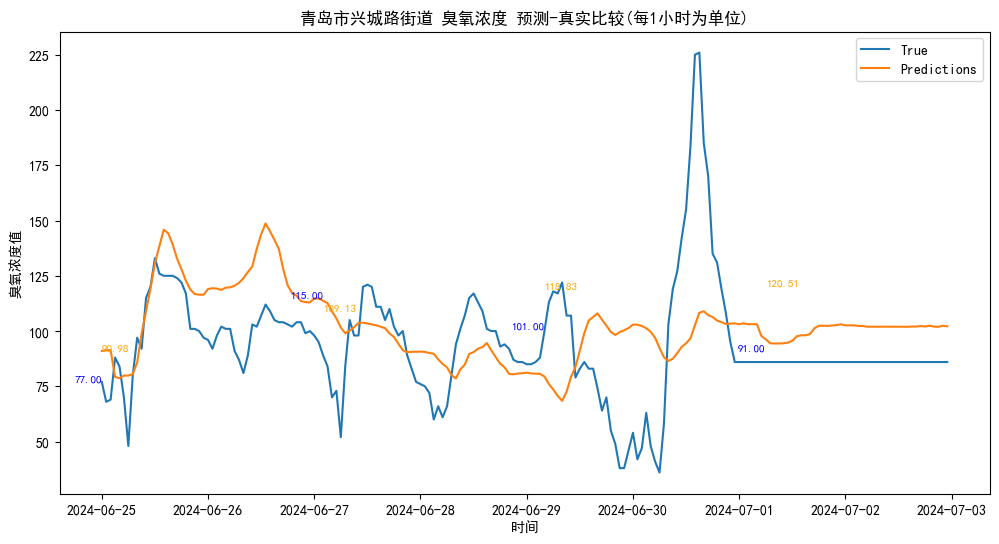

rmse: 28.747112687299015
r2 score: -0.16892073579835043
all
rmse: 28.747112687299015
r2 score: -0.16892073579835043
all-1
rmse: 32.03348575768693
r2 score: -0.12242039274365957
all-2
rmse: 24.192148055807248
r2 score: -0.4917417864590443


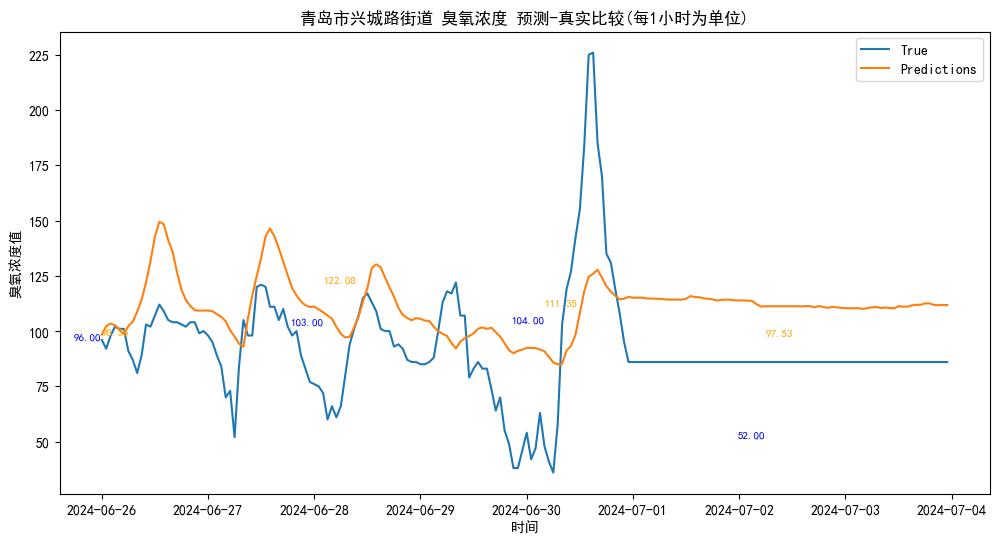

rmse: 29.009353275292348
r2 score: -0.31211935634543786
all
rmse: 29.009353275292348
r2 score: -0.31211935634543786
all-1
rmse: 30.132734506052806
r2 score: -0.08359873128382489
all-2
rmse: 30.428035004789145
r2 score: 0.06382735996859179


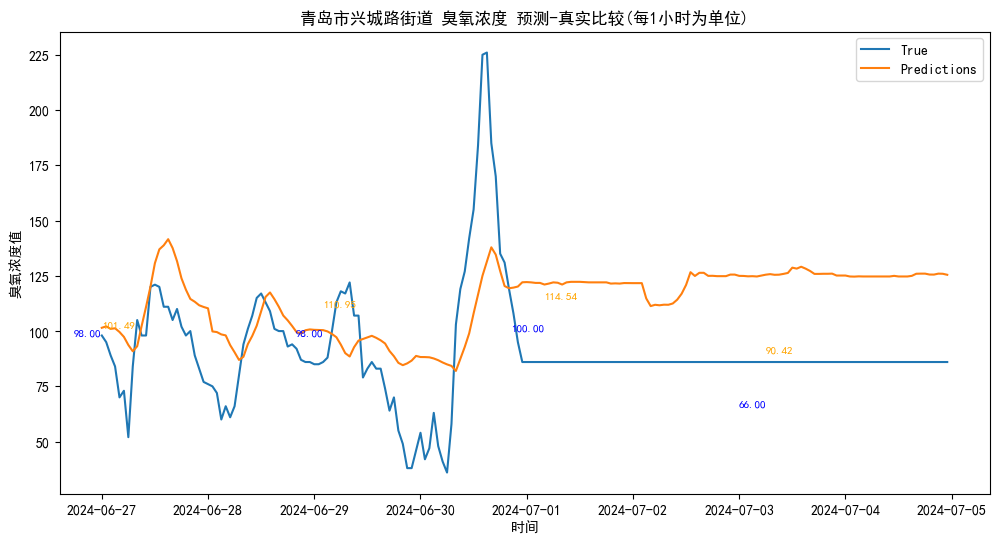

rmse: 33.674330658320756
r2 score: -0.8008903030251942
all
rmse: 33.674330658320756
r2 score: -0.8008903030251942
all-1
rmse: 31.456138030402045
r2 score: -0.1913277219011127
all-2
rmse: 30.786099897096594
r2 score: 0.04077401927296809


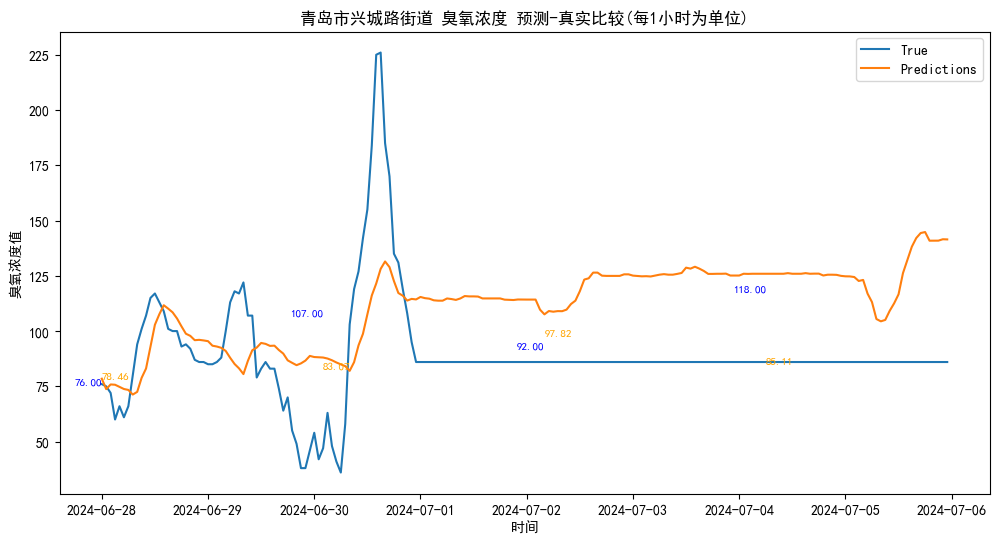

rmse: 34.99039643978781
r2 score: -1.0658226204873538
all
rmse: 34.99039643978781
r2 score: -1.0658226204873538
all-1
rmse: 32.62027490626155
r2 score: -0.354887972724681
all-2
rmse: 30.915450744114263
r2 score: -0.01917142969431218


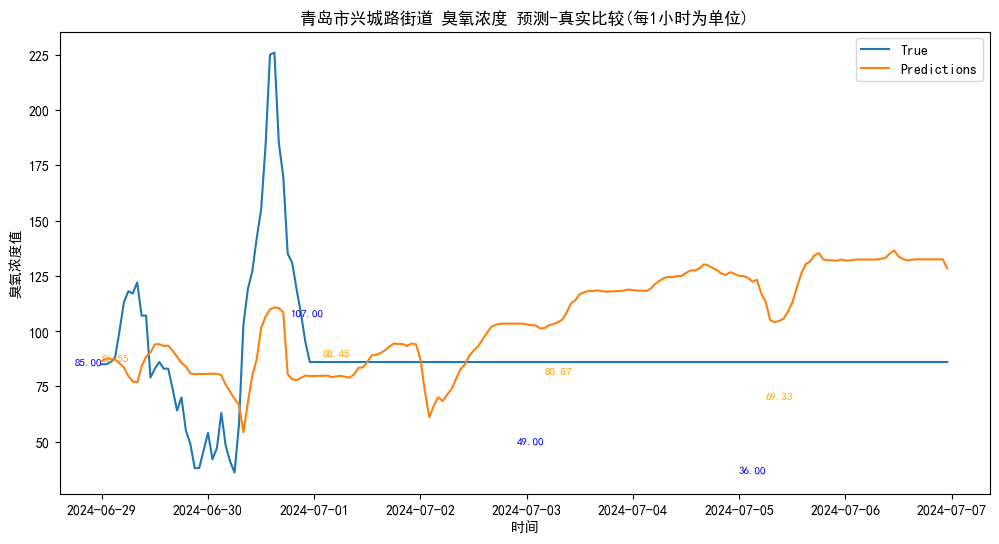

rmse: 34.60536579800371
r2 score: -1.144539784904325
all
rmse: 34.60536579800371
r2 score: -1.144539784904325
all-1
rmse: 31.644321613378622
r2 score: -0.35147916164919213
all-2
rmse: 30.036007379571227
r2 score: -0.018628384047820523


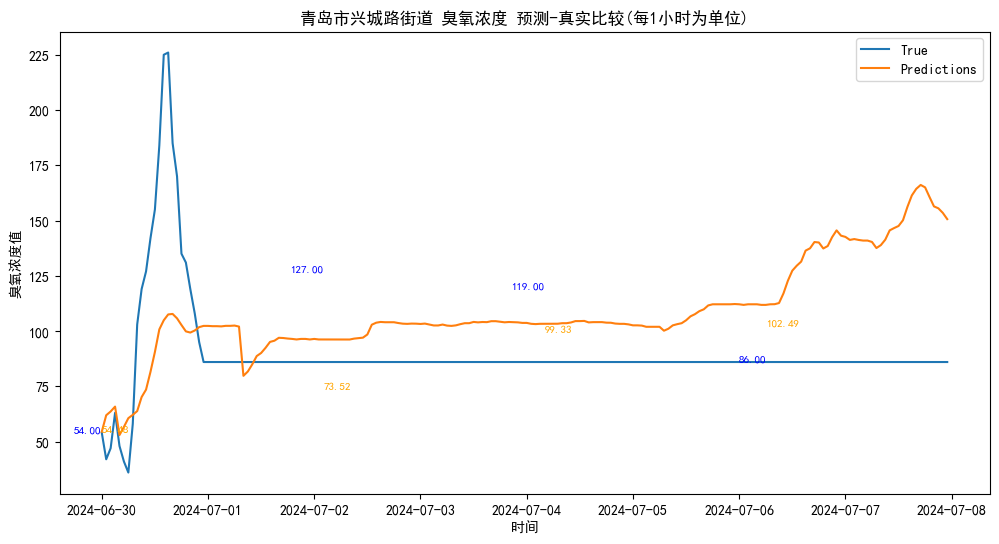

rmse: 35.16881441878969
r2 score: -1.5789758285402211
all
rmse: 35.16881441878969
r2 score: -1.5789758285402211
all-1
rmse: 26.047726983713
r2 score: -0.06917076073278916
all-2
rmse: 26.996067623328408
r2 score: 0.03706498864514618


In [41]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
for i in range(len(df_list)):
# 绘制真实值和预测值的曲线
    plt.figure(figsize=(12, 6))
    plt.title("青岛市兴城路街道 臭氧浓度 预测-真实比较(每1小时为单位)")
    plt.plot(df_list[i]['日期'],y_list[i].values, label='True')
    plt.plot(df_list[i]['日期'],y_pred_list[i], label='Predictions')
    plt.xlabel('时间')
    plt.ylabel('臭氧浓度值')

# 显示每个具体的数值
    for j in range(0, len(df_list[i]), 10):
        if 5 * j < len(df_list[i]) and j < len(y_list[i]) and j < len(y_pred_list[i]):
            plt.text(df_list[i].iloc[5*j]['日期'], y_list[i].values[j], f'{y_list[i].values[j]:.2f}', color='blue', fontsize=8, ha='right')
            plt.text(df_list[i].iloc[5*j]['日期'], y_pred_list[i][j], f'{y_pred_list[i][j]:.2f}', color='orange', fontsize=8, ha='left')
    plt.legend()
    plt.show()
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values, y_pred_list[i])))
    print("r2 score:", r2_score(y_list[i].values, y_pred_list[i]))
    print("all")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values, y_pred_list[i])))
    print("r2 score:", r2_score(y_list[i].values, y_pred_list[i]))
    print("all-1")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values[:-(2*24)], y_pred_list[i][:-(2*24)])))
    print("r2 score:", r2_score(y_list[i].values[:-(2*24)], y_pred_list[i][:-(2*24)]))
    print("all-2")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values[:-(3 *24)], y_pred_list[i][:-(3 *24)])))
    print("r2 score:", r2_score(y_list[i].values[:-(3 *24)], y_pred_list[i][:-(3 *24)]))

In [42]:
# from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
# import matplotlib.dates as mdates
# from datetime import datetime, timedelta
# date_range_list = []
# date_range_list111 = []
# start_date111 = datetime(2024, 5, 16, 0, 0, 0) 
# end_date111 = datetime(2024, 5, 22, 23, 0, 0)
# date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
# merged_data111 = pd.merge(pd.DataFrame(date_range111, columns=['日期']), datat, on='日期', how='inner')
# while end_date111 < datetime(2024, 7, 1, 0, 0, 0):
#     date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
#     date_range_list111.append(date_range111)
#     end_date111 += timedelta(hours=1)
#     start_date111 = end_date111
#     end_date111 += timedelta(days=1)
#     end_date111 -= timedelta(hours=1)


# true_value_list1 = []
# true_value_list1 = merged_data111['O3VAL'].tolist()



# start_date = datetime(2024, 5, 16, 0, 0, 0) 
# end_date = datetime(2024, 5, 16, 23, 0, 0)
# while end_date < datetime(2024, 7, 1, 0, 0, 0):
#     date_range = pd.date_range(start=start_date, end=end_date, freq='H')
#     date_range_list.append(date_range)
#     end_date += timedelta(hours=1)
#     start_date = end_date
#     end_date += timedelta(days=1)
#     end_date -= timedelta(hours=1)

# num = 0
# colors = [
#  '#d3e5f3','#a1cae1', 
#     '#5d9fcd', '#4292c6',  '#3171ad',
#     '#2864a0', '#2171b5',   '#08306b','orange'
# ]
# true_legend_added = 0 
# pred_value_list_7 = np.array([])
# pred_value_list_6 = np.array([])
# pred_value_list_5 = np.array([])
# pred_value_list_4 = np.array([])
# pred_value_list_3 = np.array([])
# pred_value_list_2 = np.array([])
# pred_value_list_1 = np.array([])
# pred_value_list_0 = np.array([])

# for date_ranges in date_range_list:
#     num = 7
#     for i in range(len(df_list)):
#         is_in_list = df_list[i]['日期'].isin(date_ranges)
#         rmse_list = []
#         r2_list = []
#         if is_in_list.any():
#             matching_indices = df_list[i].index[is_in_list].tolist()
#             matching_values = df_list[i].loc[is_in_list, '日期'].tolist()
#             if num == 7:
#                 pred_value_list_7 = np.concatenate((pred_value_list_7, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 6:
#                 pred_value_list_6 = np.concatenate((pred_value_list_6, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 5:
#                 pred_value_list_5 = np.concatenate((pred_value_list_5, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 4:
#                 pred_value_list_4 = np.concatenate((pred_value_list_4, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 3:
#                 pred_value_list_3 = np.concatenate((pred_value_list_3, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 2:
#                 pred_value_list_2 = np.concatenate((pred_value_list_2, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 1:
#                 pred_value_list_1 = np.concatenate((pred_value_list_1, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 0:
#                 pred_value_list_0 = np.concatenate((pred_value_list_0, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             num-=1



# plt.figure(figsize=(15, 6))
# plt.title("青岛市八大关街道 臭氧浓度 预测-真实比较(每1小时为单位)")
# plt.plot(date_range111,pred_value_list_7,color=colors[0], label='n-7')
# plt.plot(date_range111,pred_value_list_6,color=colors[1], label='n-6')
# plt.plot(date_range111,pred_value_list_5,color=colors[2], label='n-5')
# plt.plot(date_range111,pred_value_list_4,color=colors[3], label='n-4')
# plt.plot(date_range111,pred_value_list_3,color=colors[4], label='n-3')
# plt.plot(date_range111,pred_value_list_2,color=colors[5], label='n-2')
# # plt.plot(date_range111,pred_value_list_1,color=colors[6], label='n-1')
# # plt.plot(date_range111,pred_value_list_0,color=colors[7], label='n-0')
# plt.plot(date_range111,true_value_list,color=colors[-1], label='True')
# plt.legend()
# plt.show()   


# print('n-7 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_7)))
# print('n-7 R2:',r2_score(true_value_list, pred_value_list_7))
# print('n-6 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_6)))
# print('n-6 R2:',r2_score(true_value_list, pred_value_list_6))
# print('n-5 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_5)))
# print('n-5 R2:',r2_score(true_value_list, pred_value_list_5))
# print('n-4 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_4)))
# print('n-4 R2:',r2_score(true_value_list, pred_value_list_4))
# print('n-3 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_3)))
# print('n-3 R2:',r2_score(true_value_list, pred_value_list_3))
# print('n-2 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_2)))
# print('n-2 R2:',r2_score(true_value_list, pred_value_list_2))
# # print('n-1 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_1)))
# # print('n-1 R2:',r2_score(true_value_list, pred_value_list_1))
# # print('n-0 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_0)))
# # print('n-0 R2:',r2_score(true_value_list, pred_value_list_0))
# # r2_list.append(r2_score(y_list[i].values[int(matching_indices[0]/5):int(matching_indices[(j+1)*24-1]/5)+1], y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[(j+1)*24-1]/5)+1]))
# # print(f"第{num}条线,前{j+1}天 rmse:", rmse_list[j])
# # print(f"第{num}条线,前{j+1}天 r2 score:", r2_list[j])

In [43]:
# for i in range(46):

#     mase7 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_7[i*24:i*24+24]))
#     mase6 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_6[i*24:i*24+24]))
#     mase5 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_5[i*24:i*24+24]))
#     mase4 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_4[i*24:i*24+24]))
#     mase3 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_3[i*24:i*24+24]))
#     mase2 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_2[i*24:i*24+24]))
#     mase1 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_1[i*24:i*24+24]))
#     mase0 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_0[i*24:i*24+24]))
    
#     r27 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_7[i*24:i*24+24])
#     r26 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_6[i*24:i*24+24])
#     r25 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_5[i*24:i*24+24])
#     r24 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_4[i*24:i*24+24])
#     r23 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_3[i*24:i*24+24])
#     r22 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_2[i*24:i*24+24])
#     r21 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_1[i*24:i*24+24])
#     r20 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_0[i*24:i*24+24])
#     rmse_list = []
#     r2_list = []
#     rmse_list.append(mase7)
#     rmse_list.append(mase6)
#     rmse_list.append(mase5)
#     rmse_list.append(mase4)
#     rmse_list.append(mase3)
#     rmse_list.append(mase2)
#     rmse_list.append(mase1)
#     rmse_list.append(mase0)
#     std_dev1 = np.std(rmse_list)
#     r2_list.append(r27)
#     r2_list.append(r26)
#     r2_list.append(r25)
#     r2_list.append(r24)
#     r2_list.append(r23)
#     r2_list.append(r22)
#     r2_list.append(r21)
#     r2_list.append(r20)
#     std_dev2 = np.std(r2_list)
#     col_name1 = 'rmse'
#     col_name2 = 'r2'
    
    
    


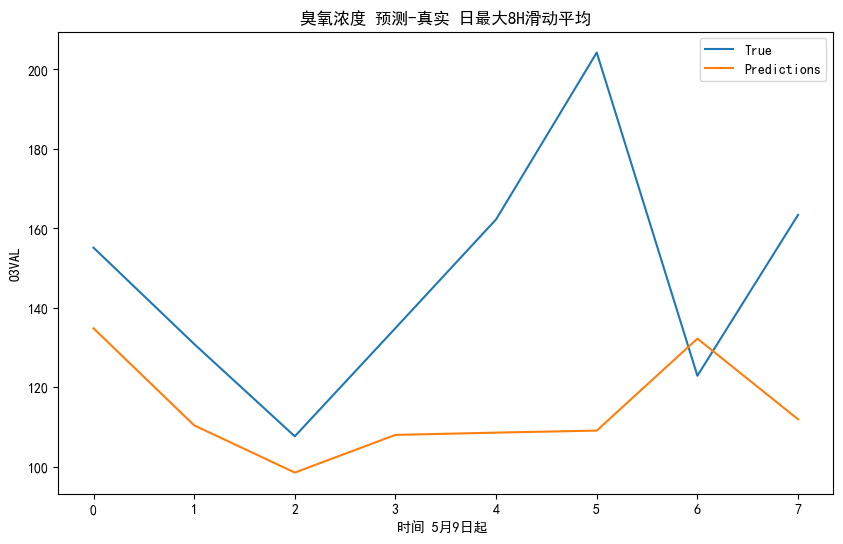

rmse: 45.16039035638536
r2 score: -1.5572080909939578
rmse: 20.391129731246348
r2 score: -1.8282583685680942
rmse: 17.462036926201776
r2 score: 0.1892449196770013
rmse: 20.235524716614684
r2 score: -0.43881044666906344
rmse: 30.068045880124345
r2 score: -1.4246230546205187
rmse: 47.57491748124359
r2 score: -1.4667139386888444


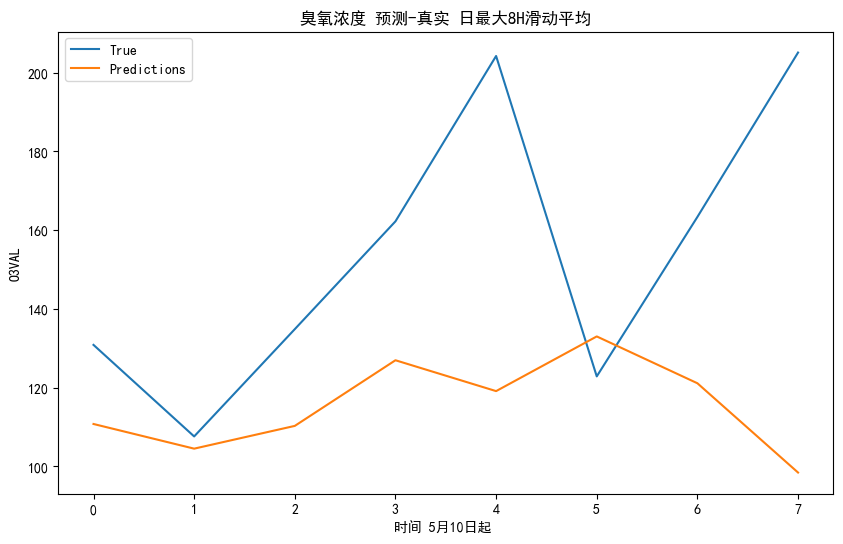

rmse: 53.35255271027014
r2 score: -1.4447470238317548
rmse: 14.373497853312617
r2 score: -0.5287589541574371
rmse: 18.412002420652325
r2 score: -1.3485165001389117
rmse: 23.776593085671504
r2 score: -0.5033284732893084
rmse: 43.60134798242611
r2 score: -0.7400231757647939
rmse: 40.01753605911712
r2 score: -0.6046654548253787


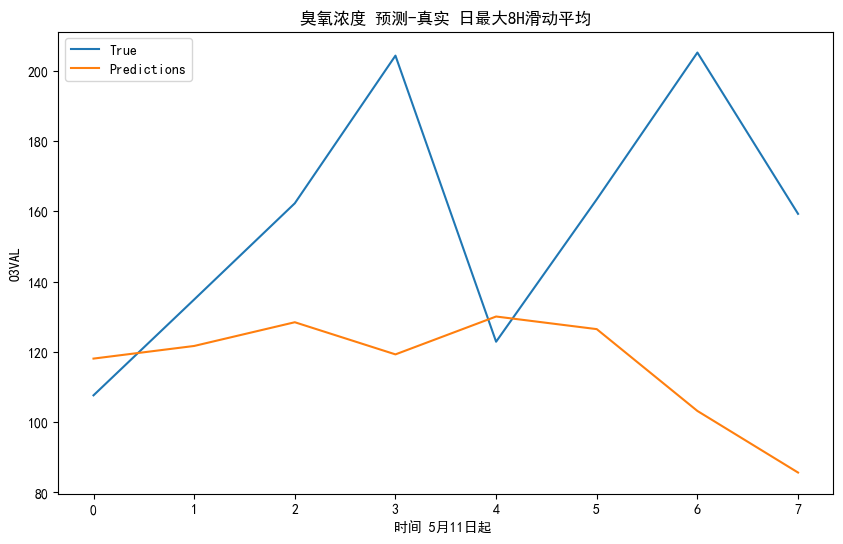

rmse: 56.8665938108249
r2 score: -1.9694800904404604
rmse: 11.908462033762302
r2 score: 0.2360967971878022
rmse: 21.819759775212546
r2 score: 0.04265709681401397
rmse: 46.50128347108765
r2 score: -0.6968805591870761
rmse: 41.71544832117104
r2 score: -0.5033697109755602
rmse: 40.95490468051206
r2 score: -0.6693948794972104


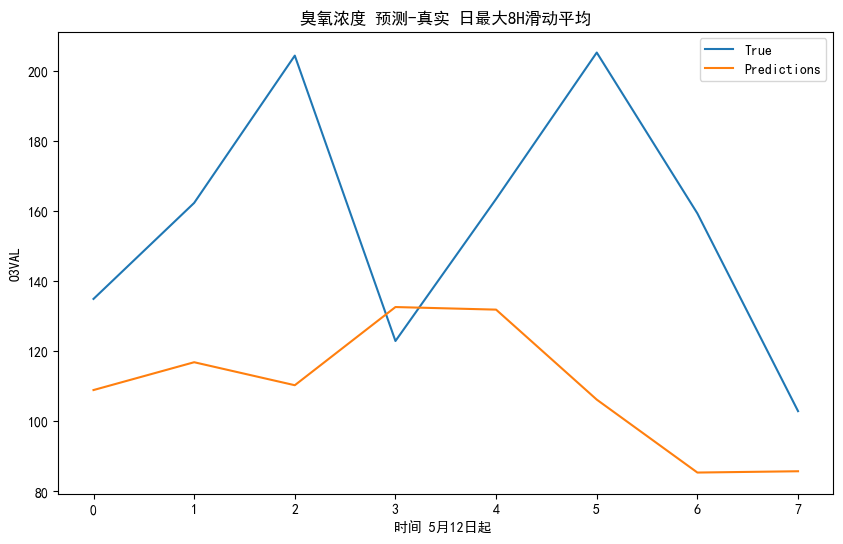

rmse: 59.37919482232792
r2 score: -2.0642474767886774
rmse: 37.005850899565736
r2 score: -6.309581706074267
rmse: 62.10673127176336
r2 score: -3.7384496224967148
rmse: 54.00347863176984
r2 score: -1.983015811463904
rmse: 50.32133429051471
r2 score: -2.2025910293182727
rmse: 61.17523325972864
r2 score: -2.8439193327332615


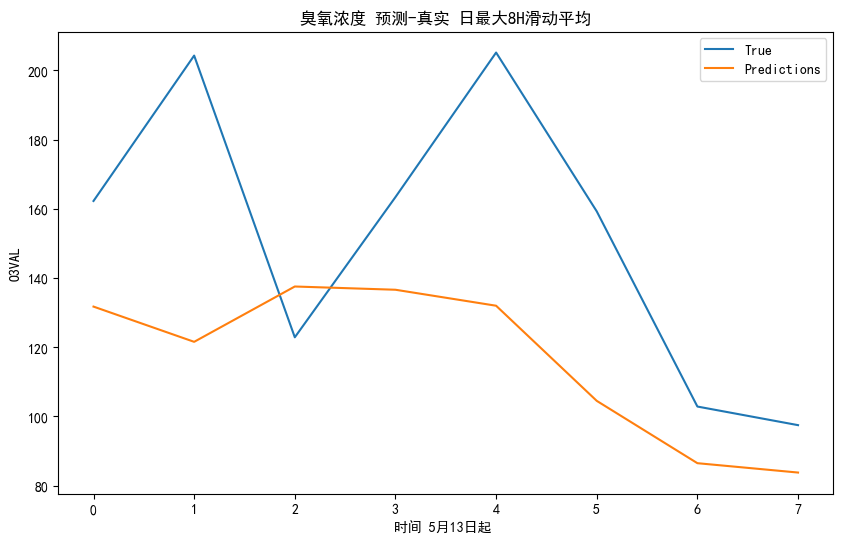

rmse: 46.767241883853295
r2 score: -0.44955892643235784
rmse: 62.31806004119606
r2 score: -7.806214529020675
rmse: 51.58290564070186
r2 score: -1.4100732242294334
rmse: 46.633314630435976
r2 score: -1.626296742362784
rmse: 53.00305028311009
r2 score: -1.9765180805457523
rmse: 53.29515401774088
r2 score: -2.5169591419042843


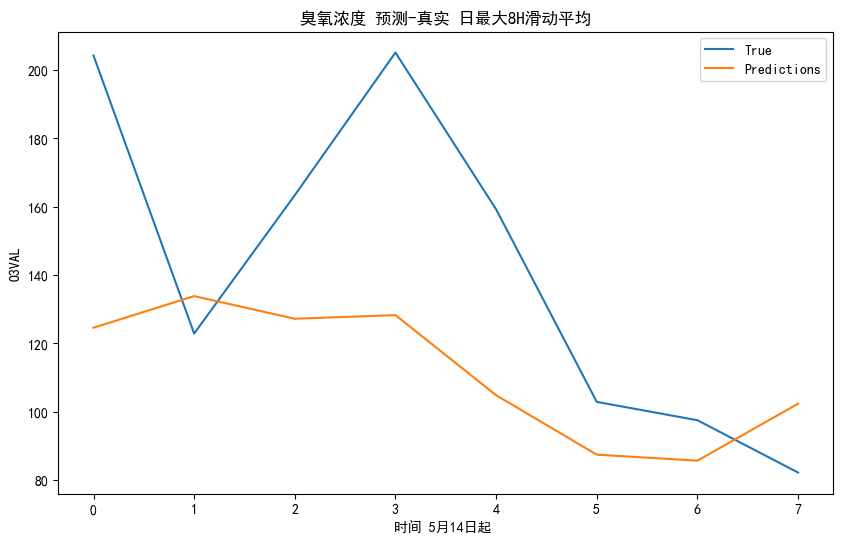

rmse: 46.673829994434264
r2 score: -0.08459068888556032
rmse: 56.86302787798434
r2 score: -0.9531605836225505
rmse: 50.90804831917454
r2 score: -1.3482215442239465
rmse: 58.483872150823174
r2 score: -1.9674881031928342
rmse: 57.693822742610486
r2 score: -2.4801053183482917
rmse: 53.043475371342666
r2 score: -0.9523213469253506


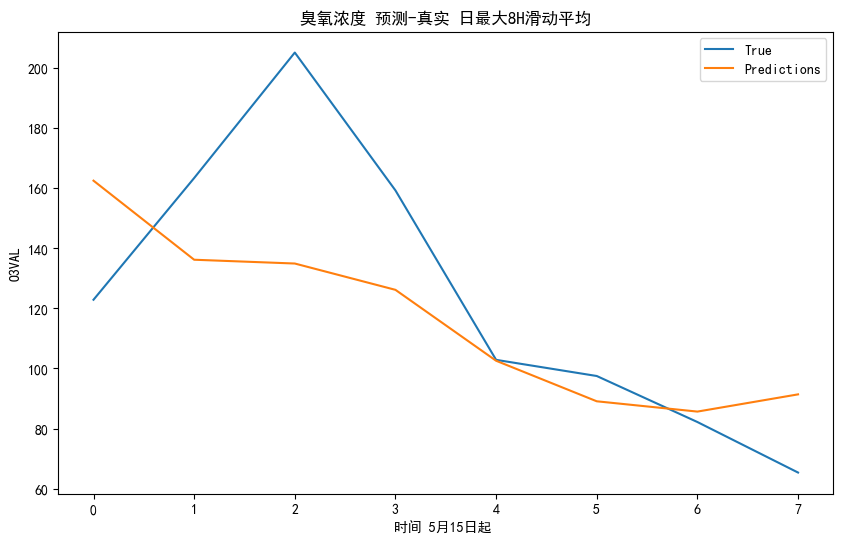

rmse: 33.70954939854677
r2 score: 0.4211162828004227
rmse: 33.97657890846907
r2 score: -1.8151999129972274
rmse: 49.1144999228176
r2 score: -1.1392692843944028
rmse: 45.63710663235602
r2 score: -1.4515421990971795
rmse: 40.819292330189825
r2 score: -0.3314166064736339
rmse: 37.420774730982195
r2 score: 0.024831845772145367


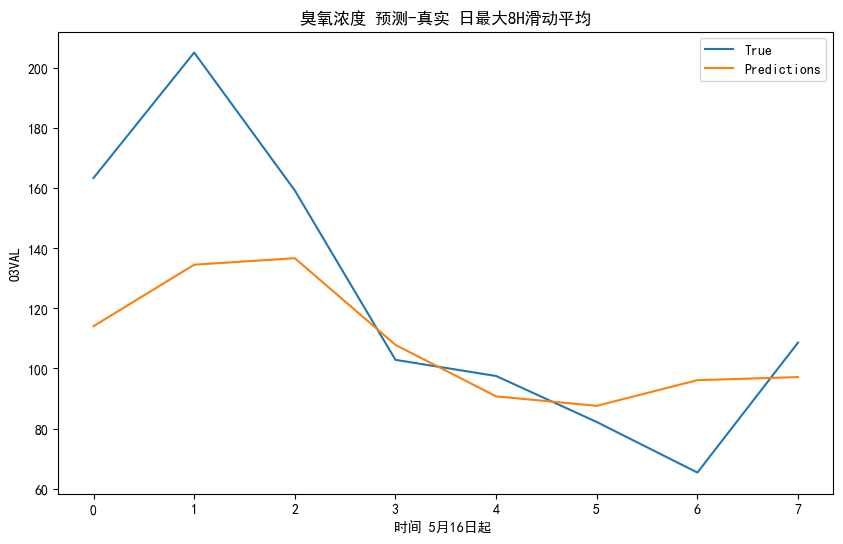

rmse: 33.72717205008891
r2 score: 0.4289874865926484
rmse: 60.888347966186956
r2 score: -7.5077635897771025
rmse: 51.39197858849335
r2 score: -5.15076789614987
rmse: 44.57656196178255
r2 score: -0.5026490020157981
rmse: 39.98564665884514
r2 score: 0.023247703571286804
rmse: 36.56795028512861
r2 score: 0.3046281207082181


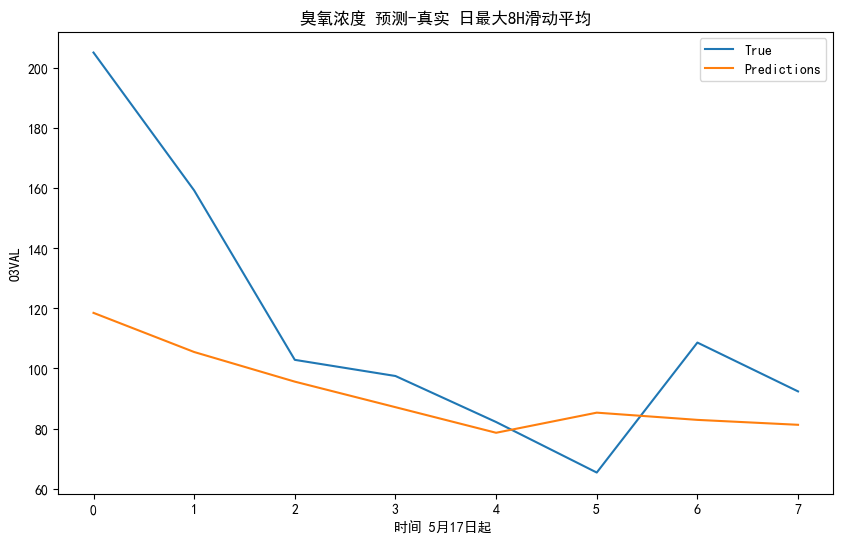

rmse: 38.32294673208113
r2 score: 0.1963668057448147
rmse: 72.0894370929777
r2 score: -8.877592503752288
rmse: 59.00950181185511
r2 score: -0.9913363705746734
rmse: 51.3663511847526
r2 score: -0.3546926338746017
rmse: 45.97130799382769
r2 score: 0.0008224035849989653
rmse: 42.74731864563453
r2 score: 0.2163069090958506


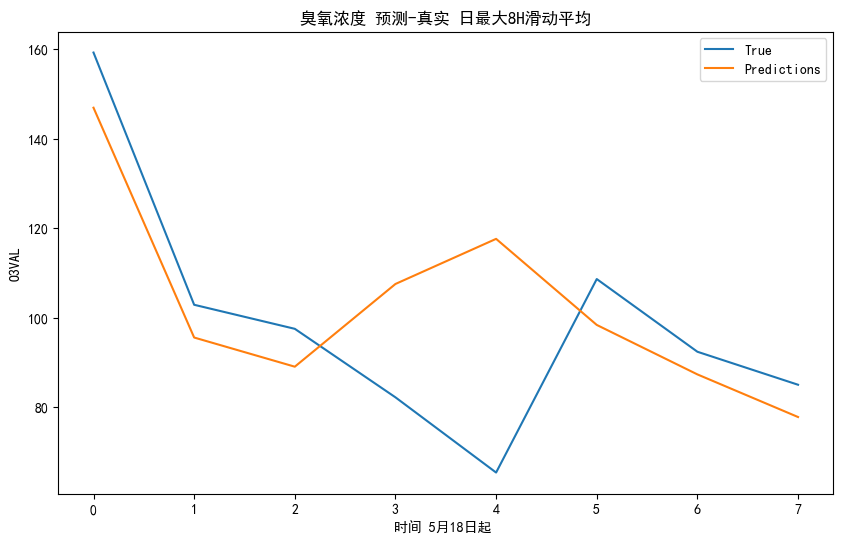

rmse: 21.880937712700984
r2 score: 0.2897802845416604
rmse: 10.139774758363933
r2 score: 0.8705972525676338
rmse: 9.613744713570929
r2 score: 0.8815091626433882
rmse: 15.159336453928384
r2 score: 0.7300607616020862
rmse: 27.00882976446934
r2 score: 0.2750067449158262
rmse: 25.008385363074325
r2 score: 0.2604381681735145


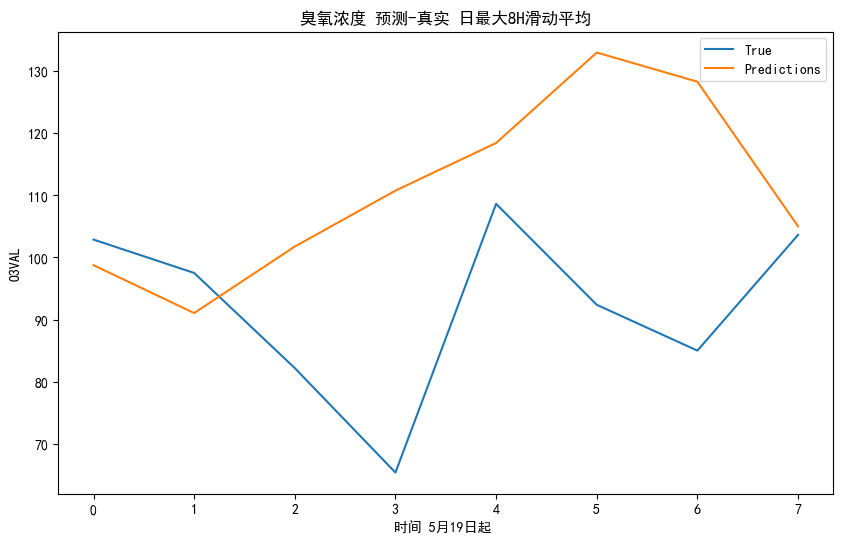

rmse: 27.657957592944577
r2 score: -3.327757764718111
rmse: 5.413959754709517
r2 score: -3.0581967646064205
rmse: 12.128982696365314
r2 score: -0.9151470644306885
rmse: 25.00187408861865
r2 score: -1.93104695695911
rmse: 22.786938552098402
r2 score: -1.1146723082021364
rmse: 26.597310336514038
r2 score: -2.4545791448553644


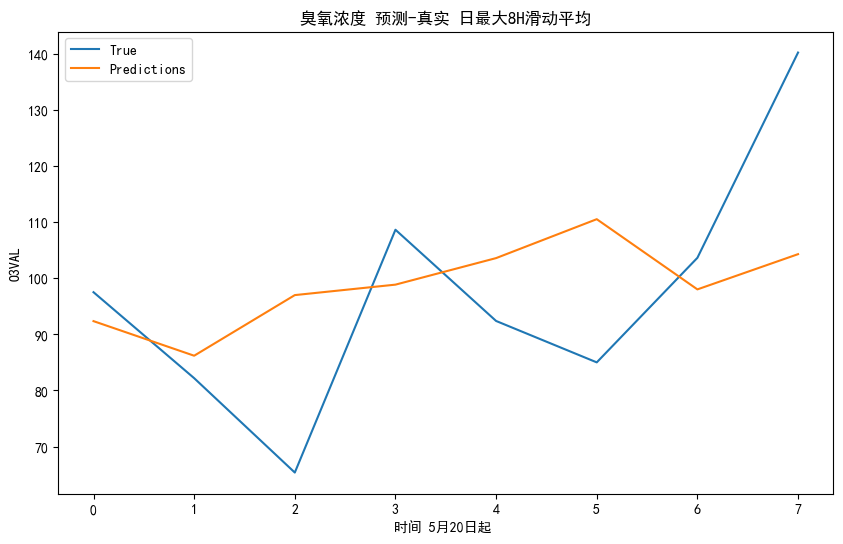

rmse: 20.107441543288125
r2 score: 0.056791545677289945
rmse: 4.612261978712009
r2 score: 0.6370926844861481
rmse: 18.633406218398985
r2 score: -1.0171304247265396
rmse: 16.861494005267453
r2 score: -0.07225636769944277
rmse: 15.89126972820513
r2 score: -0.1766423575231657
rmse: 17.856646862242066
r2 score: -0.7585897464654769


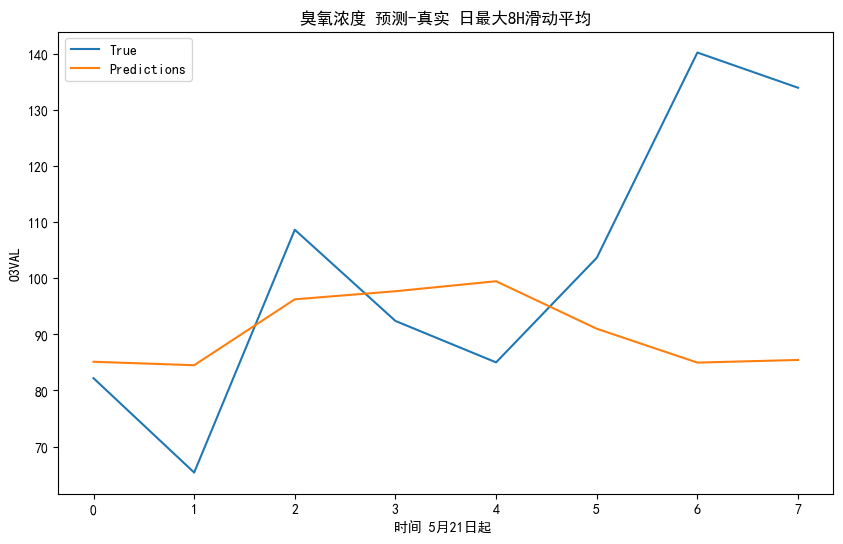

rmse: 28.118719230721183
r2 score: -0.3643031996876631
rmse: 13.675952856092959
r2 score: -1.6467357692487252
rmse: 13.261886887918292
r2 score: 0.44501832301189637
rmse: 11.7865907354766
r2 score: 0.43713017408984733
rmse: 12.366014099612572
r2 score: 0.22840139662400727
rmse: 12.411127585373373
r2 score: 0.24816392011808608


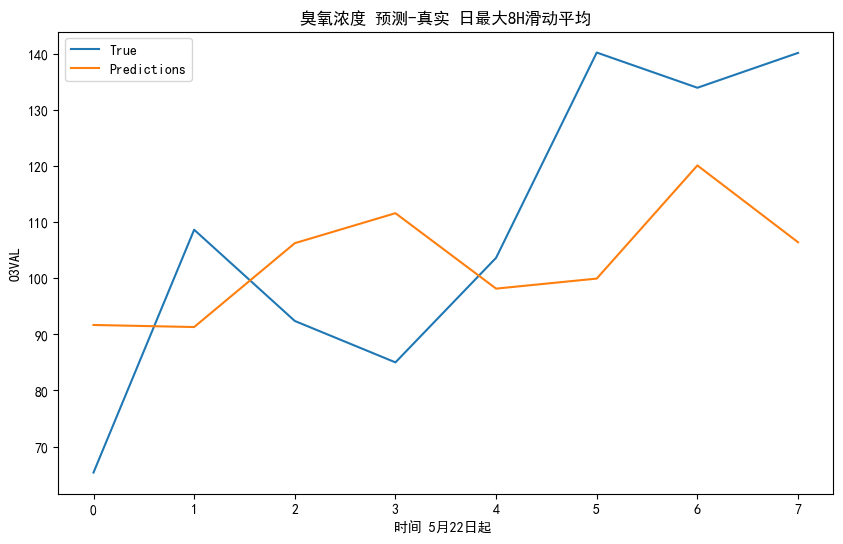

rmse: 24.672261046691755
r2 score: 0.08906038657959459
rmse: 22.263465015577438
r2 score: -0.05992047739616413
rmse: 19.860677801169487
r2 score: -0.2396939908321789
rmse: 21.734320251994784
r2 score: -0.957396976646695
rmse: 19.594058284216676
r2 score: -0.6483749049333123
rmse: 24.292339333252478
r2 score: -0.11317150715741398


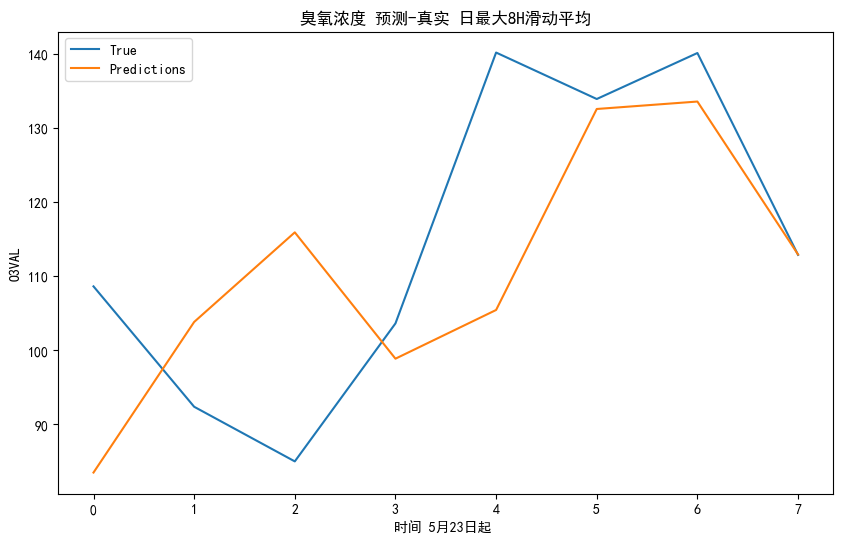

rmse: 19.343394322941396
r2 score: 0.06709466509412831
rmse: 19.526425269720978
r2 score: -4.775621813987188
rmse: 23.933603395813403
r2 score: -4.881123774351365
rmse: 20.863283336598712
r2 score: -4.064864036239608
rmse: 24.284176408106983
r2 score: -0.6309113189525701
rmse: 22.17514002949661
r2 score: -0.19977454692925445


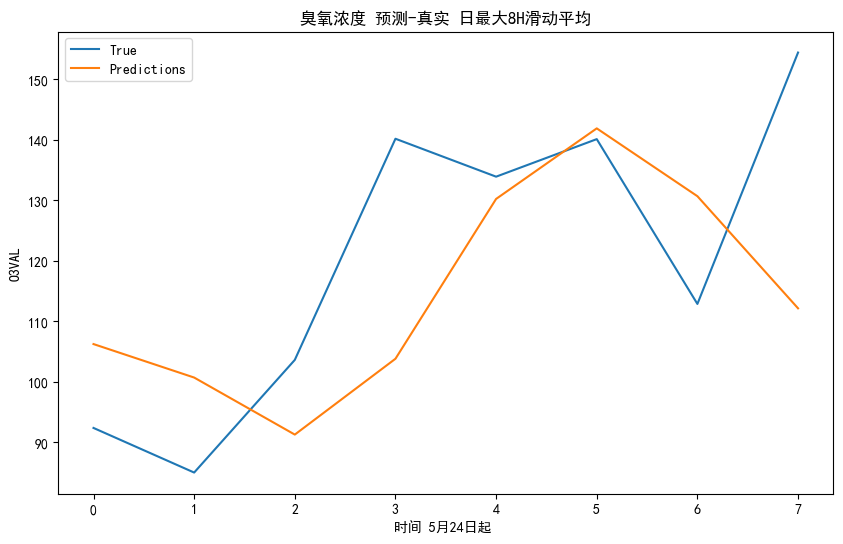

rmse: 22.4627483930627
r2 score: 0.10265963714661452
rmse: 14.81459491137435
r2 score: -15.140444967353751
rmse: 14.040982860532699
r2 score: -2.3614924818337943
rmse: 21.87769681692169
r2 score: -0.06416892848965094
rmse: 19.637078901589362
r2 score: 0.21442978933682533
rmse: 17.940794065338434
r2 score: 0.3888968610719996


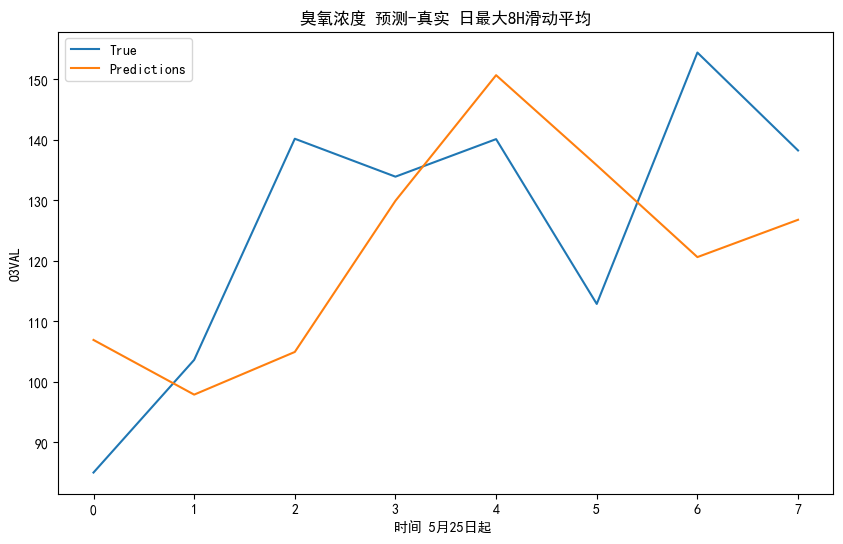

rmse: 21.460644241393624
r2 score: 0.024268034585974707
rmse: 16.024994811742
r2 score: -1.9611692009993988
rmse: 24.195349083356486
r2 score: -0.1140463504958753
rmse: 21.048306301931465
r2 score: 0.1226144950248762
rmse: 19.410586420510132
r2 score: 0.24577517238758462
rmse: 20.039728223943445
r2 score: 0.05400137458761556


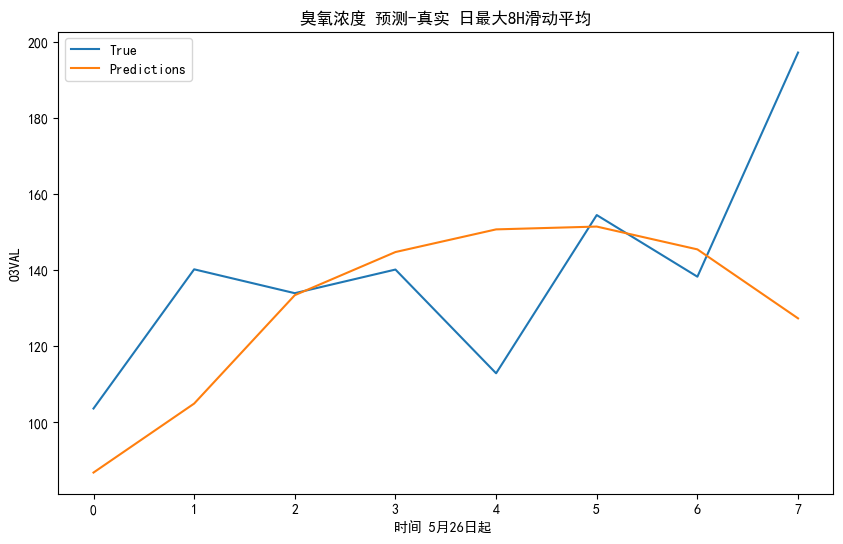

rmse: 31.44857975141843
r2 score: -0.420308012845505
rmse: 27.6271515021128
r2 score: -1.2838124862987512
rmse: 22.55945673641658
r2 score: -0.9969098914935346
rmse: 19.672017742775605
r2 score: -0.6896643776035547
rmse: 24.400399214019256
r2 score: -1.619875671272943
rmse: 22.308553453959714
r2 score: -0.6558789420294568


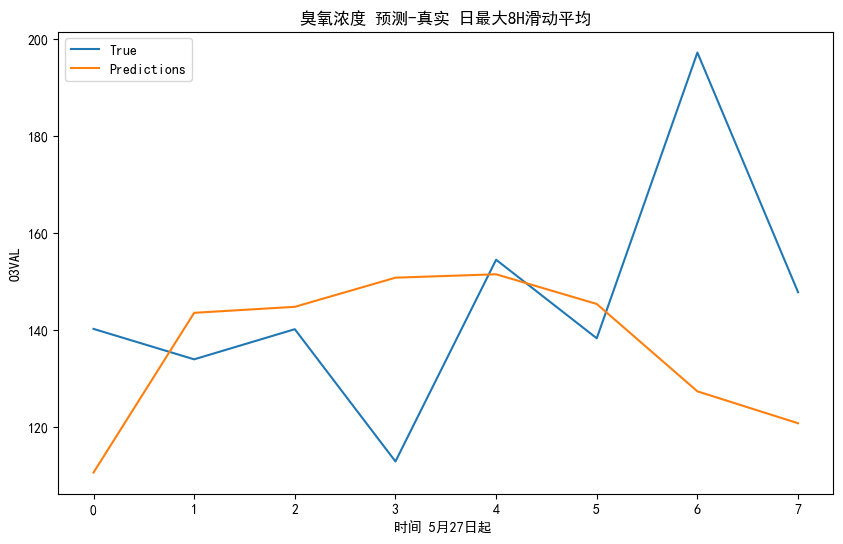

rmse: 31.787483467227958
r2 score: -0.9918733417992089
rmse: 21.998780912282744
r2 score: -48.22737794009863
rmse: 18.15799364902691
r2 score: -37.106966228463634
rmse: 24.61105757943255
r2 score: -3.8235472986183963
rmse: 22.05352950565166
r2 score: -1.6631587448427934
rmse: 20.338113261322274
r2 score: -1.7086427488594467


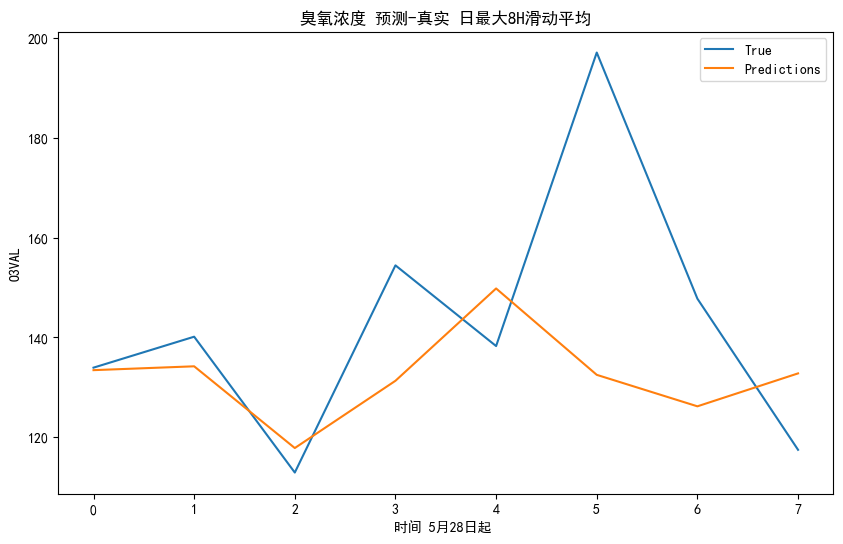

rmse: 26.480597893516627
r2 score: -0.17935595006170968
rmse: 4.213996199724895
r2 score: -0.8428849236460303
rmse: 4.460195088832908
r2 score: 0.8537084245872021
rmse: 12.204315648660343
r2 score: 0.3338110951706753
rmse: 12.076764792696423
r2 score: 0.19071577370379944
rmse: 28.602856766632073
r2 score: -0.2202543491068698


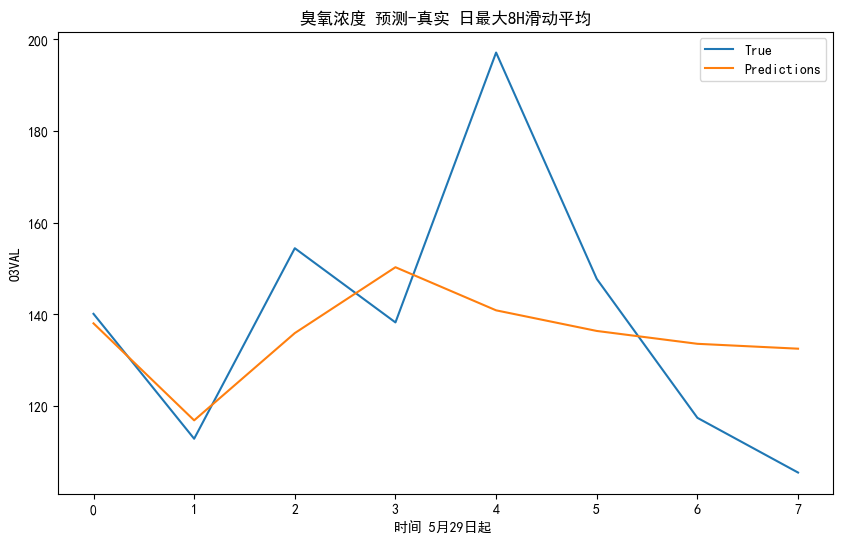

rmse: 24.471340366767574
r2 score: 0.19680563825862452
rmse: 3.1958793058243744
r2 score: 0.9449816303010373
rmse: 11.003616221339708
r2 score: 0.5926068777811766
rmse: 11.272366626533913
r2 score: 0.4327863242392973
rmse: 27.09557594473224
r2 score: 0.045036154655585636
rmse: 25.16570587867382
r2 score: 0.011611951291654599


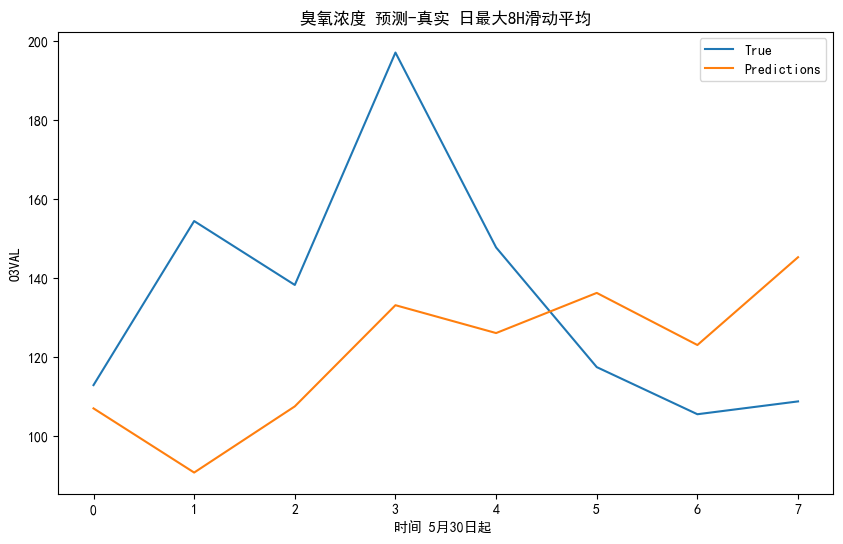

rmse: 38.08189905746378
r2 score: -0.7144333324762642
rmse: 45.24231414749796
r2 score: -3.739650171670519
rmse: 40.9877219053414
r2 score: -4.741675598707759
rmse: 47.79206706722574
r2 score: -1.4331229284318554
rmse: 43.832910779007584
r2 score: -1.553723322783254
rmse: 40.74315958680158
r2 score: -1.1418676336161608


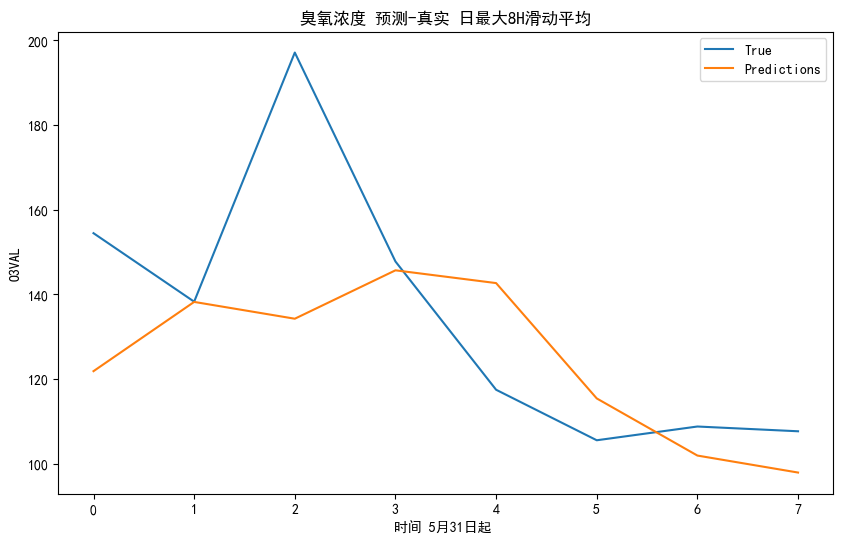

rmse: 27.1562113305422
r2 score: 0.16035315638194325
rmse: 23.05715217135841
r2 score: -7.1154341861816945
rmse: 40.905937689255595
r2 score: -1.7131966586052907
rmse: 35.44098191053866
r2 score: -1.4739695248218494
rmse: 33.64415675898012
r2 score: -0.6457730645364941
rmse: 30.976838637989268
r2 score: -0.1148853901591731


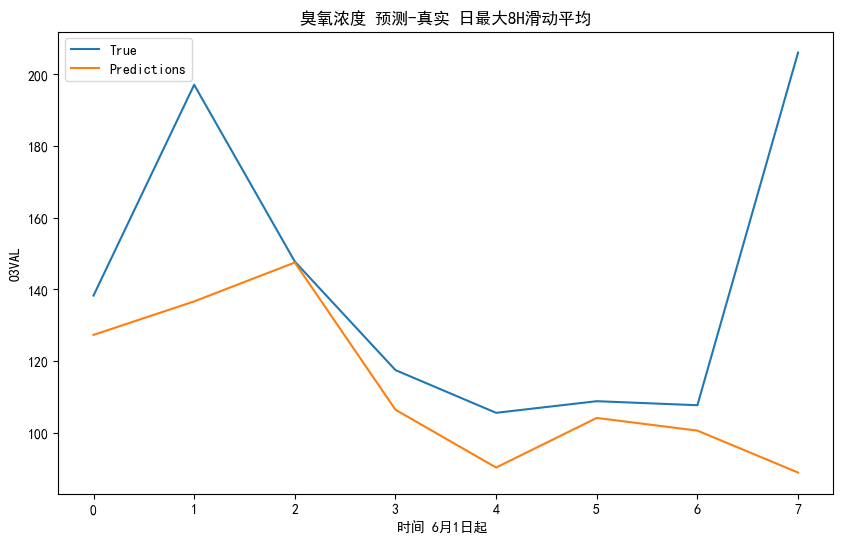

rmse: 47.39576720164559
r2 score: -0.5744914955017528
rmse: 43.48410869570884
r2 score: -1.1820228610555157
rmse: 35.50496269333844
r2 score: -0.8926680824640791
rmse: 31.24247396288103
r2 score: -0.14025199918319786
rmse: 28.767720263853807
r2 score: 0.17544541683410275
rmse: 26.330612854271145
r2 score: 0.2945335881584771


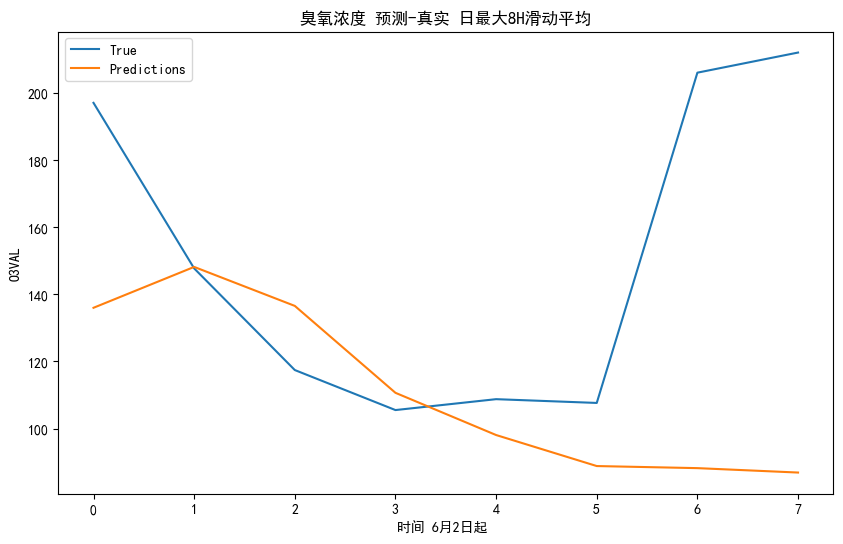

rmse: 65.38138754947899
r2 score: -1.1682075371131067
rmse: 43.21994927622465
r2 score: -2.064885678272678
rmse: 36.97681031932109
r2 score: -0.2677210773677461
rmse: 32.12600954150606
r2 score: 0.17555343870107443
rmse: 29.129745952180787
r2 score: 0.27959537152285185
rmse: 27.67969822417369
r2 score: 0.29582248162799496


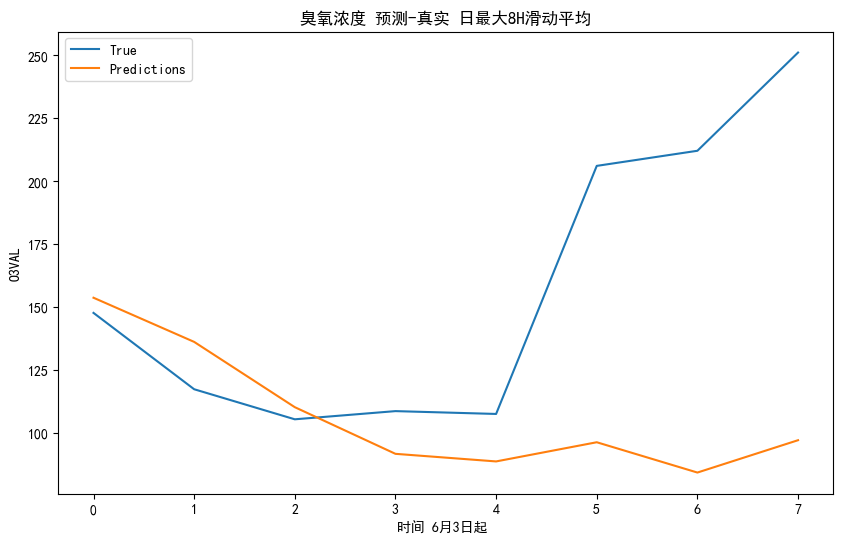

rmse: 81.4821783658485
r2 score: -1.2717567464107593
rmse: 13.959322691185324
r2 score: 0.15170838747343662
rmse: 11.731636158931401
r2 score: 0.564827338717548
rmse: 13.233664783756609
r2 score: 0.3708072102980151
rmse: 14.532014977214908
r2 score: 0.14370939528528714
rmse: 46.72195364885262
r2 score: -0.6810468641019958


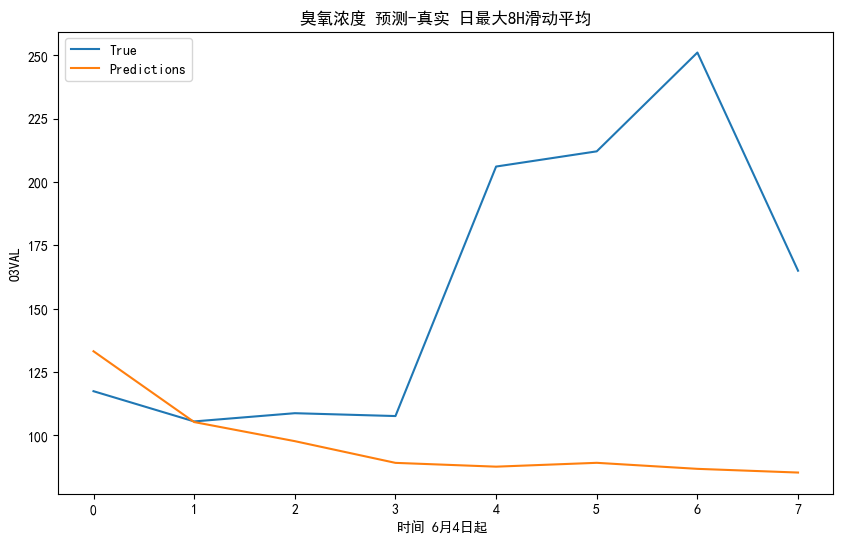

rmse: 88.90053622112409
r2 score: -1.7112731074328975
rmse: 11.149325838132643
r2 score: -2.48923674911128
rmse: 11.111186629900192
r2 score: -3.8618656380471297
rmse: 13.341187533966393
r2 score: -7.613882183590963
rmse: 54.31253429663038
r2 score: -0.9662734660758006
rmse: 70.5561429195346
r2 score: -1.2547513707249789


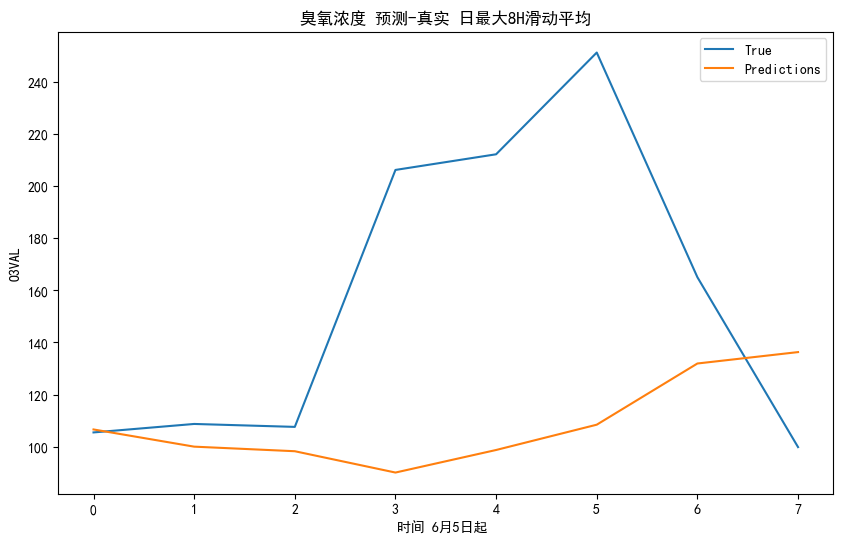

rmse: 78.45605609104464
r2 score: -0.9652310743702579
rmse: 6.205349444143367
r2 score: -13.582290830364174
rmse: 7.39468058052851
r2 score: -29.1113090932258
rmse: 58.35486809476486
r2 score: -0.8579036460367675
rmse: 72.76131366988076
r2 score: -1.1232070298749304
rmse: 88.33866086120057
r2 score: -1.1956032396599534


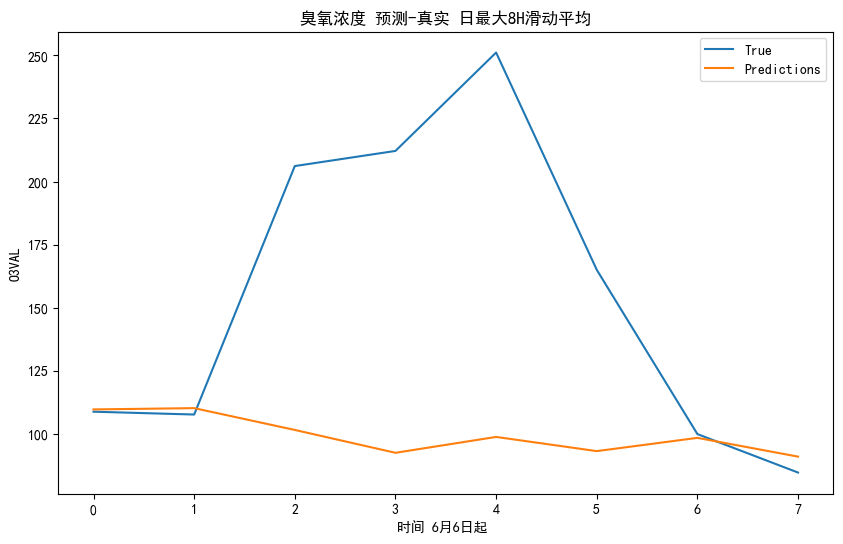

rmse: 81.92861220754013
r2 score: -0.9463631418480349
rmse: 1.9030992669134341
r2 score: -10.446634887036682
rmse: 60.41586473564891
r2 score: -0.712274943659639
rmse: 79.48377217053378
r2 score: -1.4758157284573055
rmse: 98.47830235315746
r2 score: -1.8444170798487152
rmse: 94.56596450921869
r2 score: -2.124930713934206


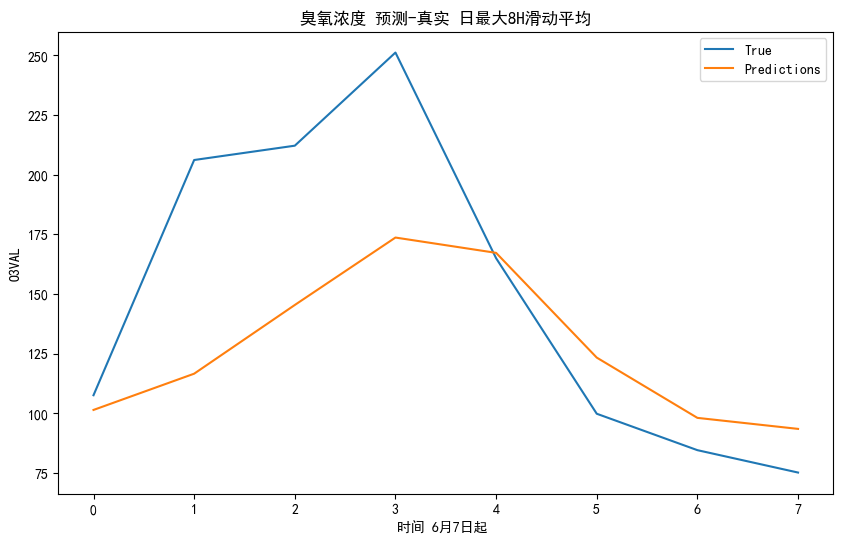

rmse: 49.45903193746244
r2 score: 0.3812977483182607
rmse: 63.41876690286716
r2 score: -0.6581473350945191
rmse: 64.53258661233377
r2 score: -0.8142697976089865
rmse: 67.99754093135232
r2 score: -0.6514289354333727
rmse: 60.82713903753539
r2 score: -0.5567375071360354
rmse: 56.35079128653502
r2 score: -0.03466181169018645


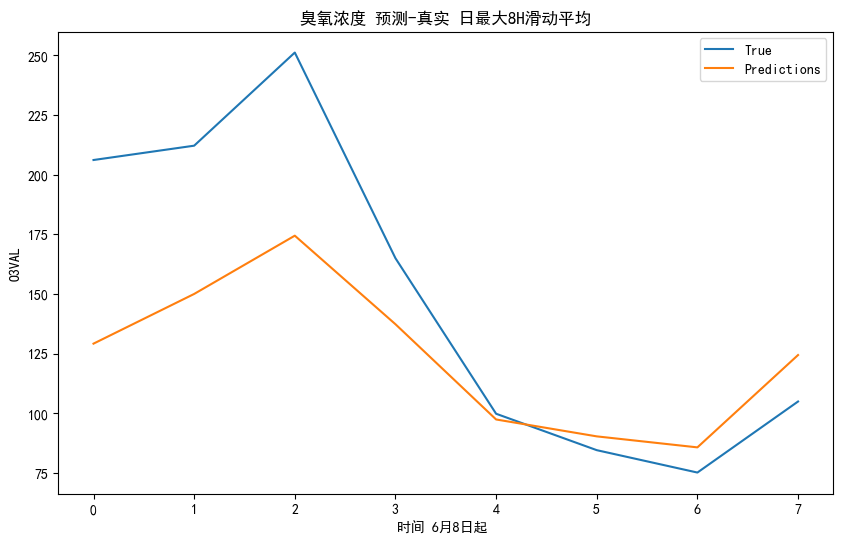

rmse: 46.0170959425598
r2 score: 0.46827493839593914
rmse: 69.88360419924858
r2 score: -541.6353484308037
rmse: 72.22156797228217
r2 score: -12.105414272298928
rmse: 64.05393108262714
r2 score: -3.4023935239252063
rmse: 57.301592375228346
r2 score: -0.24527730786381174
rmse: 52.36206269079681
r2 score: 0.24855109053059476


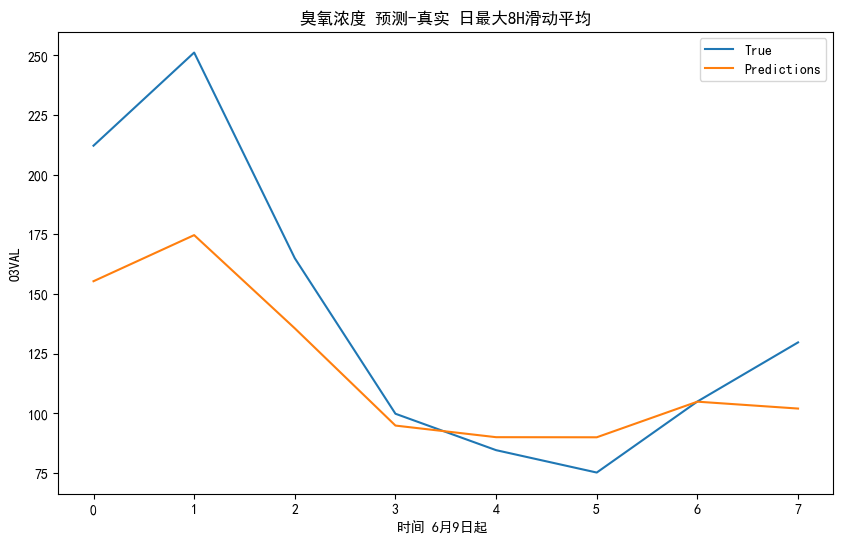

rmse: 37.02585067202478
r2 score: 0.6134714781237776
rmse: 67.32603218315813
r2 score: -10.920564390605247
rmse: 57.52558541142483
r2 score: -1.6688759002596334
rmse: 49.88011885643639
r2 score: 0.21755831452422814
rmse: 44.6802851272186
r2 score: 0.5085278619550653
rmse: 41.23047780028101
r2 score: 0.6174258489413542


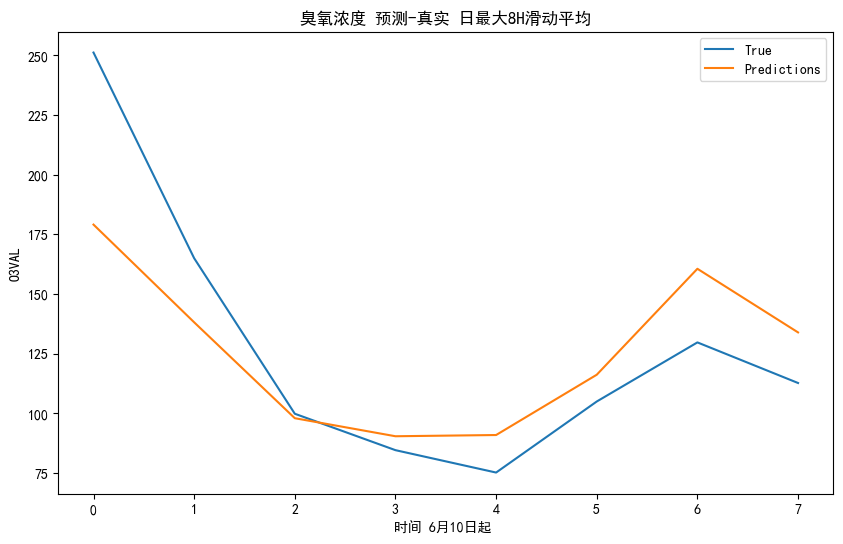

rmse: 31.064915112859726
r2 score: 0.6606239574650965
rmse: 54.362966800658754
r2 score: -0.5937045818461759
rmse: 44.40025986936176
r2 score: 0.4862524659769252
rmse: 38.56198665594069
r2 score: 0.6549336244225248
rmse: 35.199553453954216
r2 score: 0.7148601507772325
rmse: 32.457203992358586
r2 score: 0.7188885687566068


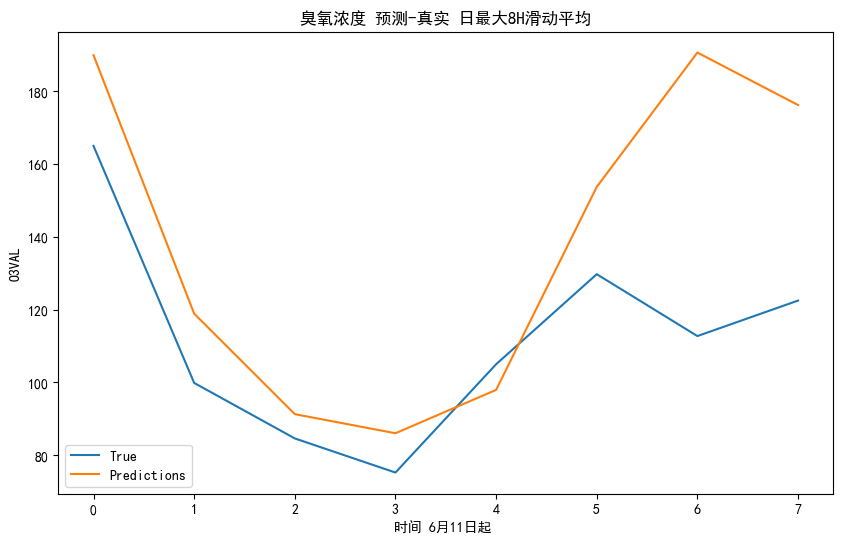

rmse: 36.6115240693927
r2 score: -0.9388738370643848
rmse: 22.17339180813193
r2 score: 0.5363088778228247
rmse: 18.50970162984975
r2 score: 0.717990643622924
rmse: 16.914774085235283
r2 score: 0.7674297292352213
rmse: 15.4536111392635
r2 score: 0.757399207638661
rmse: 17.17206913572421
r2 score: 0.6719905140567239


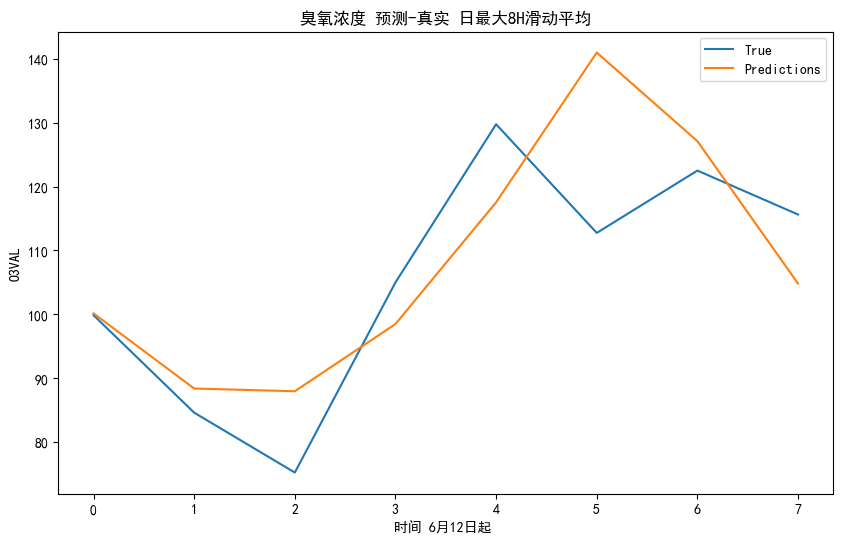

rmse: 12.758134373119692
r2 score: 0.4607191614666819
rmse: 2.677889204123825
r2 score: 0.8766595544928708
rmse: 7.6614122174139325
r2 score: 0.43002783965878255
rmse: 7.389885648242238
r2 score: 0.6122301907500421
rmse: 8.576314581929475
r2 score: 0.7902054804972496
rmse: 13.929181540877957
r2 score: 0.3914092931642008


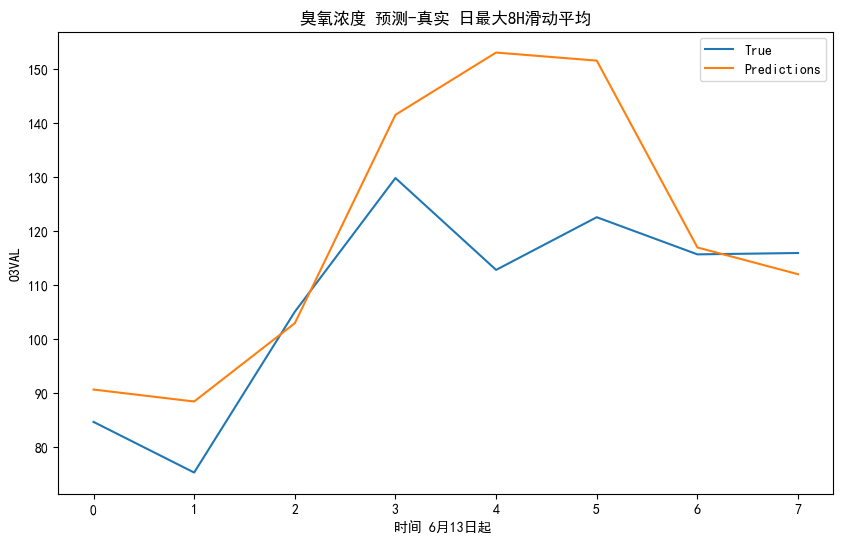

rmse: 18.78925859196823
r2 score: -0.15130380886708483
rmse: 10.21348630144044
r2 score: -3.74750531946776
rmse: 8.428647688617199
r2 score: 0.539383476995348
rmse: 9.354322579479788
r2 score: 0.8001970495785153
rmse: 19.837769648321956
r2 score: -0.029824421991636152
rmse: 21.630492559494016
r2 score: -0.2317578880279889


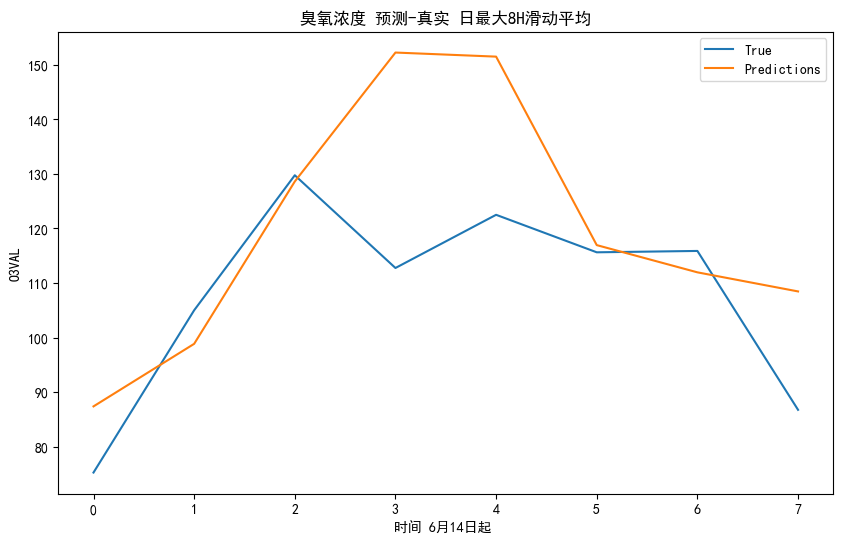

rmse: 19.60589269529808
r2 score: -0.303503725761179
rmse: 9.617807837357425
r2 score: 0.5819403597086807
rmse: 7.880554524397266
r2 score: 0.8749006504192745
rmse: 20.893443627660425
r2 score: -0.12234699435869234
rmse: 22.746302100496923
r2 score: -0.45178461284024496
rmse: 20.771411358059286
r2 score: -0.42397119677803063


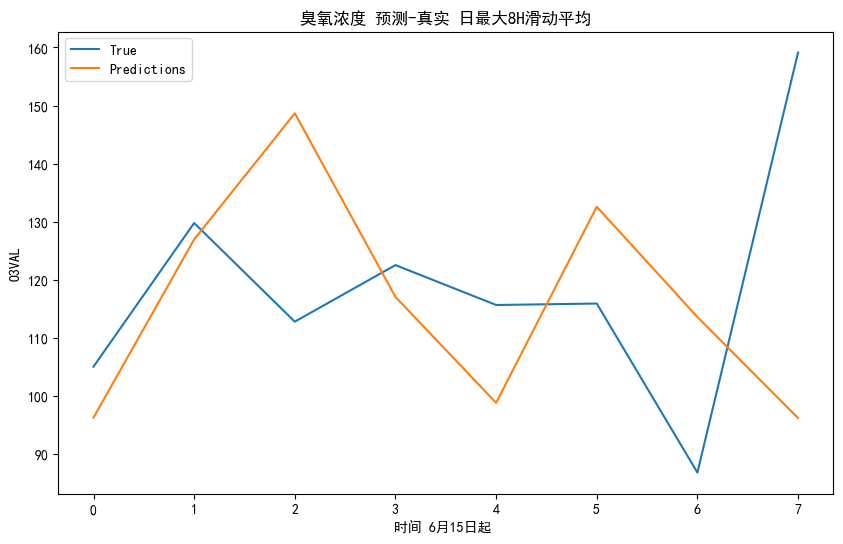

rmse: 28.836024579373664
r2 score: -1.1943829599792695
rmse: 6.522694508619835
r2 score: 0.7221799006450487
rmse: 21.402155701423606
r2 score: -3.2869834062257217
rmse: 18.736089387228645
r2 score: -2.9679666043232427
rmse: 18.3764496750252
r2 score: -3.7337501686873473
rmse: 18.104156038258974
r2 score: -4.493352004364485


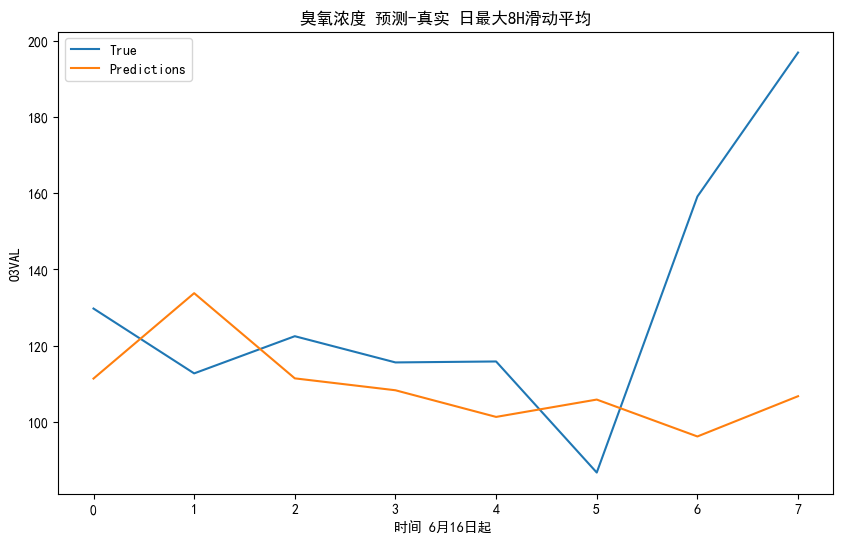

rmse: 41.24542954374738
r2 score: -0.7116576606348275
rmse: 19.738375452132463
r2 score: -4.39243550850305
rmse: 17.333454848866168
r2 score: -5.19304417515978
rmse: 15.448596318178765
r2 score: -4.520747899764963
rmse: 15.270664071747078
r2 score: -5.215791322217627
rmse: 15.980005849913507
r2 score: -0.43125971207811253


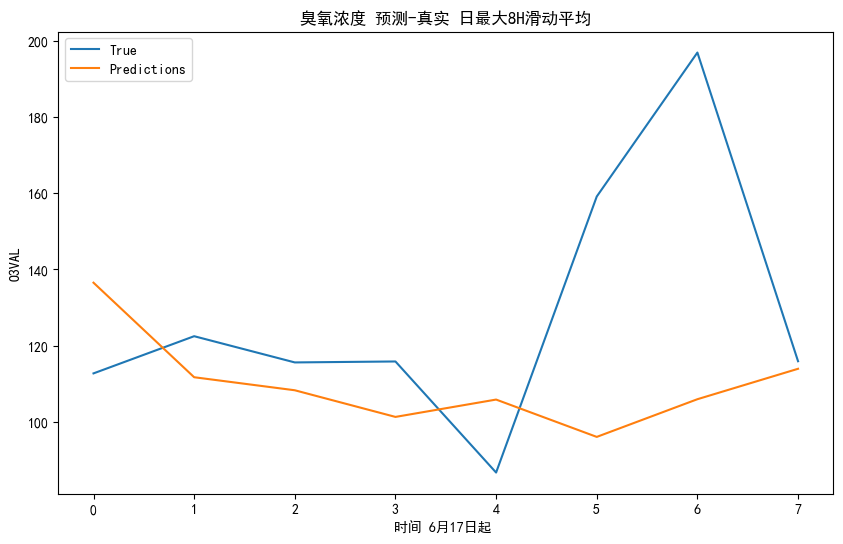

rmse: 41.15588831953566
r2 score: -0.6683012969967503
rmse: 18.455760765122445
r2 score: -13.3322595311267
rmse: 15.6473720120878
r2 score: -13.632494761316572
rmse: 15.37733840596736
r2 score: -17.517714693061954
rmse: 16.19906022968888
r2 score: -0.7082148036102163
rmse: 29.677437983943214
r2 score: -0.9412388057344119


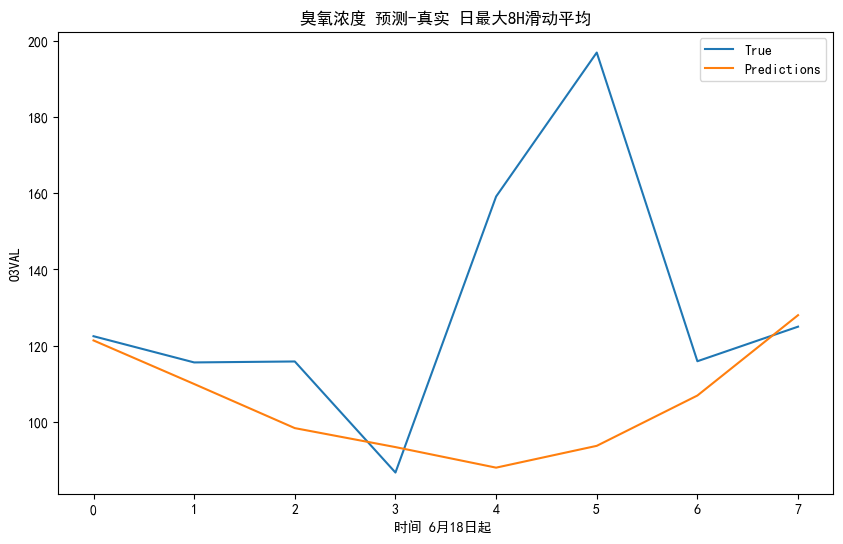

rmse: 44.94573753017428
r2 score: -1.0520321544671556
rmse: 4.075022219724669
r2 score: -0.4053178047470878
rmse: 10.623319233889259
r2 score: -10.134708641656385
rmse: 9.78654212479449
r2 score: 0.49778250894786014
rmse: 32.9755804543268
r2 score: -1.0296715213588152
rmse: 51.754321348460756
r2 score: -1.1127394323647901


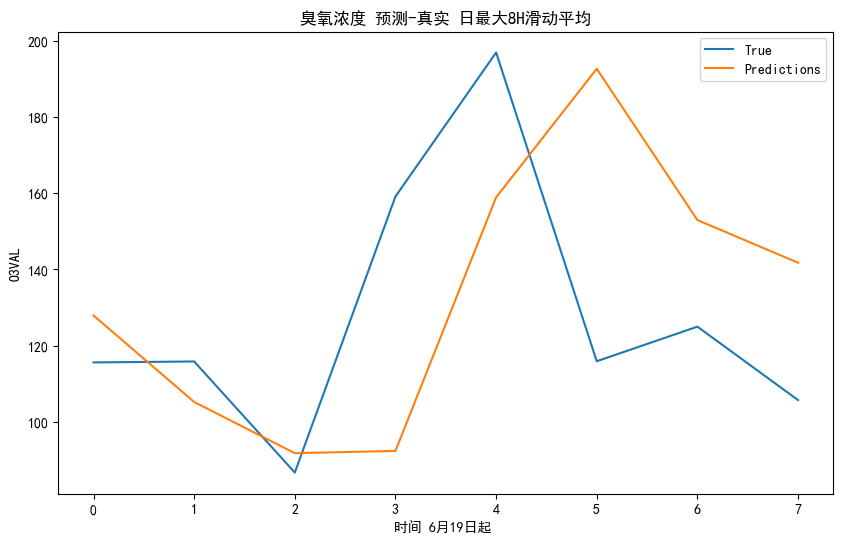

rmse: 42.03917223869134
r2 score: -0.6906538108604854
rmse: 11.492478678765258
r2 score: -8451.932235639939
rmse: 9.831161055971075
r2 score: 0.4828673791957311
rmse: 34.419893413545736
r2 score: -0.7743687941645938
rmse: 35.15794737864751
r2 score: 0.17370242616721232
rmse: 44.83198337772345
r2 score: -0.5505137134220035


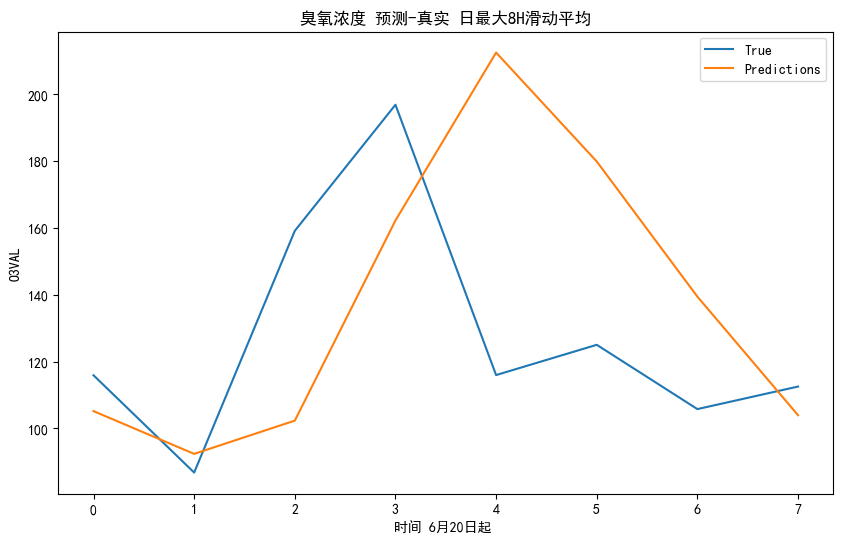

rmse: 47.594893060836256
r2 score: -1.145618053978894
rmse: 8.557670754595428
r2 score: 0.6546660546615555
rmse: 33.54718273280423
r2 score: -0.2729371626316144
rmse: 33.82709525489636
r2 score: 0.34777337770904004
rmse: 52.730703148337284
r2 score: -0.8617024348313858
rmse: 53.095381736413074
r2 score: -1.2404841432341507


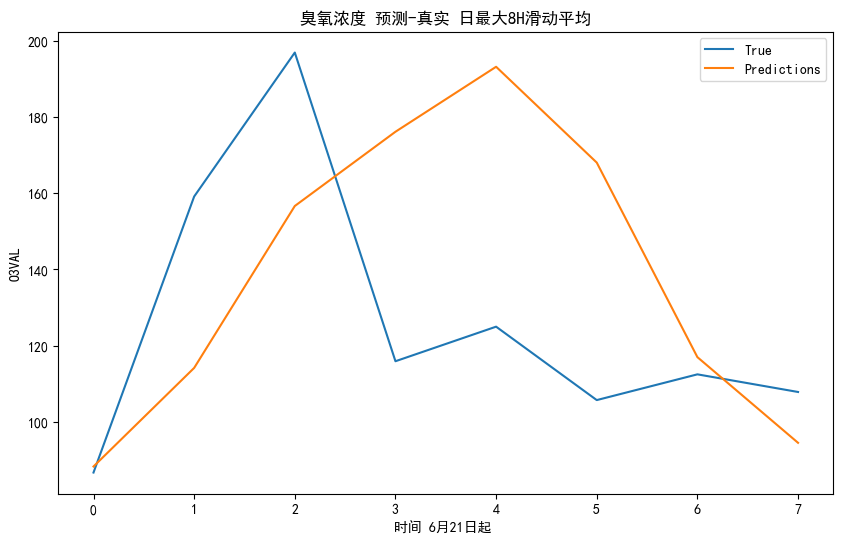

rmse: 44.694409316700735
r2 score: -0.8402987116471878
rmse: 31.79714550108612
r2 score: 0.22792568248986922
rmse: 34.8380030467793
r2 score: 0.41869290622070365
rmse: 42.607013244065364
r2 score: -0.03517819426170554
rmse: 48.79569769563527
r2 score: -0.6565051418649357
rmse: 51.288041818096204
r2 score: -0.976042251926726


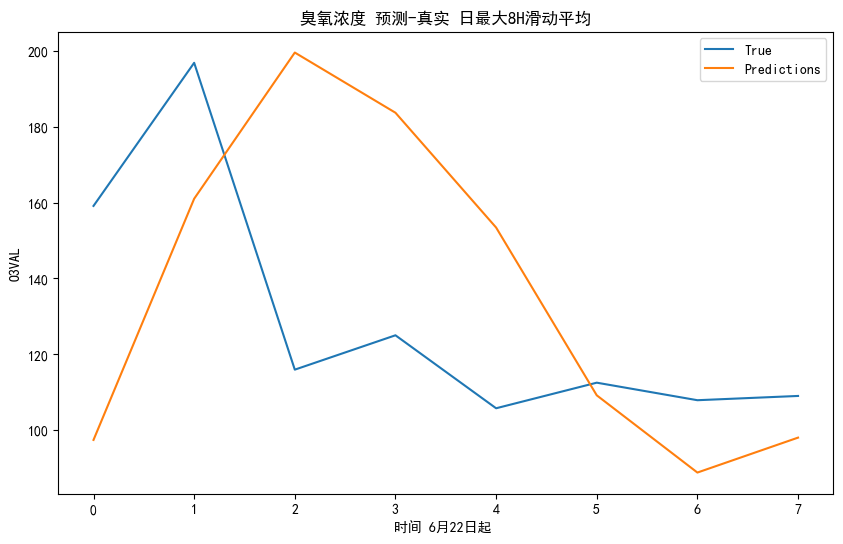

rmse: 47.83765006925487
r2 score: -1.4873552496737346
rmse: 50.477362933637885
r2 score: -6.151866444409841
rmse: 63.48772401261124
r2 score: -2.686195053706767
rmse: 62.326538600884156
r2 score: -2.823949169365575
rmse: 59.68492516779358
r2 score: -2.194218498335373
rmse: 54.50163769245753
r2 score: -1.8601976243944929


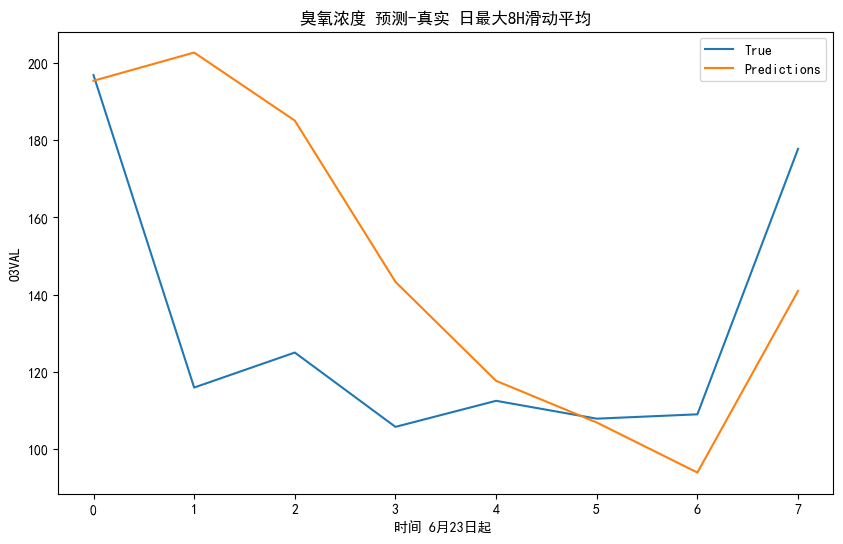

rmse: 42.0724458070688
r2 score: -0.6118049386694717
rmse: 61.36449089296955
r2 score: -1.299294977936896
rmse: 60.94005639920546
r2 score: -1.8327102189846025
rmse: 56.01782342777167
r2 score: -1.4399869307186122
rmse: 50.1573440221395
r2 score: -1.2534643585154042
rmse: 45.78896968989777
r2 score: -1.0841778230493864


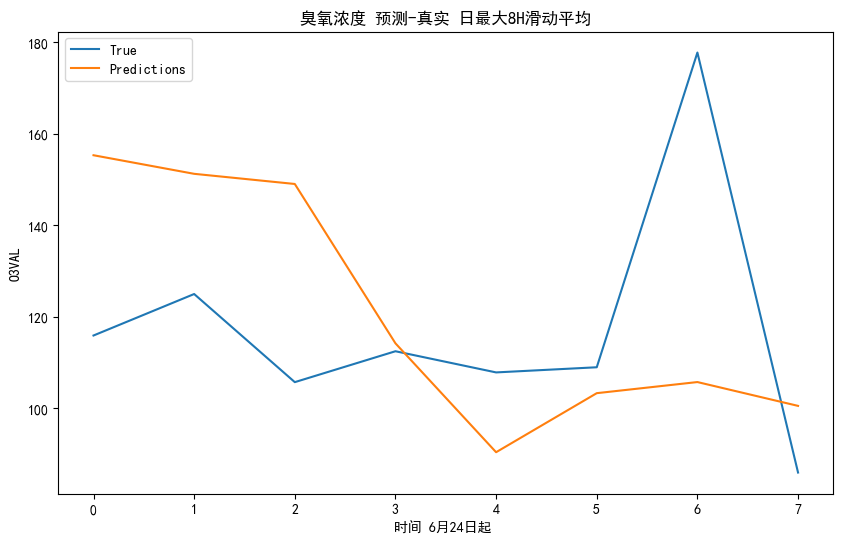

rmse: 35.0833016513906
r2 score: -0.9658210313104663
rmse: 33.468642721546324
r2 score: -53.55570257871373
rmse: 37.03273977248062
r2 score: -21.180295033551225
rmse: 32.08293111339593
r2 score: -20.385423386178935
rmse: 29.735967761264227
r2 score: -18.15104699783838
rmse: 27.243227288604754
r2 score: -17.02305214110699


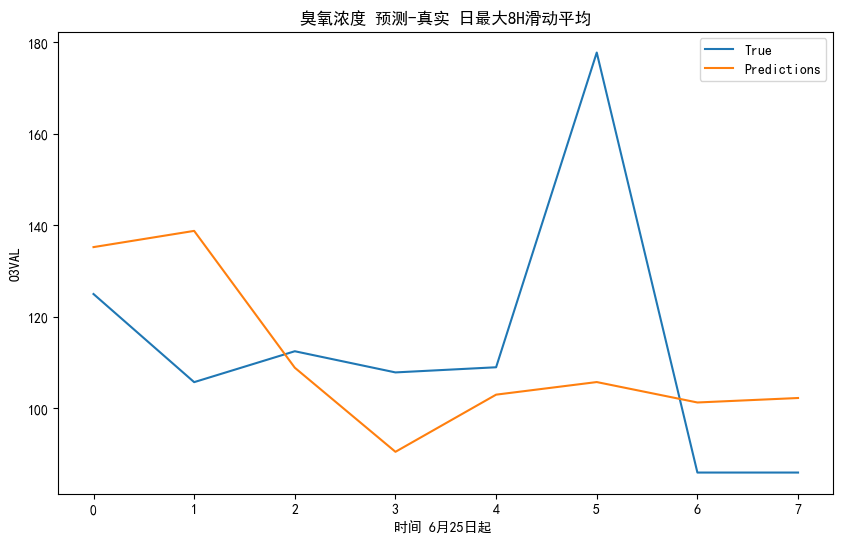

rmse: 30.056692033370602
r2 score: -0.22800974437896837
rmse: 24.46233940090443
r2 score: -5.4594344971770346
rmse: 20.081283972959756
r2 score: -5.340810996329072
rmse: 19.43317628549236
r2 score: -5.777404103052196
rmse: 17.586333218435534
r2 score: -5.599362340122674
rmse: 33.48583833249023
r2 score: -0.754712056900803


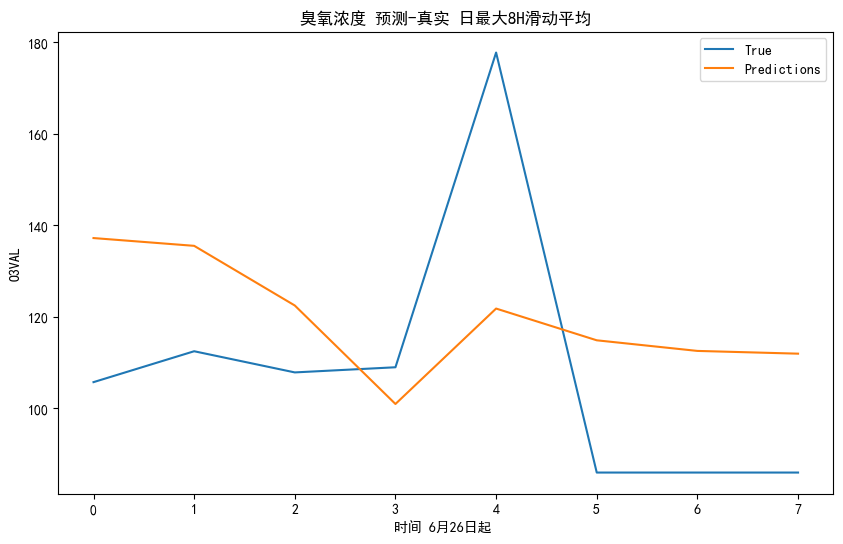

rmse: 29.878091523009324
r2 score: -0.12688325569282877
rmse: 27.57587121294285
r2 score: -65.75917020820282
rmse: 24.045060194992526
r2 score: -71.80782549054415
rmse: 21.20636748142313
r2 score: -74.30712383962913
rmse: 31.389491277476804
r2 score: -0.28654877460433337
rmse: 30.986778235013006
r2 score: -0.16526443762160659


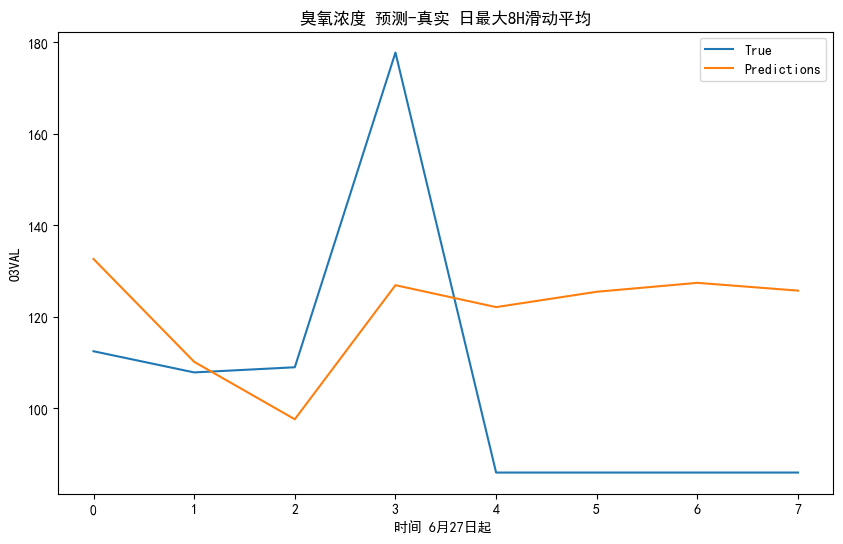

rmse: 34.070359490951034
r2 score: -0.3653118433261673
rmse: 14.347092050532385
r2 score: -37.491451335610726
rmse: 13.425637393465694
r2 score: -45.47390237528864
rmse: 27.944717264019452
r2 score: 0.10121401022461485
rmse: 29.765166278714084
r2 score: 0.07824784914349836
rmse: 31.595562413637474
r2 score: -0.05213720751400652


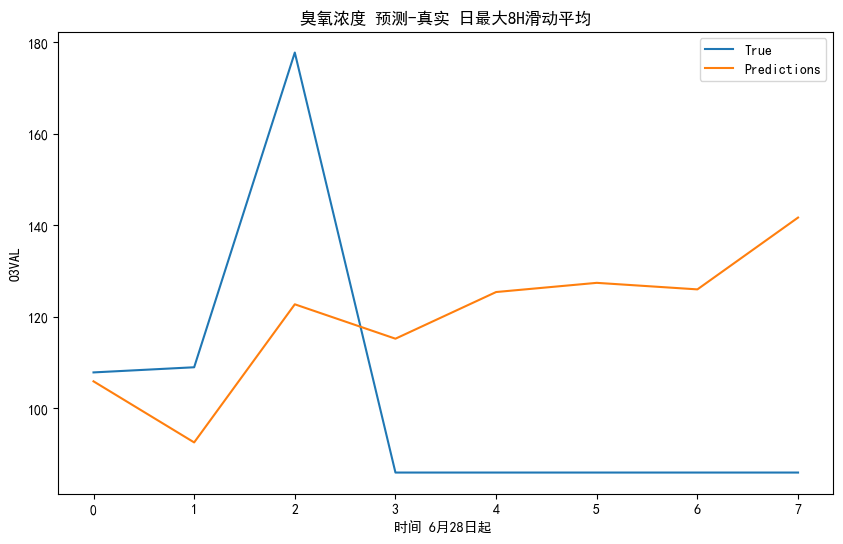

rmse: 38.93758365392465
r2 score: -0.7101812913368137
rmse: 11.689791094923208
r2 score: -430.885324145607
rmse: 33.1558900809129
r2 score: -0.029496725704343918
rmse: 32.22154634593914
r2 score: 0.1273525447384688
rmse: 33.7875261067724
r2 score: -0.002755406791478343
rmse: 35.179037996619655
r2 score: -0.1759241388381394


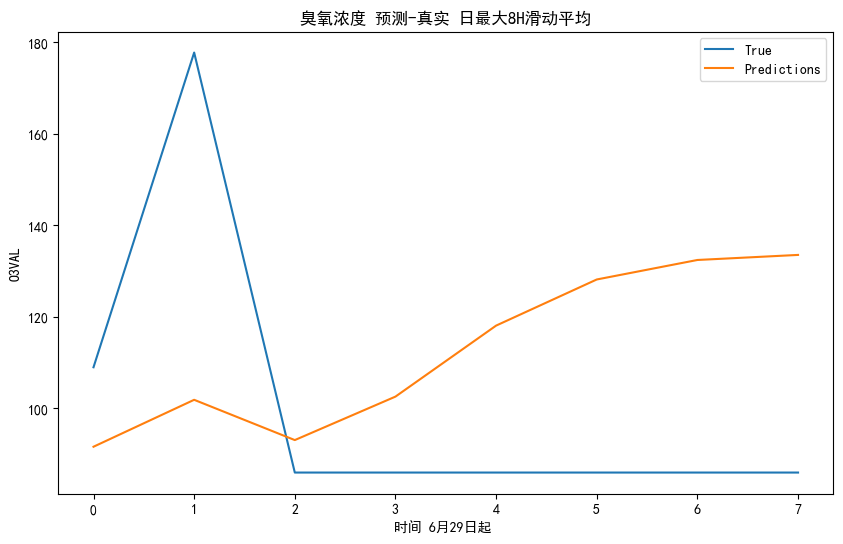

rmse: 41.241542499766055
r2 score: -0.8636762392166548
rmse: 55.02583146396939
r2 score: -1.5624052391573482
rmse: 45.114642845174444
r2 score: -0.33965784431186674
rmse: 39.941215630010205
r2 score: -0.12838353370327682
rmse: 38.5008944186143
r2 score: -0.17391869157073714
rmse: 39.137399897656216
r2 score: -0.36104538425214683


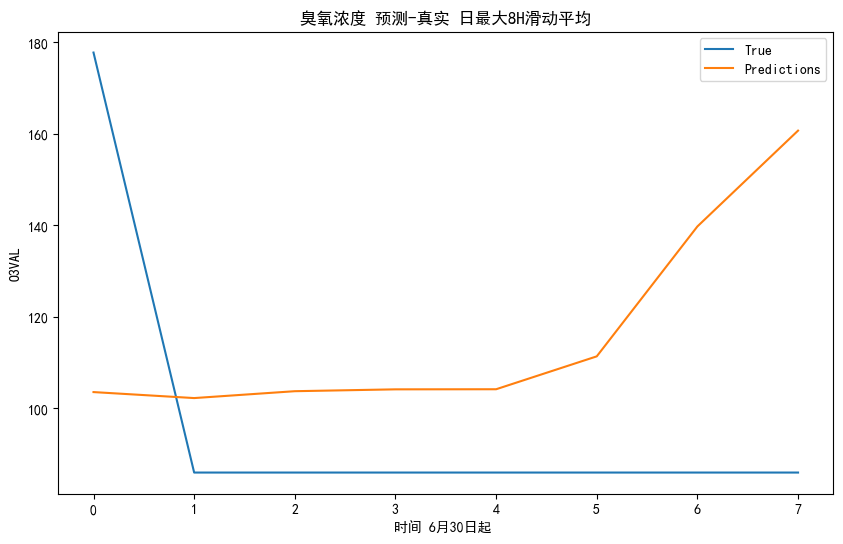

rmse: 44.52152246040549
r2 score: -1.1528303247640421
rmse: 53.693845199726844
r2 score: -0.3699252113332394
rmse: 45.025464053364715
r2 score: -0.08371918829229075
rmse: 40.03823293977752
r2 score: -0.015632023443168386
rmse: 36.72439512456928
r2 score: -0.0013298764305085253
rmse: 35.08956649396399
r2 score: -0.053116352187585925


In [44]:
# 创建滑动窗口计算平均值的函数
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
def sliding_window_average(data, window_size):
    # 保存滑动平均值的列表
    averaged_data = []
    # 用滑动窗口计算平均值
    len1 = len(data)
    for i in range(len1 - window_size + 1):
        avg = np.mean(data[i:i + window_size])
        averaged_data.append(avg)
    return averaged_data


def max_values(data, interval):
    averaged_data = []
    for i in range(0, len(data), 24):
        avg = max(data[i:i+interval])
        averaged_data.append(avg)
    return averaged_data

# 使用滑动窗口大小为8来计算滑动平均值
window_size = 8
for i in range(len(df_list)):
    y_test_sw_avg_8 = sliding_window_average(y_list[i].values, window_size)
    y_pred_sw_avg_8 = sliding_window_average(y_pred_list[i], window_size)
    y_test_sw_max_8 = max_values(y_test_sw_avg_8, 16)
    y_pred_sw_max_8 = max_values(y_pred_sw_avg_8, 16)   
    plt.figure(figsize=(10, 6))
    # 绘制每8小时为单位的滑动平均图像
    plt.title("臭氧浓度 预测-真实 日最大8H滑动平均")
    plt.plot(y_test_sw_max_8, label='True')
    plt.plot(y_pred_sw_max_8, label='Predictions')
    if 9+i <= 31:
        plt.xlabel('时间 5月'+str(9+i)+'日起 ')
    else:
        plt.xlabel('时间 6月'+str(9+i-31)+'日起 ')
    plt.ylabel('O3VAL')
    plt.legend()

    # for i in range(0, 32, 2):
    #     plt.text(i, y_test_sw_max_8[i], f'{y_test_sw_max_8[i]:.2f}', color='blue', fontsize=8, ha='right')
    #     plt.text(i, y_pred_sw_max_8[i], f'{y_pred_sw_max_8[i]:.2f}', color='orange', fontsize=8, ha='left')
    plt.show()

    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8, y_pred_sw_max_8)))
    print("r2 score:", r2_score(y_test_sw_max_8, y_pred_sw_max_8))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:2], y_pred_sw_max_8[:2])))
    print("r2 score:", r2_score(y_test_sw_max_8[:2], y_pred_sw_max_8[:2]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:3], y_pred_sw_max_8[:3])))
    print("r2 score:", r2_score(y_test_sw_max_8[:3], y_pred_sw_max_8[:3]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:4], y_pred_sw_max_8[:4])))
    print("r2 score:", r2_score(y_test_sw_max_8[:4], y_pred_sw_max_8[:4]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:5], y_pred_sw_max_8[:5])))
    print("r2 score:", r2_score(y_test_sw_max_8[:5], y_pred_sw_max_8[:5]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:6], y_pred_sw_max_8[:6])))
    print("r2 score:", r2_score(y_test_sw_max_8[:6], y_pred_sw_max_8[:6]))

# print("\ny_pred_sw_max_8   y_test_sw_max_8 ")
# for i in range(0,15):
#     print(y_pred_sw_max_8[i] , y_test_sw_max_8[i])